#### Učitavanje potrebnih biblioteka

In [413]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from scipy.stats import mode
from skimage import io, color, morphology, filters
import os

#%matplotlib notebook

# Zadatak 1
U timu predmeta na MSTeams platformi dostupna je baza slikanih šaka koje pokazuju „papir“, „kamen“ i „makaze“. 
Projektovati inovativni sistem za prepoznavanje pokazanih znakova zasnovan na testiranju hipoteza. 

a) Detaljno opisati algoritam za obradu slike i odabir obeležja koji prethodi samoj klasifikaciji. Algoritam treba da bude 
što robusniji (na različite osvetljaje, položaje šaka, načine pokazivanja znakova itd). 

b) Izvršiti podelu na trening i test skup. Rezultate klasifikacije test skupa prikazati u obliku matrice konfuzije. 

c) Odabrati dva znaka i dva obeležja takva da su odabrani znakovi što separabilniji u tom prostoru. Prikazati histogram 
obeležja za oba slova i prokomentarisati njihov oblik. 

d) Za slova i obeležja pod c) projektovati parametarski klasifikator po izboru i iscrtati klasifikacionu liniju. 

### Funkcija za preprocesiranje slike

Na slikama se nalaze različiti znakovi rukom (papir, kamen ili makaze) na zelenoj pozadini. Ideja je da od originalne RGB slike dobijemo binarnu sliku, gde će belom bojom biti predstavljena ruka, dok će pozadina biti crna.

Funkcija process_image dobija kao ulaz putanju do slike, a vraća obrađenu sliku.
Nakon što se slika učita, ona se iz RGB formata prebacuje u HSV(hue, saturation, value) format radi lakše segmentacije - u ovom formatu imamo jednostavnije definisanje opsega za određene boje, nezavisno od osvetljenja i senki. Nakon toga se definiše opseg za zelenu boju - što će predstavljati našu pozadinu.

Pomoću ovako definisanih granica, binarizujemo originalnu sliku - tako da je pozadina bele boje, a ruka crne, a potom tu binarizovanu sliku invertujemo kako bismo dobili željenu binarnu sliku, gde je ruka bela, a pozadina crna. Nakon toga vršimo inicijalno uklanjanje ivica (po 10 piksela sa svake strane) kako bi se odstranili potencijalno loše segmentisani delovi slike po ivicama.

Nad ovako dobijenom slikom vrši se zatvaranje slike kako bi se popunile sve potencijalne praznine nastale usled pogreški pri segmentaciji. Zatvaranje slike se vrši tako što se najpre primeni diletacija, a potom i erozija. Diletacija će popuniti potencijalne praznine, dok će erozija bolje oblikovati konturu nakon procesa diletacije. Za oba procesa su korišćeni su strukturni elementi dobijeni morphology.disk(2) jer obezbeđuju ivice koje su glađe u odnosu na one koje se dobijaju korišćenjem kvadratnog strukturnog elementa.

Izgled morphology.disk(2): $$
\begin{bmatrix}
0 & 1 & 1 & 1 & 0 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
0 & 1 & 1 & 1 & 0 \\
\end{bmatrix}
$$


Nakon zatvaranja slike se vrši filtriranje slike median filtrom sa maskom $7\times 7$ kako bi se otklonio "salt & pepper" šum ukoliko ga ima.

Poslednji korak u obradi slike jeste kropovanje slike, tako da se granice slike pomere ka unutra, tako da obuhvataju samo šaku. Leva granica će se pomerati ulevo sve dok ne naiđe na kolonu koja sadrži bar jedan beli piksel, analogno za ostale granice.

In [414]:
def process_image(image_path):
    image = io.imread(image_path)
    image_hsv = color.rgb2hsv(image)

    lower_green = np.array([0.25, 0.2, 0.2])  
    upper_green = np.array([0.45, 1.0, 1.0])

    image_binary = ((image_hsv[..., 0] >= lower_green[0]) & (image_hsv[..., 0] <= upper_green[0]) &
                   (image_hsv[..., 1] >= lower_green[1]) & (image_hsv[..., 1] <= upper_green[1]) &
                   (image_hsv[..., 2] >= lower_green[2]) & (image_hsv[..., 2] <= upper_green[2]))

    image_binary = ~image_binary
    image_binary = image_binary[10:image_binary.shape[0]-10, 10:]
    
    dilated = morphology.dilation(image_binary, morphology.disk(2))
    eroded = morphology.erosion(dilated, morphology.disk(2))

    closed_image = eroded.astype(np.uint8) * 255
    
    filtered_image = filters.median(closed_image, np.ones((7, 7), dtype=bool))
    
    M,N = np.shape(filtered_image)

    left = 0
    while(left < N-1 and np.sum(filtered_image[:, left] == 255) == 0):
        left += 1
    
    right = N-1
    while(right > 0 and np.sum(filtered_image[:, right] == 255) == 0):
        right -= 1
    
    up = 0
    while(up < M-1 and np.sum(filtered_image[up, :] == 255) == 0):
        up += 1
    
    down = M-1
    while(down > 0 and np.sum(filtered_image[down, :] == 255) == 0):
        down -= 1

    cropped_image = filtered_image[up:down, left:right]

    return cropped_image


## Odabir atributa

Jedan atribut će nam biti procenat belih piksela u delu slike. Deo slike u kome posmatramo jeste deo od kolone $\lfloor \frac{width}{7.5} \rfloor$ do kolone $\lfloor \frac{width}{2.5} \rfloor$, gde width predstavlja širinu slike.

Drugi argument će biti odnos visine i širine slike : $\frac{height}{width} \cdot 100 \text{%} $

Motiv za odabir prvog atribut : Kod makaza očekujemo da se u tom delu slike javlja praznina zbog razmaka između kažiprsta i srednjeg prsta prilikom prikazivanja ovog znaka, dok kod kamena bi taj deo trebalo da bude ispunjen belim pikselima jer je tada stisnuta pesnica.

Motiv za odabir drugog atribut : Pošto kod makaza imamo ispružene prste, očekujemo da kropovana slika bude nešto šira nego kod znaka kamen, gde su svi prsti skupljeni. Gledamo odnos širine i visine kako bismo imali neki vid normalizacije.

In [415]:
def calculate_white_percentage(image):
    width = image.shape[1]
    
    start = int(np.floor(width / 7.5))
    stop = int(np.floor(width / 2.5))
    
    left_part = image[:, start:stop]
    
    white_pixels = np.sum(left_part == 255)
    total_pixels = left_part.size
    
    percentage = (white_pixels / total_pixels)
    
    return percentage

In [416]:
def find_features(images):
    features = np.zeros((2, len(images)))
    
    for i, image in enumerate(images):
        features[0, i] = calculate_white_percentage(image)
        features[1, i] = image.shape[0]/image.shape[1]
    
    return features

## Preprocesiranje slika
U promenljivu path je potrebno uneti putanju do foldera ROCKPAPERSCISSORS. Zatim se kreira putanja do svakog od foldera paper, rock scissors, prolazi se kroz slike koje se nalaze u folderima i procesirane slike se stavljaju u listu koja odgovara folderu iz kog dolaze.

In [417]:
rock_processed = [] 
scissors_processed = []
paper_processed = []

path = r'D:\ETF\semestar7\PO\Projekat'
folder_path = os.path.join(path, 'ROCKPAPERSCISSORS')
folder_paper = os.path.join(folder_path,'paper')
folder_rock = os.path.join(folder_path,'rock')
folder_scissors = os.path.join(folder_path,'scissors')

for filename in os.listdir(folder_scissors):
    image_path = os.path.join(folder_scissors, filename)
    scissors_processed.append(process_image(image_path))

for filename in os.listdir(folder_rock):
    image_path = os.path.join(folder_rock, filename)
    rock_processed.append(process_image(image_path))
    
for filename in os.listdir(folder_paper):
    image_path = os.path.join(folder_paper, filename)
    paper_processed.append(process_image(image_path))

### Primer obradjenih slika

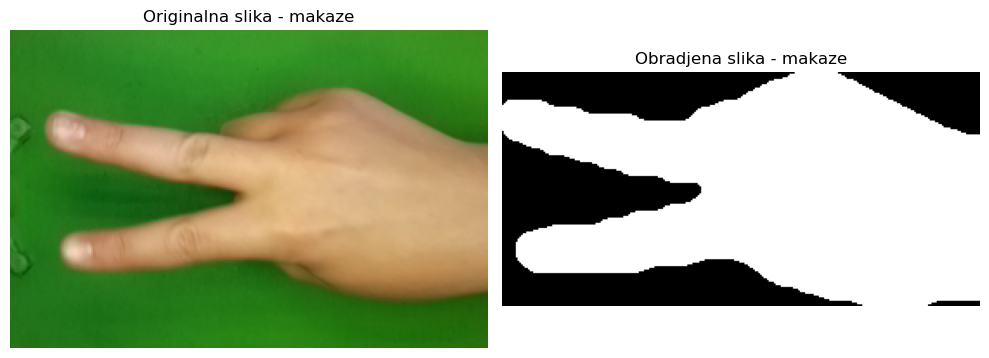

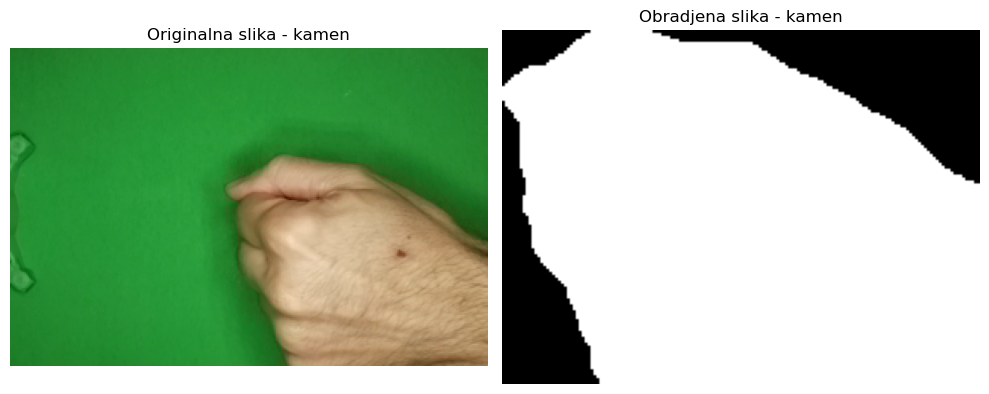

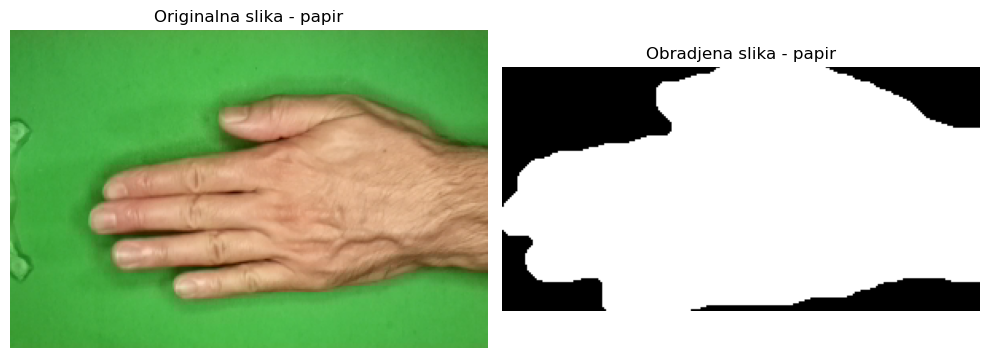

In [418]:
image_path = os.path.join(folder_scissors, os.listdir(folder_scissors)[2])
image = process_image(image_path)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(io.imread(image_path))
ax[0].set_title("Originalna slika - makaze")
ax[0].axis("off")

ax[1].imshow(image, cmap='gray')
ax[1].set_title("Obradjena slika - makaze")
ax[1].axis("off")

plt.tight_layout()
plt.show()


image_path = os.path.join(folder_rock, os.listdir(folder_rock)[2])
image = process_image(image_path)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(io.imread(image_path))
ax[0].set_title("Originalna slika - kamen")
ax[0].axis("off")

ax[1].imshow(image, cmap='gray')
ax[1].set_title("Obradjena slika - kamen")
ax[1].axis("off")

plt.tight_layout()
plt.show()


image_path = os.path.join(folder_paper, os.listdir(folder_paper)[0])
image = process_image(image_path)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(io.imread(image_path))
ax[0].set_title("Originalna slika - papir")
ax[0].axis("off")

ax[1].imshow(image, cmap='gray')
ax[1].set_title("Obradjena slika - papir")
ax[1].axis("off")

plt.tight_layout()
plt.show()

## Klasifikacija sva tri znaka

In [419]:
def gaussian_pdf(X, M, S):
    detS = np.linalg.det(S)
    invS = np.linalg.inv(S)
    n = S.shape[1]
    f = 1/(2*np.pi*detS**0.5)*np.exp(-0.5*(X-M).T@invS@(X-M))
    return f[0,0]


def plot_cm(Y, Y_pred):
    cm = confusion_matrix(Y, Y_pred)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()
    
    
def predict(X, M_list, S_list):
    Y_pred = np.zeros(X.shape[1])
    for i in range(X.shape[1]):
        odb = X_train[:, i].reshape(-1, 1)
        fs = []
        for M, S in zip(M_list, S_list):
            fs.append(gaussian_pdf(odb, M, S))
        Y_pred[i] = np.argmax(fs) + 1
    return Y_pred

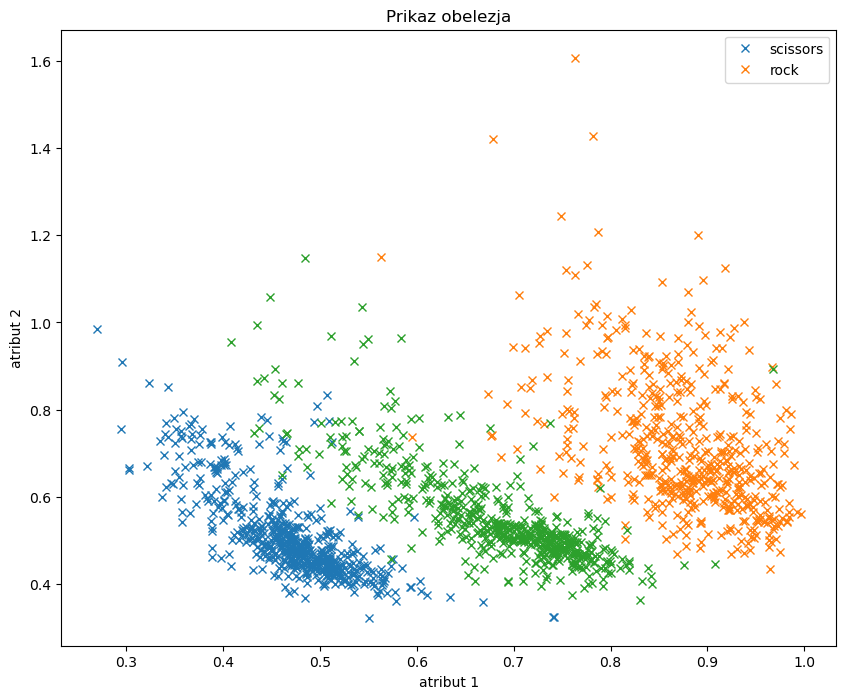

In [420]:
features_paper = find_features(paper_processed)
features_rock = find_features(rock_processed)
features_scissors = find_features(scissors_processed)

X = np.concatenate((features_scissors, features_rock, features_paper), axis=1)
Y = np.ones((X.shape[1]))
Y[s_dim:s_dim+r_dim] = 2
Y[s_dim+r_dim:] = 3

X_train, X_test, Y_train, Y_test = train_test_split(X.T, Y, test_size=0.2, stratify=Y, random_state=42)
X_train = X_train.T
X_test = X_test.T
X1 = X_train[:,Y_train==1]
X2 = X_train[:,Y_train==2]
X3 = X_train[:,Y_train==3]

plt.figure(figsize=(10,8))
plt.plot(X1[0,:], X1[1,:], 'x')
plt.plot(X2[0,:], X2[1,:], 'x')
plt.plot(X3[0,:], X3[1,:], 'x')
plt.legend(['scissors', 'rock'])
plt.title('Prikaz obelezja')
plt.xlabel('atribut 1')
plt.ylabel('atribut 2')
plt.show()

M1 = np.mean(X1, axis=1)
M2 = np.mean(X2, axis=1)
M3 = np.mean(X3, axis=1)
S1 = np.cov(X1)
S2 = np.cov(X2)
S3 = np.cov(X3)
P1 = X1.shape[1]/X_train.shape[1]
P2 = X2.shape[1]/X_train.shape[1]
P3 = 1 - P1 - P2

### Trening set

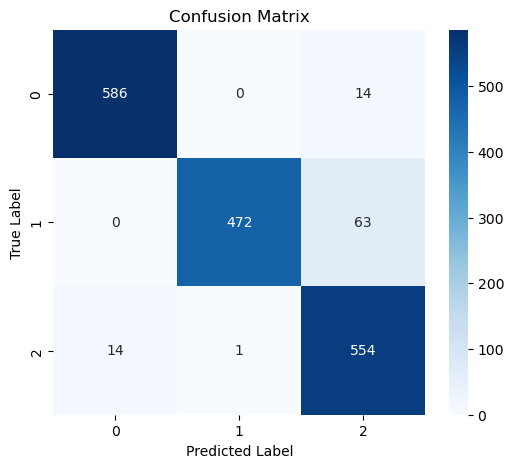

In [421]:
Y_train_pred = predict(X_train, [M1, M2, M3], [S1, S2, S3])
plot_cm(Y_train, Y_train_pred)

### Test set

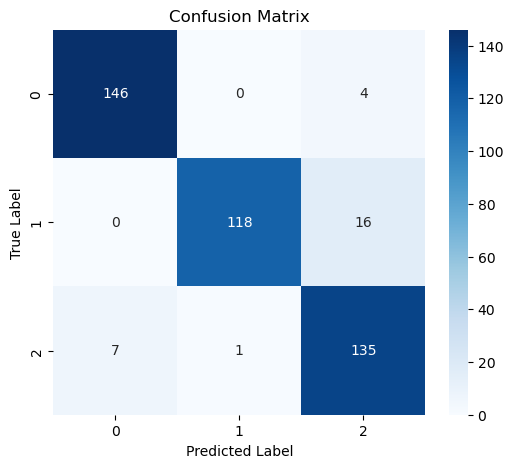

In [422]:
Y_train_pred = predict(X_test, [M1, M2, M3], [S1, S2, S3])
plot_cm(Y_test, Y_test_pred)

## Klasifikacija dva znaka


Znakovi koji će biti klasifikovani su scissors i rock kojima će redom biti dodeljene labele 1 i 2.

### Izdvajanje obeležja

In [423]:
features_s = find_features(scissors_processed)
features_r = find_features(rock_processed)

### Analiza balansiranosti

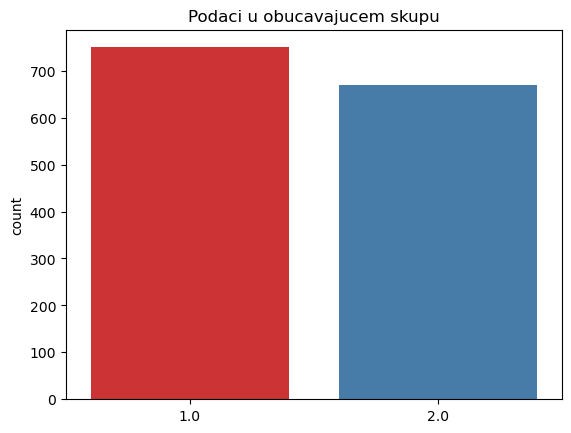

In [424]:
X = np.concatenate((features_s, features_r), axis=1)
Y = np.ones((X.shape[1]))
Y[features_s.shape[1]:] = 2

plt.figure()
sns.countplot(x=Y, palette='Set1', hue=Y, legend=False)
plt.title('Podaci u obucavajucem skupu')
plt.show()

Vidimo da je skup balansiran, međutim svakako možemo pri poredli na test i trening skup vršiti stratifikaciju.

### Podela na trening i test skup

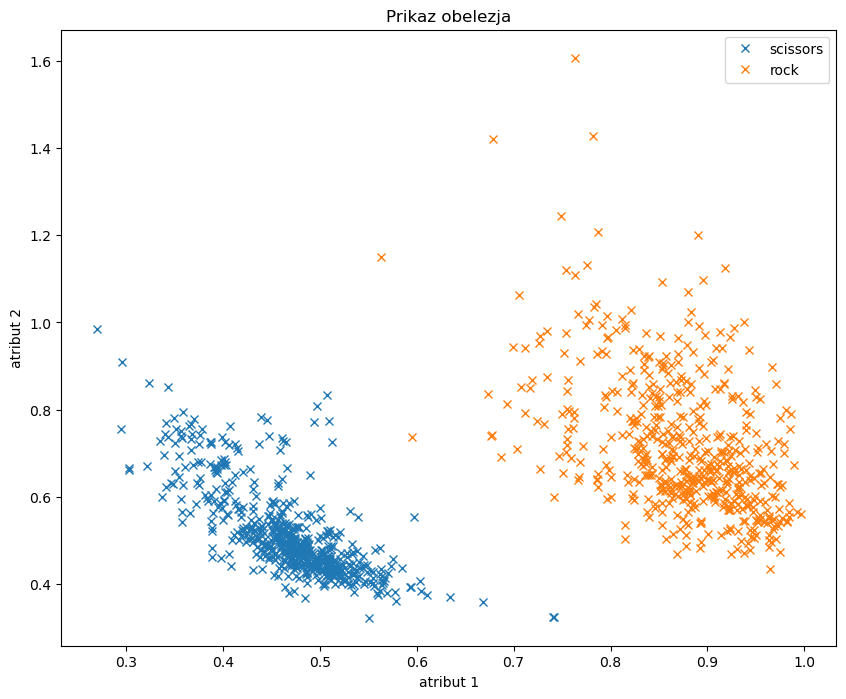

In [425]:
X_train, X_test, Y_train, Y_test = train_test_split(X.T, Y, test_size=0.2, stratify=Y, random_state=42)
X_train = X_train.T
X_test = X_test.T
X1 = X_train[:,Y_train==1]
X2 = X_train[:,Y_train==2]

plt.figure(figsize=(10,8))
plt.plot(X1[0,:], X1[1,:], 'x')
plt.plot(X2[0,:], X2[1,:], 'x')
plt.legend(['scissors', 'rock'])
plt.title('Prikaz obelezja')
plt.xlabel('atribut 1')
plt.ylabel('atribut 2')
plt.show()

### Histogrami

Biće prikazani 2d histogrami za svaku klasu, kao i histogrami za svako obeležje zasebno

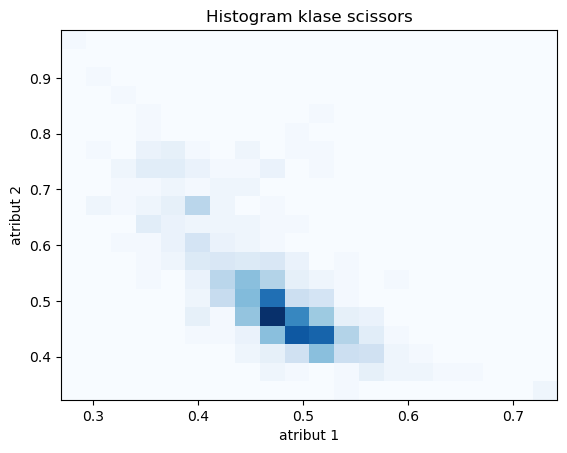

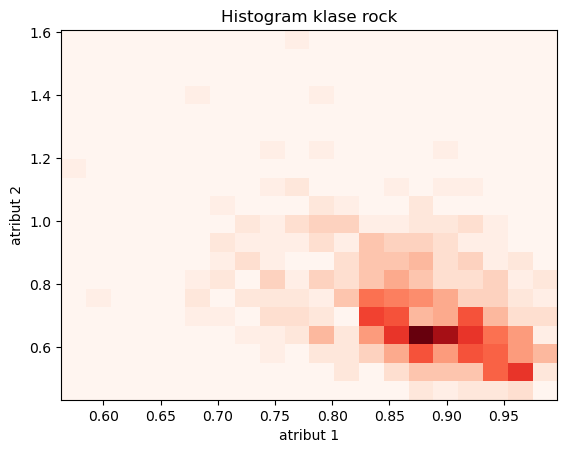

In [426]:
plt.figure()
plt.hist2d(X1[0,:], X1[1,:], bins=20, alpha=1, cmap='Blues')
plt.title('Histogram klase scissors')
plt.xlabel('atribut 1')
plt.ylabel('atribut 2')
plt.show()

plt.figure()
plt.hist2d(X2[0,:], X2[1,:], bins=20, alpha=1, cmap='Reds')
plt.title('Histogram klase rock')
plt.xlabel('atribut 1')
plt.ylabel('atribut 2')
plt.show()

Histogram klase scissors: Klasa je koncentrisana u užem opsegu vrednosti oba obeležja, uočavamo grupisanost oko centra i izražen peak. Ovo sugeriše da klasa ima relativno malu varijansu.

Histogram klase rock : Takođe se vidi centralna tendencija, međutim rasejanje ove klase je dosta veće.

Povoljna stvar za klasifikaciju jeste to što su centri dosta udaljeni jedni od drugih.

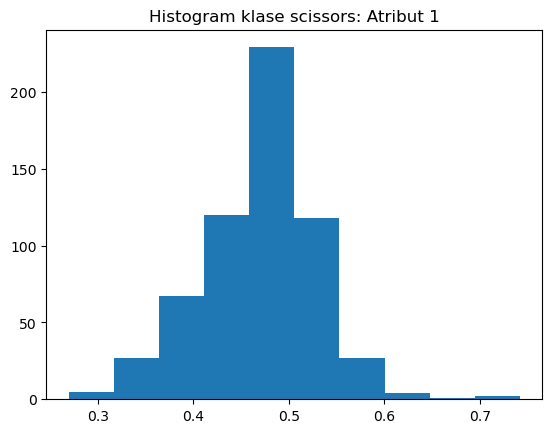

In [427]:
plt.hist(X1[0,:])
plt.title('Histogram klase scissors: Atribut 1')
plt.show()

Raspodela je relativno simetrična i liči na Normalnu raspodelu. Većina odbiraka se nalazi u opsegu vrednosti od 40 do 60.

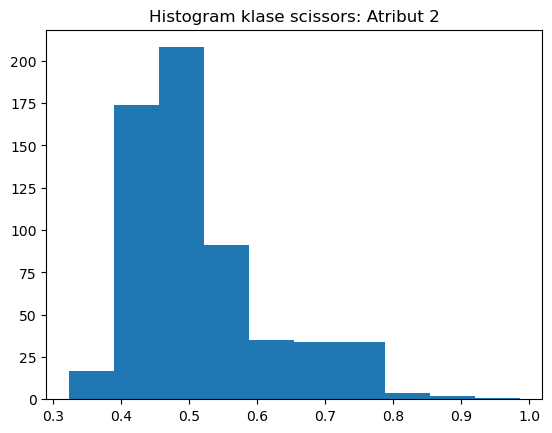

In [428]:
plt.hist(X1[1,:])
plt.title('Histogram klase scissors: Atribut 2')
plt.show()

Nema simetričnosti - izražen skewness - izraženi desni rep.

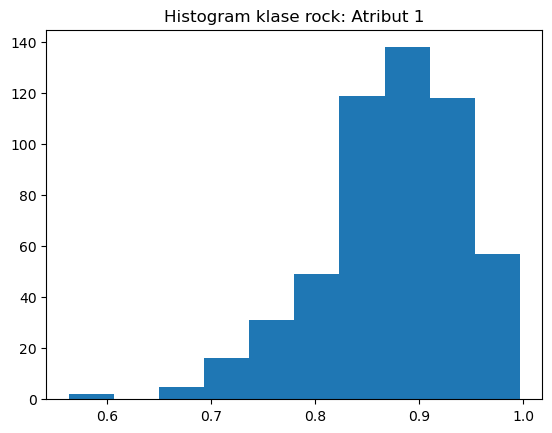

In [429]:
plt.hist(X2[0,:])
plt.title('Histogram klase rock: Atribut 1')
plt.show()

Za razliku od klase 1, ovde nema simetričnosti - međutim to je i za očekivati uzevši u obzir da je maksimalna vrednost ovog atributa 100%, pa samim tim postoji odsecanje desnog dela  raspodela na vrednosti 100. Ovo podesća na normalnu raspodelu, gde postoji limit sa desne strane. Vraijansa je dosta veća nego kod prve klase.

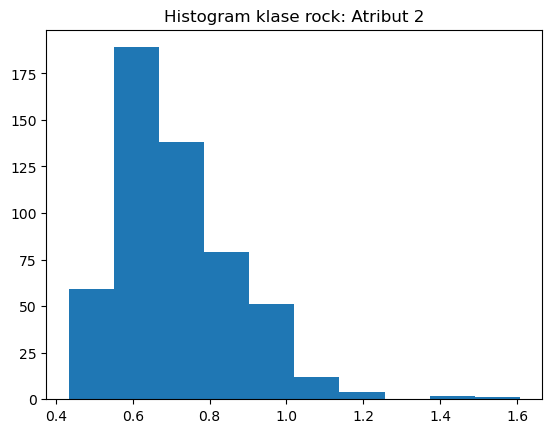

In [430]:
plt.hist(X2[1,:])
plt.title('Histogram klase rock: Atribut 2')
plt.show()

Slično kao i kod klase scissors - izraženi skewness. Centar je pomeren udesno u odnosu na klasu scissors. Vidimo postojanje nekih ekstremnih vrednost u oksegu od 140 do 160.

### Klasifikacija
Za klasifikaciju će biti korišćen linearni klasifikator projektovan drugom numeričkom metodon (metod resupstitucije). Detaljnije o ovom metodu će biti reči u Zadatku 3.

In [431]:
def druga_num_metoda(X1, X2):
    N1 = X1.shape[1]
    N2 = X2.shape[1]
    
    M1_est = np.mean(X1, axis=1).reshape(-1,1)
    M2_est = np.mean(X2, axis=1).reshape(-1,1)
    S1_est = np.cov(X1)
    S2_est = np.cov(X2)    
    
    s = np.arange(0,1,10**-3)
    v0_opt_s = []
    Neps_s = []
    
    for i in range(len(s)):
        V = np.linalg.inv(s[i]*S1_est + (1-s[i])*S2_est)@(M2_est-M1_est)
        Y1 = V.T@X1
        Y2 = V.T@X2
        Y = np.sort(np.concatenate((Y1, Y2), axis=1)) 
        v0 = np.zeros(Y.shape[1]-1) 
        Neps = np.zeros(Y.shape[1]-1)
        for j in range(Y.shape[1]-1):
            v0[j] = -(Y[0,j]+Y[0,j+1])/2
            Neps[j] += np.sum(Y1>-v0[j])
            Neps[j] += np.sum(Y2<-v0[j])  
        Neps_s.append(np.min(Neps))
        v0_opt_s.append(v0[np.argmin(Neps)])
    Neps_opt = min(Neps_s)
    v0_opt = v0_opt_s[np.argmin(Neps_s)]
    s_opt = s[np.argmin(Neps_s)]
    return (s_opt, v0_opt, Neps_opt, M1_est, M2_est, S1_est, S2_est)

In [432]:
s_opt, v0_opt, Neps_opt, M1_est, M2_est, S1_est, S2_est = druga_num_metoda(X1, X2)
V = np.linalg.inv(s_opt*S1_est + (1-s_opt)*S2_est)@(M2_est-M1_est)
v0 = v0_opt

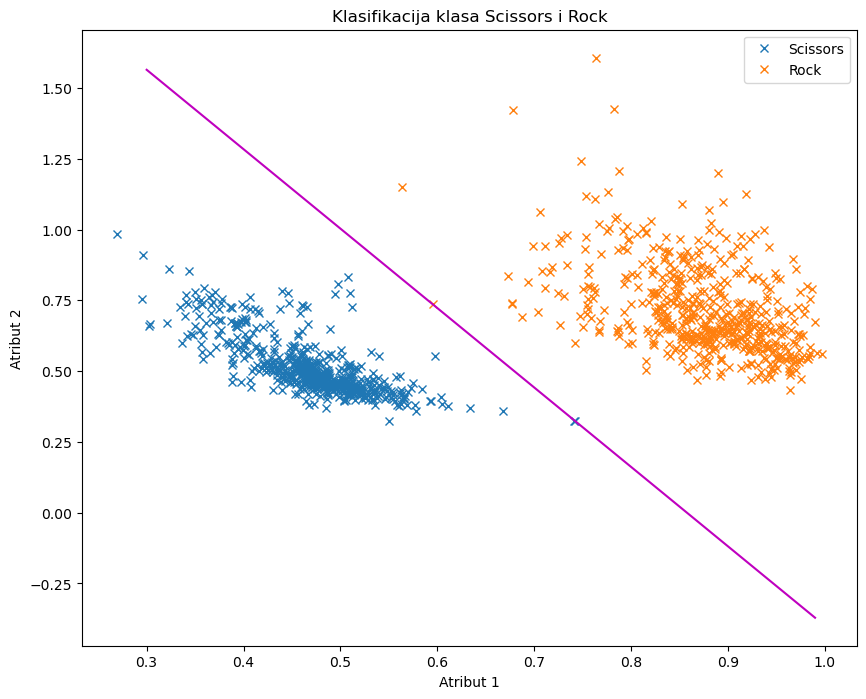

In [437]:
x1 = np.arange(0.3,1,0.01)
x2 = -(v0+V[0]*x1)/V[1]

plt.figure(figsize=(10, 8))
plt.plot(X1[0,:],X1[1,:], 'x')
plt.plot(X2[0,:],X2[1,:], 'x')
plt.plot(x1,x2,'m')
plt.title('Klasifikacija klasa Scissors i Rock')
plt.legend(['Scissors', 'Rock'])
plt.xlabel('Atribut 1')
plt.ylabel('Atribut 2')
plt.show()

#### Performanse na trening skupu

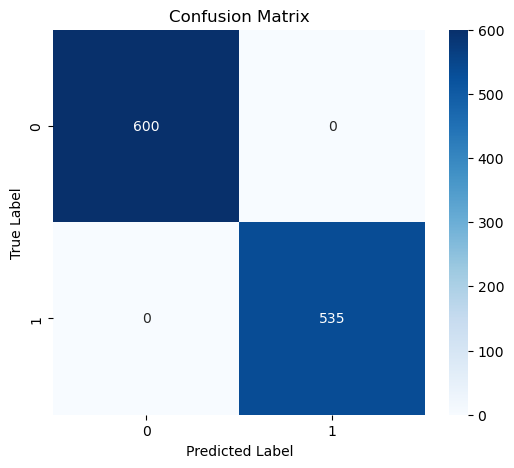

In [434]:
Y_pred = (V.T@X_train+v0)
Y_pred = Y_pred.reshape(-1,)
Y_pred[Y_pred>=0] = 2
Y_pred[Y_pred<0] = 1

plot_cm(Y_train, Y_pred)

Preciznost klasifikatora na test skupu je 100%.

#### Performanse na test skupu

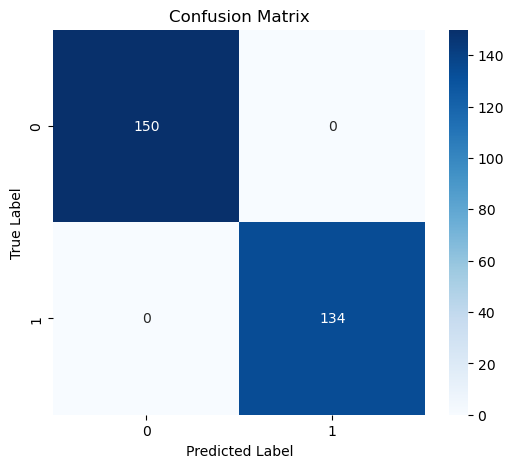

In [436]:
Y_pred = (V.T@X_test+v0)
Y_pred = Y_pred.reshape(-1,)
Y_pred[Y_pred>=0] = 2
Y_pred[Y_pred<0] = 1

plot_cm(Y_test, Y_pred)

Preciznost i na test skupu iznosi 100%. Možemo zaključiti da nije došlo do preobučavanja klasifikatora. 

Isprojektovani sistem za klasifikaciju znakova kamen i makaze klasifikuje odbirke sa velikom preciznošću.

___
___


# Zadatak 2

Generisati po $𝑁 = 500$ odbiraka iz dveju dvodimenzionih bimodalnih klasa: $$\Omega_1 \sim  P_{11} \cdot N(M_{11}, \Sigma_{11}) + P_{12} \cdot N(M_{12}, \Sigma_{12})$$   $$\Omega_2 \sim  P_{21} \cdot N(M_{21}, \Sigma_{21}) + P_{22} \cdot N(M_{22}, \Sigma_{22})$$  

Parametre klasa samostalno izabrati. 

a) Na dijagramu prikazati odbirke. 

b) Iscrtati kako teorijski izgledaju funkcije gustine verovatnoće za raspodele klasa i uporediti ih sa histogramom 
generisanih odbiraka. 

c) Projektovati Bajesov klasifikator minimalne greške i na dijagramu, zajedno sa odbircima, skicirati klasifikacionu liniju. 
Uporediti grešku klasifikacije konkretnih odbiraka sa teorijskom greškom klasifikacije prve i druge vrste za datu 
postavku. 

d) Projektovati klasifikator minimalne cene tako da se više penalizuje pogrešna klasifikacija odbiraka iz prve klase. 

e) Ponoviti prethodnu tačku za Neuman-Pearson-ov klasifikator. Obrazložiti izbor $\epsilon_2 = \epsilon_0$. 

f) Za klase oblika generisanih u prethodnim tačkama, projektovati Wald-ov sekvencijalni test pa skicirati zavisnost broja 
potrebnih odbiraka od usvojene verovatnoće grešaka prvog, odnosno drugog tipa. 

#### Pomoćna funkcija za računanje gausovske FGV u jednoj i više tačaka

In [132]:
def gaussian_pdf(X, M, S):
    detS = np.linalg.det(S)
    invS = np.linalg.inv(S)
    f = 1/(2*np.pi*detS**0.5)*np.exp(-0.5*(X-M).T@invS@(X-M))
    return f[0,0]

def gaussian_pdf_2dspace(x, y, M, S):
    f = np.zeros((len(x),len(y)))
    
    for i in range(0,len(x)):
        for j in range(0,len(y)):
            X = np.array([x[i],y[j]]).reshape(-1,1)
            f[i,j] = gaussian_pdf(X, M, S)
            
    return f

#### Pomoćna funkcija za računanje polimodalne FGV
Funkcija poly_gaussian_pdf_point računa vrednost polimodalne FGV u jednoj tački. Prosleđujemo joj tačku u kojoj želimo da računamo FGV, kao i vektor P, M, S koji sadrže verovatnoće pojavljivanja, srednje vrednosti i kovarijacione matrice svakog od moda. Funkcija poly_gaussian_pdf_2dspace računa polimodalnu FGV u dvodimenzionalnom prostoru i vraća matricu vrednosti. Prosleđuju se željene vrednosti po x i y osi kao i vektori P, M i s analogno kao kod poly_gaussian_pdf_point.

In [133]:
def poly_gaussian_pdf_point(X, P, M, S):
    f = 0
    for p,m,s in zip(P,M,S):
        f += p*gaussian_pdf(X,m,s)
        
    return f


def poly_gaussian_pdf_2dspace(x, y, P, M, S):
    f = np.zeros((len(x),len(y)))
    
    for i in range(0,len(x)):
        for j in range(0,len(y)):
            X = np.array([x[i],y[j]]).reshape(-1,1)
            f[i,j] = poly_gaussian_pdf_point(X, P, M, S)
            
    return f

#### Pomoćna funkcija za klasifikaciju tačaka u prostoru
Prosleđujemo funkciji tačke u prostoru koje želimo da klasifikujemo (x, y), fgv-ove klasa (f1 i f2) kao i prag sa kojim poredimo vrednost diskriminacione funkcije (T). Diskriminaciona funkcija ima oblik $$h(x) = -ln \left( \frac{f_1(x)}{f_2(x)} \right)$$

Funkcija vraća matrice k1 i k2, koje predstavljaju odbirke klasifikovane u klasu 1 i klasu 2, kao i vektor vrednosti diskriminacione funkcije h.
Ukoliko je $h(x)$ za određeni odbirak manje od praga, smeštamo taj odbirak u klasu 1, u suprotnom ga smeštamo u klasu 2.

In [134]:
def classify(x, y, f1, f2, T):
    h = np.zeros((len(x),len(y)))
    k1 = np.empty((0,2))
    k2 = np.empty((0,2))

    for i in range(0,len(x)):
        for j in range(0,len(y)):
            X = np.array([x[i],y[j]]).reshape(1,2)
            h[i,j] = -np.log(f1[i,j]/f2[i,j])
            if h[i,j] < T:
                k1 = np.append(k1,X,axis=0)
            else:
                k2 = np.append(k2,X,axis=0)
                
    return k1, k2, h

#### Pomoćna funkcija za plotovanje klasifikatora.
Funkcija iscrtava odbirke (X1 i X2), klasifikovane tačke u prostoru (k1 i k2) kao i klasifikacionu krivu (h). Potrebno je proslediti i vrednosti po x i y-osi za koje se iscrtava h (x i y) 

In [135]:
def plot_classifier(X1, X2, k1, k2, x, y, h, title=''):
    plt.figure(figsize=(8, 6))
    plt.plot(X1[0,:],X1[1,:],'rx')
    plt.plot(X2[0,:],X2[1,:],'gx')
    plt.scatter(k1[:, 0], k1[:, 1], color='lightcoral', alpha=0.3, s=10, edgecolor='none')
    plt.scatter(k2[:, 0], k2[:, 1], color='palegreen', alpha=0.3, s=10, edgecolor='none')
    plt.contour(x, y, h.T, levels=[T], colors='black')
    plt.legend(['klasa 1','klasa 2'])
    plt.title(title)
    plt.show()

#### Pomoćna funkcija za klasifikaciju odbiraka
Slično kao Pomoćna funkcija za klasifikaciju tačaka u prostoru, smo što se ovde klasifikuju odbirci X1 i X2. Vraća se vektor stvarnih klasa, kao i prediktovanih. Funkcija predict1 - vrši predikciju na osnovu polimodalne fgv, dok predict2 - na osnovu gauskovskog modela.

In [136]:
def predict1(X1, X2, P1, P2, M1, M2, S1, S2, T):
    data = np.concatenate((X1,X2),axis=1)
    y_true = np.zeros(data.shape[1]) 
    y_true[X1.shape[1]:] = 1
    y_predict = np.zeros(np.shape(y_true))

    for i in range(0,len(y_true)):
        f1 = poly_gaussian_pdf_point(data[:,i].reshape(-1,1), P1, M1, S1)
        f2 = poly_gaussian_pdf_point(data[:,i].reshape(-1,1), P2, M2, S2)
        h = -np.log(f1/f2)
        y_predict[i] = h>T
    
    return y_true, y_predict

def predict2(X1, X2, M1, M2, S1, S2, T):
    data = np.concatenate((X1,X2),axis=1)
    y_true = np.zeros(data.shape[1]) 
    y_true[X1.shape[1]:] = 1
    y_predict = np.zeros(np.shape(y_true))

    for i in range(0,len(y_true)):
        f1 = gaussian_pdf(data[:,i].reshape(-1,1), M1, S1)
        f2 = gaussian_pdf(data[:,i].reshape(-1,1), M2, S2)
        h = -np.log(f1/f2)
        y_predict[i] = h>T
    
    return y_true, y_predict

#### Izbor parametara
Parametri su birani tako da dođe do blagog preklapanja između klasa.

In [137]:
P11 = P12 = P21 = P22 = 0.5
M11 = np.array([0,10]).reshape(2,1)
M12 = np.array([1,3]).reshape(2,1)
M21 = np.array([-7,1]).reshape(2,1)
M22 = np.array([-2,0]).reshape(2,1)

S11 = np.array([[1, 0.5],[0.5, 1]])
S12 = np.array([[1.5, 0.7],[0.7, 2]])
S21 = np.array([[1, 0],[0, 1]])
S22 = np.array([[1, 0.5],[0.5, 1]])

#### Generisanje odbiraka

In [138]:
N = 500
X11 = np.random.multivariate_normal(M11.reshape(-1),S11,N)
X12 = np.random.multivariate_normal(M12.reshape(-1),S12,N)
X21 = np.random.multivariate_normal(M21.reshape(-1),S21,N)
X22 = np.random.multivariate_normal(M22.reshape(-1),S22,N)

pp1 = np.random.rand(1,N)
p1 = np.concatenate((pp1,pp1),axis=0).T
pp2 = np.random.rand(1,N)
p2 = np.concatenate((pp2,pp2),axis=0).T

X1 = (p1<0.5)*X11 + (p1>=0.5)*X12
X2 = (p2<0.5)*X21 + (p2>=0.5)*X22

X1 = X1.T
X2 = X2.T

## a) Na dijagramu prikazati odbirke.

<IPython.core.display.Javascript object>


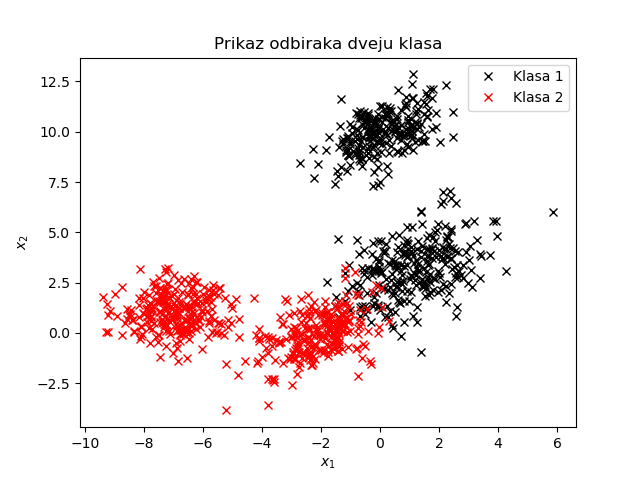

In [139]:
plt.figure()
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.legend(['Klasa 1', 'Klasa 2'])
plt.title('Prikaz odbiraka dveju klasa')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.show()

Uočavamo da klase nisu perfekto separabilne, tako da očekujemo određenu grešku prilikom klasifikacije.

## b) Iscrtati kako teorijski izgledaju funkcije gustine verovatnoće za raspodele klasa i uporediti ih sa histogramom generisanih odbiraka.

Računanje polimodalnih FGV-ova

In [140]:
x = np.arange(-10,10,0.1)
y = np.arange(-4,14.1,0.1)

f1 = poly_gaussian_pdf_2dspace(x, y, [P11, P12], [M11, M12], [S11, S12])
f2 = poly_gaussian_pdf_2dspace(x, y, [P21, P22], [M21, M22], [S21, S22])

<IPython.core.display.Javascript object>


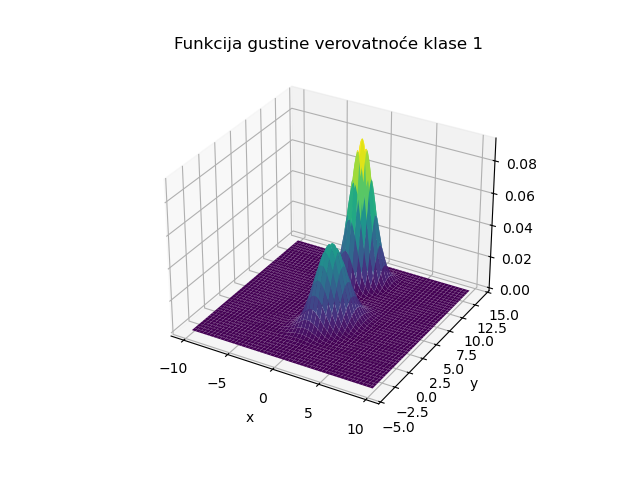

<IPython.core.display.Javascript object>


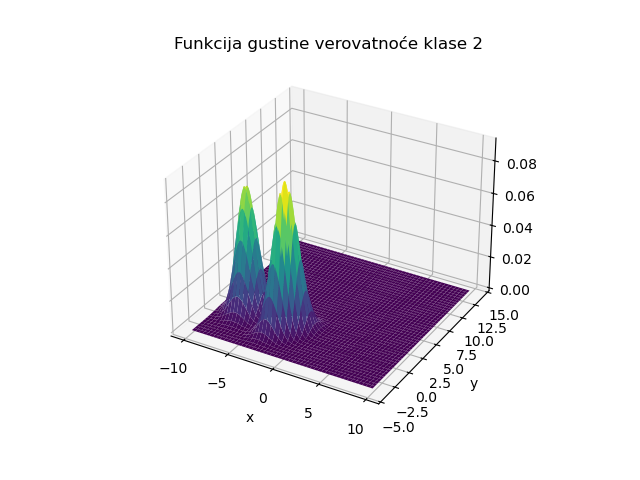

In [141]:
X, Y = np.meshgrid(x,y)
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_surface(X,Y,f1.T,cmap='viridis') # naglasiti previd za f0.T!
ax.set_xlabel('x'); ax.set_ylabel('y')
ax.set_title('Funkcija gustine verovatnoće klase 1')
plt.show()

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_surface(X,Y,f2.T,cmap='viridis')
ax.set_xlabel('x'); ax.set_ylabel('y')
ax.set_title('Funkcija gustine verovatnoće klase 2')
plt.show()

Možemo videti kako izgledaju FGV prve i druge kalse u prostoru. Sada ćemo uporediti FGV i Histograme klasa , ali u 2D prostoru zbog bolje preglednosti.

<IPython.core.display.Javascript object>


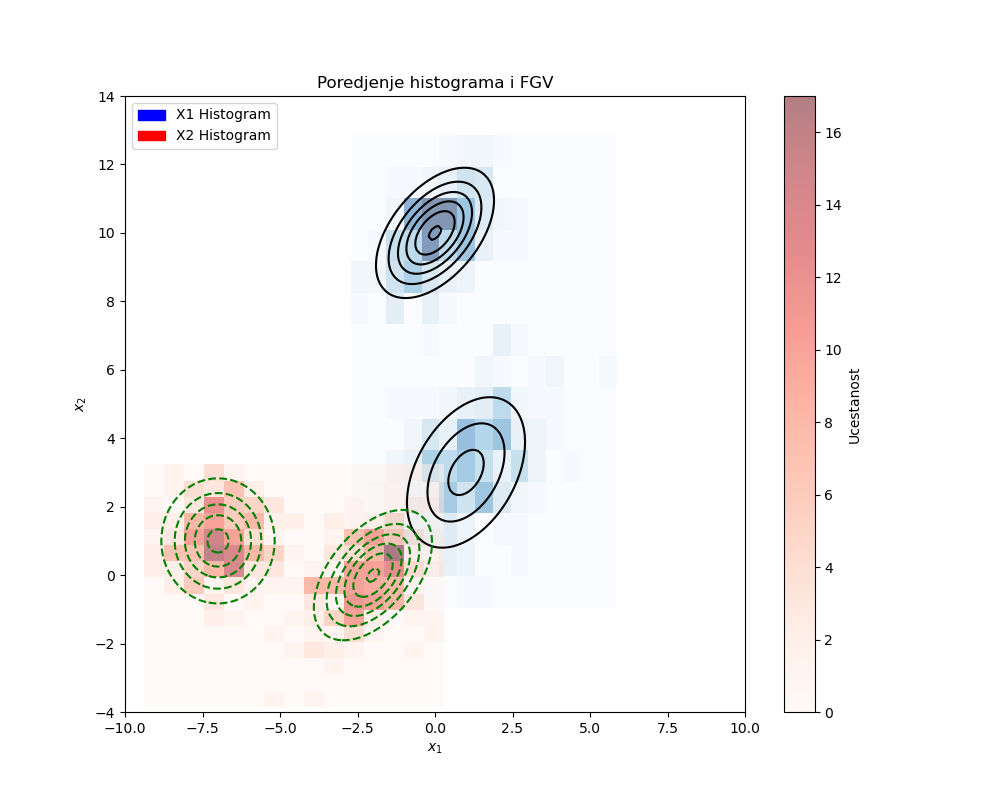

In [142]:
plt.figure(figsize=(10, 8))

plt.hist2d(X1[0, :], X1[1, :], bins=15, alpha=0.5, cmap='Blues')
plt.hist2d(X2[0, :], X2[1, :], bins=15, alpha=0.5, cmap='Reds')
plt.colorbar(label='Ucestanost')

plt.contour(X, Y, f1.T, colors='black', linestyles='solid')
plt.contour(X, Y, f2.T, colors='green', linestyles='dashed')

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Poredjenje histograma i FGV')
plt.xlim([-10, 10])
plt.ylim([-4, 14])

blue_patch = mpatches.Patch(color='blue', label='X1 Histogram')
red_patch = mpatches.Patch(color='red', label='X2 Histogram')
plt.legend(handles=[blue_patch, red_patch], loc='upper left')

plt.show()

I ovde se uočava preklapanje.

<IPython.core.display.Javascript object>


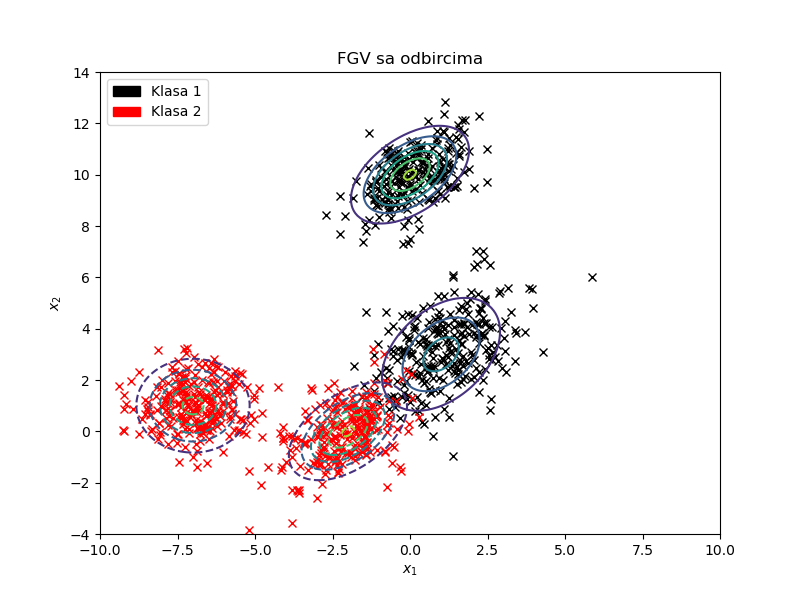

In [143]:
plt.figure(figsize=(8, 6))

plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.contour(X, Y, f1.T, linestyles='solid')
plt.contour(X, Y, f2.T, linestyles='dashed')

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('FGV sa odbircima')
plt.xlim([-10, 10])
plt.ylim([-4, 14])

blue_patch = mpatches.Patch(color='black', label='Klasa 1')
red_patch = mpatches.Patch(color='red', label='Klasa 2')
plt.legend(handles=[blue_patch, red_patch], loc='upper left')

plt.show()

## c) Projektovati Bajesov klasifikator minimalne greške i na dijagramu, zajedno sa odbircima, skicirati klasifikacionu liniju. Uporediti grešku klasifikacije konkretnih odbiraka sa teorijskom greškom klasifikacije prve i druge vrste za datu postavku.

Kako bismo projektovali ovaj klasifikator potrebno je da znamo apriorne verovatnoće pojavljivanja klasa $P_1$ i $P_2$, kao i aposteriorne funkcije raspodela: $f(x|\omega_1) = f_1(x)$ i $f(x|\omega_2) = f_2(x)$. Ove funkcije možemo modelovati kao Gausovu raspodelu (nije idealno jer znamo da su raspodele u stvari bimodalne), pa ćemo te rezultate uporediti sa razultatima koje bismo dobili da smo koristili prave fgv - ovde to možemo uraditi jer pouzdano znamo iz koje raspodele potiču odbirci, ali uopšteno to nije moguće, pa se koristi samo modelovanje.

Da bismo modelovali fgv potrebno je da znamo vektore srednjih vrednosti i kovarijacione matrice. Njih ćemo kao i apriorne verovatnoće estimirati na osnovu dostupnih podataka. 

In [145]:
M1 = np.mean(X1,axis=1).reshape(-1,1)
M2 = np.mean(X2,axis=1).reshape(-1,1)
S1 = np.cov(X1)
S2 = np.cov(X2)
p1 = X1.shape[1] / (X1.shape[1]+X2.shape[1])
p2 = 1-p1
x = np.arange(-10,10,0.1)
y = np.arange(-4,14.1,0.1)

Sada možemo da krenemo sa projektovanjem našeg klasifikatora. Naša diskriminaciona funkcija $h(x)$ ima sledeći oblik: $$h(x) = -ln \left( \frac{f_1(x)}{f_2(x)} \right)$$
Ovu funkciju poredimo sa vrednosti praga koja je: $$T = ln \left( \frac{P_1}{P_2} \right)$$

Ukoliko je vrednost funkcije veća od praga odbirak klasifikujemo u klasu 2, a u suprotnom ga klasifikujemo u klasu 1.

<IPython.core.display.Javascript object>


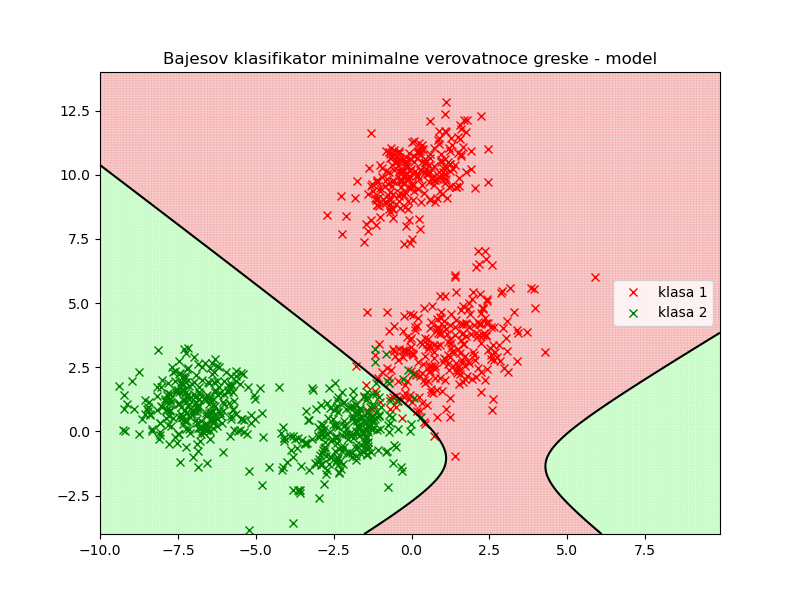

In [146]:
f1 = gaussian_pdf_2dspace(x, y, M1, S1)
f2 = gaussian_pdf_2dspace(x, y, M2, S2)
T = np.log(p1/p2)
k1, k2, h = classify(x, y, f1, f2, T)

plot_classifier(X1, X2, k1, k2, x, y, h, 'Bajesov klasifikator minimalne verovatnoce greske - model')

Kao klasifikacionu krivu dobijamo krivu drugog stepena. Jer klase nisu sasvim separabilne vidimo da naš klasifikator pravi određenu grešku prilikom klasifikacije nekih odbiraka.

<IPython.core.display.Javascript object>


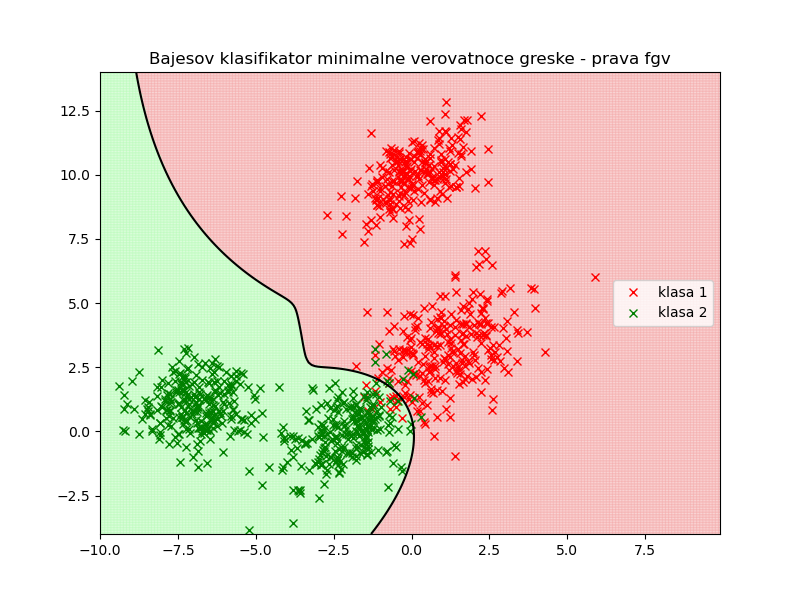

In [147]:
f1_poly = poly_gaussian_pdf_2dspace(x, y, [P11, P12], [M11, M12], [S11, S12])
f2_poly = poly_gaussian_pdf_2dspace(x, y, [P21, P22], [M21, M22], [S21, S22])
T = np.log((P11+P12)/(P21+P22))

k1, k2, h = classify(x, y, f1_poly, f2_poly, T)

plot_classifier(X1, X2, k1, k2, x, y, h, 'Bajesov klasifikator minimalne verovatnoce greske - prava fgv')

Bajesov klasifikator name daje klasifikacionu krivu višeg stepena u opštem slučaju kada koristimo bimodalnu raspodelu, što možemo videti i na slici. Klasifikator, kao što smo i očekivali, ne daje savršenu klasifikaciju, već postoji određeni broj odbiraka koji je loše klasifikovan. Broj loše klasifikovanih odbiraka će se bolje videti na konfuzionoj matrici.

<IPython.core.display.Javascript object>


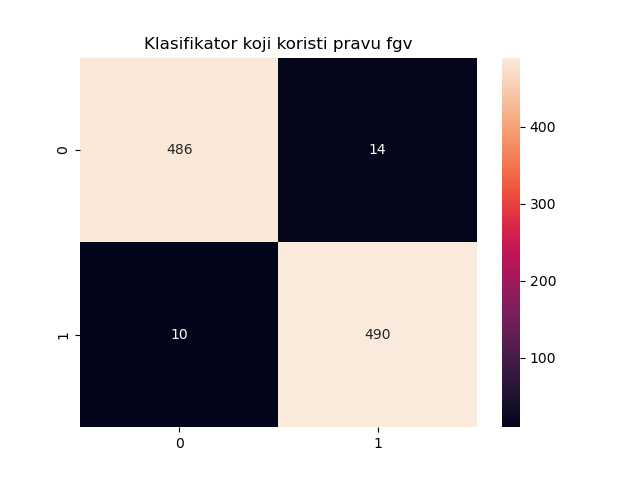

<IPython.core.display.Javascript object>


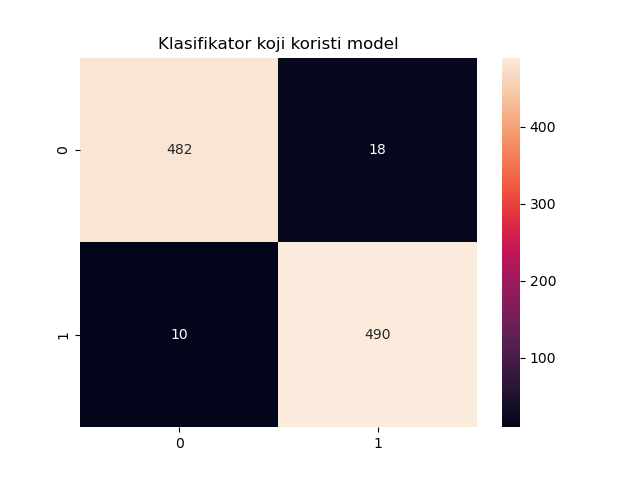

In [148]:
y_true1, y_predict1 = predict1(X1, X2, [P11, P12], [P21, P22], [M11, M12], [M21, M22], [S11, S12], [S21, S22], T)
y_true2, y_predict2 = predict2(X1, X2, M1, M2, S1, S2, T)

cm1 = confusion_matrix(y_true1,y_predict1)
plt.figure()
sns.heatmap(cm1, annot=True, fmt='d')
plt.title('Klasifikator koji koristi pravu fgv')
plt.show()

cm2 = confusion_matrix(y_true2,y_predict2)
plt.figure()
sns.heatmap(cm2, annot=True, fmt='d')
plt.title('Klasifikator koji koristi model')
plt.show()

Naš klasifikator koji koristi model radi dobro i pravi malu grešku - razlog tome je i relativno dobra separabilnost klasa. Zaključujemo da nema potrebe za drugačijim modelovanjem aposteriorne fgv.

Sada ćemo odrediti grešku eksperimentalno, tj. na osnovu klasifikacije odbiraka i konfuzione matrice. Potom ćemo odrediti i teorijsku grešku aproksimacijom integrala.

#### Greška za klasifikator koji koristi pravu fgv

In [149]:
e1 = 0
e2 = 0
eps1 = cm1[0,1]/sum(cm1[0,:]) 
eps2 = cm1[1,0]/sum(cm1[1,:])
for i in range(0,len(x)):
    for j in range(0,len(y)):
        if -np.log(f1_poly[i,j]/f2_poly[i,j]) < T:
            e2 += f2_poly[i,j]*0.1*0.1
        else:
            e1 += f1_poly[i,j]*0.1*0.1
print(f'Greška prve vrste iznosi: {eps1:.3f}')
print(f'Greška prve vrste iznosi: {eps2:.3f}')
print(f'Greška prve vrste teorijski iznosi: {e1:.3f}')
print(f'Greška druge vrste teorijski iznosi: {e1:.3f}') 

Greška prve vrste iznosi: 0.028
Greška prve vrste iznosi: 0.020
Greška prve vrste teorijski iznosi: 0.035
Greška druge vrste teorijski iznosi: 0.035


#### Greška za klasifikator koji koristi model

In [150]:
e1 = 0
e2 = 0
eps1 = cm2[0,1]/sum(cm2[0,:]) 
eps2 = cm2[1,0]/sum(cm2[1,:])
for i in range(0,len(x)):
    for j in range(0,len(y)):
        if -np.log(f1[i,j]/f2[i,j]) < T:
            e2 += f2[i,j]*0.1*0.1
        else:
            e1 += f1[i,j]*0.1*0.1
print(f'Greška prve vrste iznosi: {eps1:.3f}')
print(f'Greška prve vrste iznosi: {eps2:.3f}')
print(f'Greška prve vrste teorijski iznosi: {e1:.3f}')
print(f'Greška druge vrste teorijski iznosi: {e1:.3f}') 

Greška prve vrste iznosi: 0.036
Greška prve vrste iznosi: 0.020
Greška prve vrste teorijski iznosi: 0.023
Greška druge vrste teorijski iznosi: 0.023


Uočavamo da je teorijska greška blizu eksperimentalnoj, iako se model i prava raspodela podataka ne slažu u potpunosti. Razlike se javljaju usred razlikovanja modela i prave fgv, kao i zbog numeričkih grešaka prilikom aproksimacije integrala.

Poredivši performanse ova dva klasifikatora možemo zaključiti da je sasvim legitimno koristiti predloženi model, tj. aproksimirati pravu raspodelu gausovskom, tako da će se u narednim tačkama razmatrati samo klasifikator koji koristi aproskimaciju.

## d) Projektovati klasifikator minimalne cene tako da se više penalizuje pogrešna klasifikacija odbiraka iz prve klase.
Ovo znači da treba više kazniti ako je odbirak iz prve klase smešten u drugu, nego obrnuto $\implies$ $C_{21} > C_{12}$

In [151]:
C12 = 1
C21 = 5
C11 = 0
C22 = 0

Jedina razlika između Bajesovog klasifikatora minimalne greše i minimale cene je u vrednosti granice. Sada će vrednost granice imati oblik: $$T = ln \left( \frac{C_{21} - C_{11}}{C_{12} - C_{22}} \cdot \frac{P_1}{P_2} \right)$$

<IPython.core.display.Javascript object>


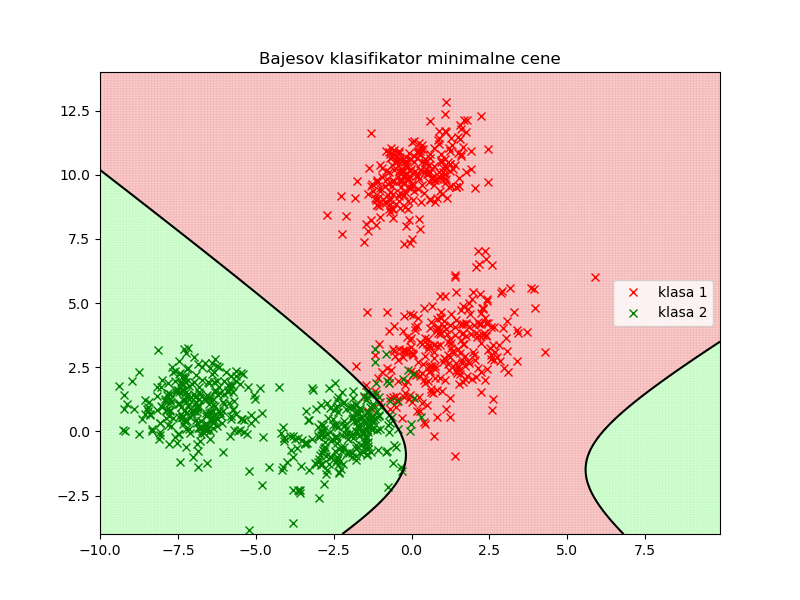

In [152]:
T = np.log(p1/p2*(C21-C11)/(C12-C22))
f1 = gaussian_pdf_2dspace(x, y, M1, S1)
f2 = gaussian_pdf_2dspace(x, y, M2, S2)
k1, k2, h = classify(x, y, f1, f2, T)

plot_classifier(X1, X2, k1, k2, x, y, h, 'Bajesov klasifikator minimalne cene')

Klasifikaciona kriva je zašla dublje u klasu 2, što je bilo i za očekivati, jer ona teži da obuhvati veći broj odbiraka prve klase.

<IPython.core.display.Javascript object>


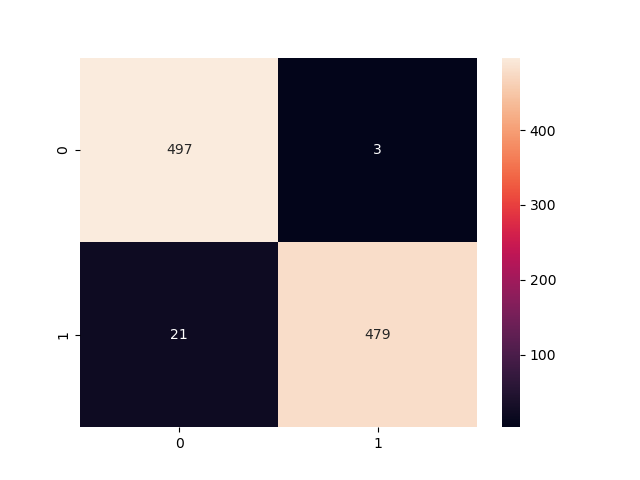

In [153]:
y_true, y_predict = predict2(X1, X2, M1, M2, S1, S2, T)

cm = confusion_matrix(y_true,y_predict)
plt.figure()
sns.heatmap(cm, annot=True, fmt='g')
plt.show()

In [154]:
eps1c = cm[0,1]/sum(cm[0,:]) 
eps2c = cm[1,0]/sum(cm[1,:])

print(f'Greška prve vrste iznosi: {eps1c:.3f}')
print(f'Greška druge vrste iznosi: {eps2c:.3f}')

Greška prve vrste iznosi: 0.006
Greška druge vrste iznosi: 0.042


Greška 1. vrste se smanjila (ali se povećala greška 2. vrste)

## e) Ponoviti prethodnu tačku za Neuman-Pearson-ov klasifikator. Obrazložiti izbor $\epsilon_2=\epsilon_0$

Potrebno je odrediti $\epsilon_0$ i $\mu$. Prag je sada definisan kao: $$T = -ln~\mu$$

$\epsilon_0$ možemo inicijalizovati na zbir grešaka prvog i drugog tipa koje smo dobili za Bajesov klasifikator minimalne verovatnoće greške i nadati se da $\epsilon_1$ teži nuli, jer smo "sve greške" smestili u grešku drugog tipa, ali to ne mora uvek biti slučaj. Svakako ovo je dobra polazna tačka i dodatne promene $\epsilon_0$ mogu se vršiti nakon provere performansi klasifiktora.

Pošto nije jednostavno iz zadatog $\epsilon_0$ dobiti $\mu$, mi ćemo sračunati procenu greške drugog tipa ta različite vrednosti $\mu$, a potom odabrati $\mu$ za traženo $\epsilon_0$. Potom ćemo projektovati klasifikator.

In [155]:
eps0 = eps1 + eps2

<IPython.core.display.Javascript object>


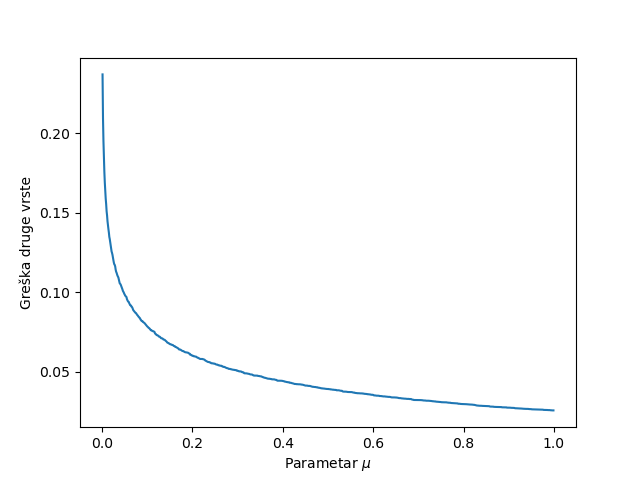

In [156]:
f1 = gaussian_pdf_2dspace(x, y, M1, S1)
f2 = gaussian_pdf_2dspace(x, y, M2, S2)
hp = -np.log(f1/f2)

mu = np.arange(0.001, 1, 0.001)
eps2_array = np.zeros(len(mu))

for m in range(len(mu)):
    for i in range(len(x)-1):
        for j in range(len(y)-1):
            if h[i, j] < -np.log(mu[m]):
                eps2_array[m] += (f2[i,j] + f2[i+1,j] + f2[i, j+1] + f2[i+1,j+1])/4*0.1*0.1                               

plt.figure()
plt.plot(mu,eps2_array)
plt.xlabel('Parametar $\mu$')
plt.ylabel('Greška druge vrste')
plt.show() 

Sada trema pronaći optimalno $\mu$. Optimalno $\mu$ je ono koje daje traženu grešku prve vrste. Međutim zbog toga što iscrtavamo grafik u nekim diskretnim tačkama nećemo tražiti $\mu$ za vrednost jednaku $\epsilon_0$, već za prvu vrednost koja je manja ili jednaka njoj. Prolazićemo kroz niz grešaka za odgovarajuće $\mu$ i zapamtiti indeks prvog elementa niza grešaka druge vrste koji zadovoljava naš uslov. Na toj poziciji u nizu svih $\mu$ će se nalaziti $\mu_{opt}$

In [157]:
for i in range(len(eps2_array)):
    if(eps2_array[i]<=eps0):
        break
        
mu_opt = mu[i]
print(mu_opt)
print(eps2_array[i])

0.23600000000000002
0.05597646460636981


<IPython.core.display.Javascript object>


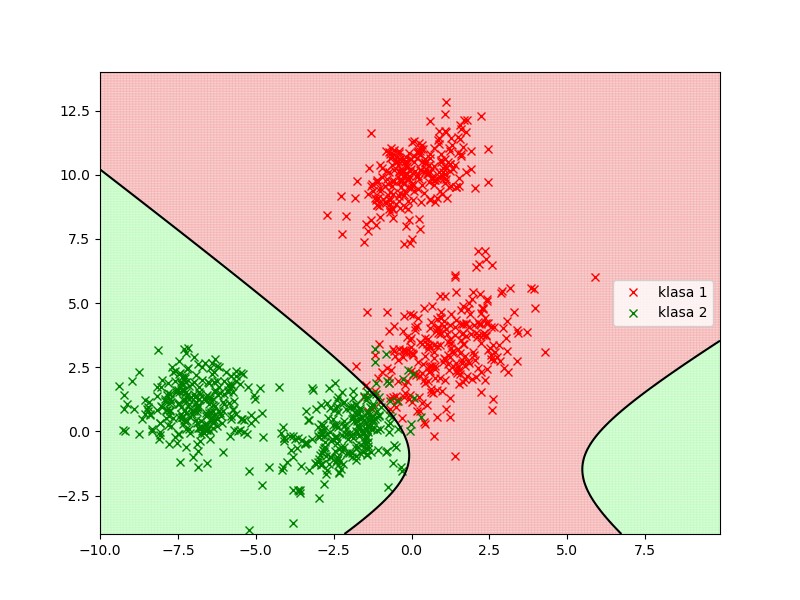

In [158]:
T = -np.log(mu_opt)

k1, k2, h = classify(x, y, f1, f2, T)
plot_classifier(X1, X2, k1, k2, x, y, h)

I ovde vidimo da je klasifikator zašao dublje u klasu 2

<IPython.core.display.Javascript object>


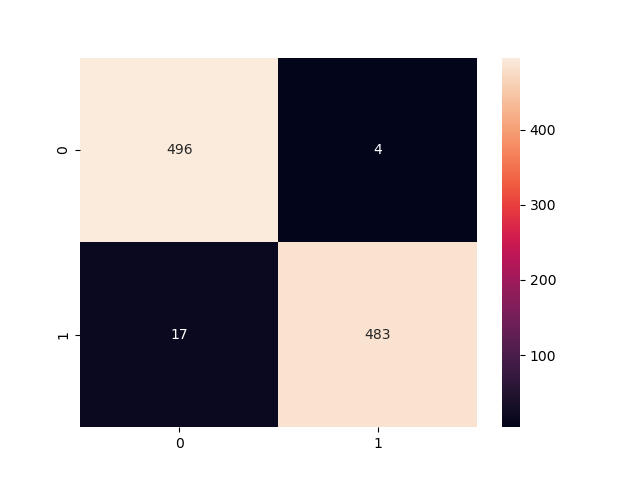

In [159]:
y_true, y_predict = predict2(X1, X2, M1, M2, S1, S2, T)

cm = confusion_matrix(y_true,y_predict)
plt.figure()
sns.heatmap(cm, annot=True, fmt='g')
plt.show()

In [160]:
eps1n = cm[0,1]/sum(cm[0,:]) 
eps2n = cm[1,0]/sum(cm[1,:])

print(f'Greška prve vrste iznosi: {eps1n:.3f}')
print(f'Greška druge vrste iznosi: {eps2n:.3f}')

Greška prve vrste iznosi: 0.008
Greška druge vrste iznosi: 0.034


I ovde se može videti smanjenje greške prve, a povećanje greške druge vrste, ali su rezultati malo drugačiji od očekivanog. Greška $\epsilon_2$ drugačija od zadate. Ovo je posledica lošeg modelovanja naše fgv. Ukoliko bismo želeli da povećamo grešku druge vrste dodatno i samim tim još više smanjimo grešku prve vrste možemo povećati $\epsilon_0$.

## f) Za klase oblika generisanih u prethodnim tačkama, projektovati Wald-ov sekvencijalni test pa skicirati zavisnost broja potrebnih odbiraka od usvojene verovatnoće grešaka prvog, odnosno drugog tipa.

Definišemo $S_m$ kao $$S_m = \sum_{i=1}^{m} h(X_i)$$, gde je $$h(x) = -ln \left( \frac{f_1(x)}{f_2(x)} \right)$$


Odluka se donosi na sledeći način $$Sm \left\{\begin{array}{lc}>b &  X_i \in \omega_2  \\ < a & X_i \in \omega_1  \\ \in (a,~b) & \text {uzmi (m+1) odbirak} \end{array}\right.$$

$~~$
$$a = - ln \left( \frac{1-\epsilon_1}{\epsilon_2} \right)$$
$~$

$$b = - ln \left( \frac{\epsilon_1}{1-\epsilon_2} \right)$$

Uradićemo projektovanje za različite vrednosti $\epsilon_1$ i $\epsilon_2$ i prikayati rezultate

<IPython.core.display.Javascript object>


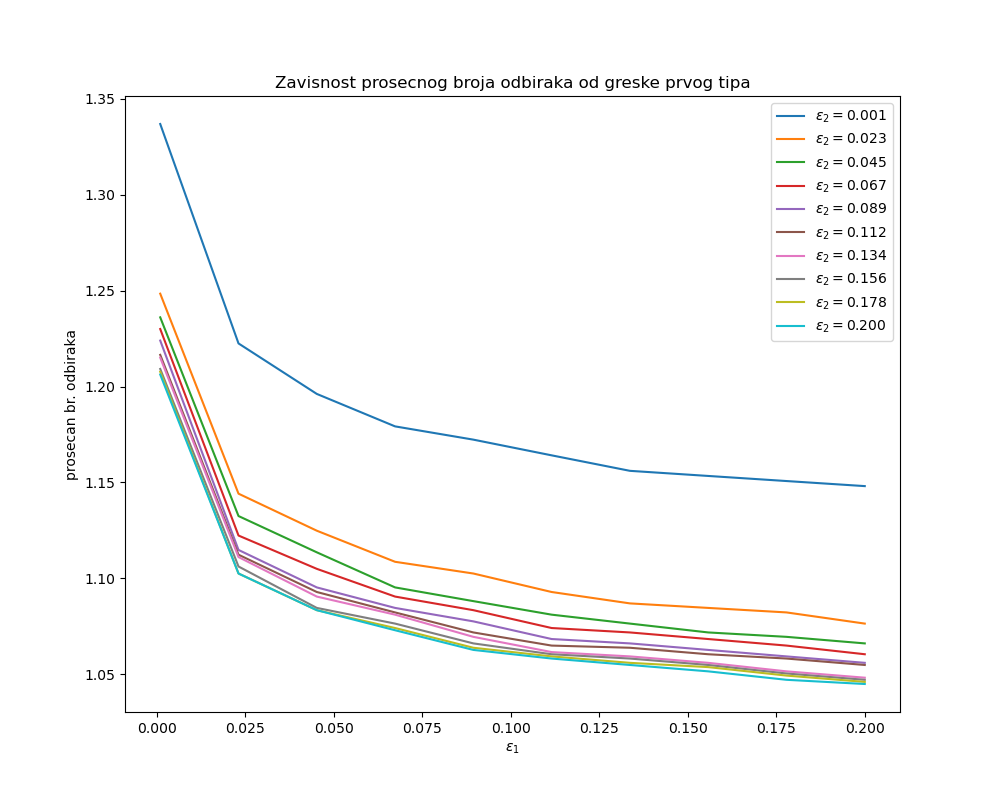

<IPython.core.display.Javascript object>


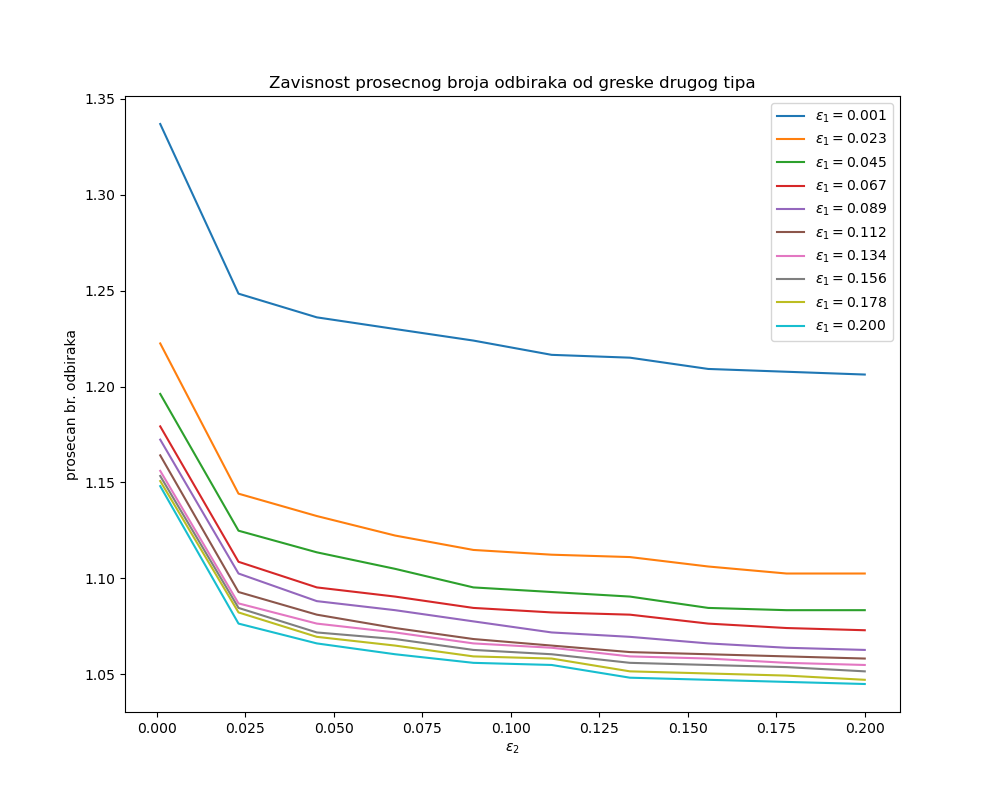

In [161]:
eps1w_arr = np.linspace(0.001, 0.2, 10)
eps2w_arr = np.linspace(0.001, 0.2, 10)
av_samples = np.zeros((len(eps1w_arr), len(eps2w_arr)))
data = np.concatenate((X1,X2),axis=1)


for i in range(len(eps1w_arr)):
    for j in range(len(eps2w_arr)):
        eps1w = eps1w_arr[i]
        eps2w = eps2w_arr[j]
        A = (1-eps1w) / eps2w
        B = eps1w / (1-eps2w)
        a = -np.log(A)
        b = -np.log(B)
        
        Sm = 0
        cnt = 0
        samples = []
        
        for n in range(data.shape[1]):
            f1 = gaussian_pdf(data[:,n].reshape(-1,1), M1, S1)
            f2 = gaussian_pdf(data[:,n].reshape(-1,1), M2, S2)
            h = -np.log(f1/f2)
            Sm += h
            cnt += 1
            
            if(Sm < a or Sm > b):
                samples.append(cnt)
                Sm = 0
                cnt = 0
                
        av_samples[i,j] = sum(samples)/len(samples)    
            

plt.figure(figsize=(10,8))
for j in range(len(eps2w_arr)):
    plt.plot(eps1w_arr, av_samples[:, j])
plt.legend([f'$\epsilon_2 = {elem:.3f}$' for elem in eps2w_arr])
plt.title('Zavisnost prosecnog broja odbiraka od greske prvog tipa')
plt.xlabel('$\epsilon_1$')
plt.ylabel('prosecan br. odbiraka')
plt.show()

plt.figure(figsize=(10,8))
for i in range(len(eps1w_arr)):
    plt.plot(eps1w_arr, av_samples[i, :])
plt.legend([f'$\epsilon_1 = {elem:.3f}$' for elem in eps1w_arr])
plt.title('Zavisnost prosecnog broja odbiraka od greske drugog tipa')
plt.xlabel('$\epsilon_2$')
plt.ylabel('prosecan br. odbiraka')
plt.show()

Uočavamo da sa povećanjem grešaka prosečan broj potrebnig odbiraka za donošenje odluke opada, što je i bilo za očekivati. Što veći broj obiraka uzmemo u obzir pri donošenju odluke, to je manja verovatnoća da pogrešimo.

#### Ilustracija klasifikacije Wald-ovog klasifikatora

<IPython.core.display.Javascript object>


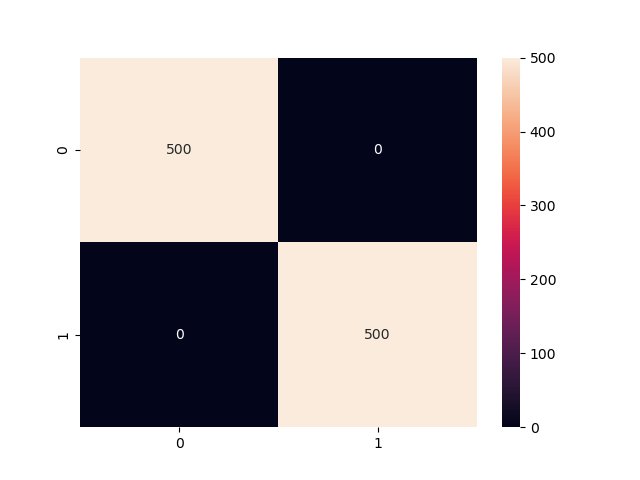

Greška prve vrste iznosi: 0.000
Greška druge vrste iznosi: 0.000


In [162]:
eps1w = 0.01
eps2w = 0.01
A = (1-eps1w) / eps2w
B = eps1w / (1-eps2w)
a = -np.log(A)
b = -np.log(B)
        
y_true = np.zeros(data.shape[1]) 
y_true[X1.shape[1]:] = 1
y_predict = np.zeros(np.shape(y_true))
start = 0 
Sm = 0

for n in range(data.shape[1]):
    f1 = gaussian_pdf(data[:,n].reshape(-1,1), M1, S1)
    f2 = gaussian_pdf(data[:,n].reshape(-1,1), M2, S2)
    h = -np.log(f1/f2)
    Sm += h

    if(Sm < a ):
        y_predict[start:n+1] = 0
        start = n+1
        Sm = 0
    elif(Sm > b):
        y_predict[start:n+1] = 1
        start = n+1
        Sm = 0

cm = confusion_matrix(y_true,y_predict)
plt.figure()
sns.heatmap(cm, annot=True, fmt='g')
plt.show()

print(f'Greška prve vrste iznosi: {cm[0,1]/sum(cm[0,:]):.3f}')
print(f'Greška druge vrste iznosi: {cm[1,0]/sum(cm[1,:]):.3f}')

___
___


# Zadatak 3
 3.1. Generisati tri klase dvodimenzionalnih oblika. Izabrati funkciju gustine verovatnoće oblika tako da klase budu 
linearno separabilne. 

a) Za tako generisane oblike izvšiti projektovanje linearnog klasifikatora jednom od tri iterativne procedure. 
Rezultate prikazati u obliku matrice konfuzije. Detaljno opisati postupak klasifikacije. 

b) Ponoviti prethodni postupak korišćenjem metode željenog izlaza. Analizirati uticaj elemenata u matrici željenih 
izlaza na konačnu formu linearnog klasifikatora. 

### Generisanje odbiraka

<IPython.core.display.Javascript object>


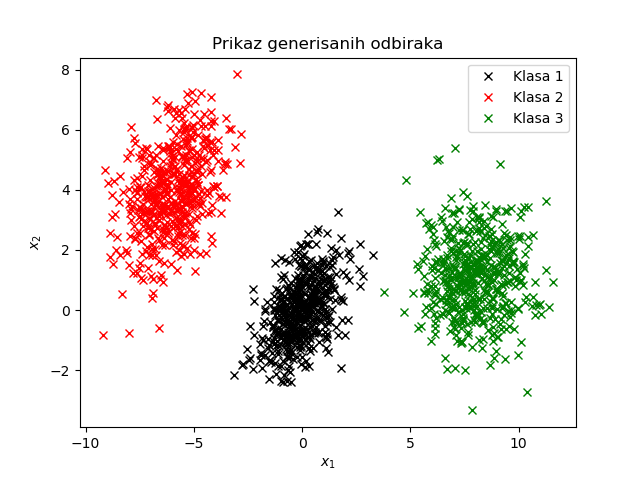

In [188]:
N = 500

M1 = np.array([0,0]).reshape(-1,1)
M2 = np.array([-6,4]).reshape(-1,1)
M3 = np.array([8,1]).reshape(-1,1)

S1 = np.array([[1, 0.5],[0.5, 1]])
S2 = np.array([[1.5, 0.7],[0.7, 2]])
S3 = np.array([[1.7, 0],[0, 1.7]])

X1 = np.random.multivariate_normal(M1.reshape(-1),S1,N).T
X2 = np.random.multivariate_normal(M2.reshape(-1),S2,N).T
X3 = np.random.multivariate_normal(M3.reshape(-1),S3,N).T

X = np.concatenate((X1,X2,X3), axis=1)
Y = np.zeros(X.shape[1])
Y[0:N] = 1
Y[N:2*N] = 2
Y[2*N:] = 3

plt.figure()
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.plot(X3[0,:], X3[1,:], 'gx')
plt.legend(['Klasa 1', 'Klasa 2', 'Klasa 3'])
plt.title('Prikaz generisanih odbiraka')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.show()

## a) Za tako generisane oblike izvšiti projektovanje linearnog klasifikatora jednom od tri iterativne procedure. Rezultate prikazati u obliku matrice konfuzije. Detaljno opisati postupak klasifikacije.

Klasifikator ćemo projektovati pomoću druge numeričke metode.

Imamo 3 klase. Možemo projektovati po jedan klasifikator za svaki par klasa i onda videti koja klasa ima najviše glasova za određeni odbirak. Ukoliko je nerešeno koristimo se klasifikatorom koji je projektovan za klase između kojih je nerešen rezultat.
Drugi način je da 2 klase spojimo u 1 i onda projektujemo klasifikator koji odlučuje između dve spojene klase i preostale treće, a potom napravimo i klasifikator koji će samo odlučivati kojoj od klasa koje smo spojili pripada odbirak.

Ovde će biti implementiran drugi način.

Pošto je očigledno da ćemo više puta projektovati klasifikator radi preglednosti definisaćemo funkciju koja projektuje klasifikator željenom metodom.

#### Druga numerička metoda
Opšti oblik linearnog klasifikatora:
$$ h(X) = V^TX+v_0 $$

Ukoliko želimo da minimizujemo verovatnoću greške, tada dobijamo sledeće jednačine: $$ s = \frac{-\eta_1/\sigma_1^2}{-\eta_1/\sigma_1^2+\eta_2/\sigma_2^2} $$
$~$
$$ V = \left[s\Sigma_1+(1-s)\Sigma_2 \right]^{-1}(M_2-M_1) $$
$~$
$$ v_0 = - \frac{s\sigma_1^2V^TM_2+(1-s)\sigma_2^2V^TM_1}{s\sigma_1^2+(1-s)\sigma_2^2}$$

Ove jednačine se ne mogu rešiti analitički, već se pribegava numeričkom rešavanju.

Algoritam:

Dati su nam dobirci $X_1$ i $X_2$, kao i broj odbiraka $N_1$ i $N_2$. Vršimo procenu srednje vrednosti i kovarijacione matrice $M_1$, $M_2$, $S_1$ i $S_2$. Poznato nam je da $s \in [0,1]$, pa možemo for petljom da prolazimo kroz moguće vrednosti sa određenim korakom. Za svako $s$ možemo naći $V$. Nakon toga date odbirke obe klase možemo preslikati na sledeći način : $$y_i = V^{T}X_i$$. Nakon toga prolazimo for petljom kroz moguće vrednosti za $v_0$ koje moežemo izvući na osnovu preslikanih odbiraka $y_i$. Za svako $v_0$ možemo izvršiti klasifikaciju i zapamtiti kolika je greška. Kada prođemo kroz svako $v_0$, za dato $s$ pamtimo samo ono $v_0$ koje pravi najmanju grešku. Nakon što prođemo i kroz svako $s$, kao $s_{opt}$ i $v_0$ biramo onaj par koji je napravio najmanju grešku. Na osnovu toga računamo $V$ i dobijamo naš klasifikator. 

In [201]:
def druga_num_metoda(X1, X2):
    N1 = X1.shape[1]
    N2 = X2.shape[1]
    
    M1_est = np.mean(X1, axis=1).reshape(-1,1)
    M2_est = np.mean(X2, axis=1).reshape(-1,1)
    S1_est = np.cov(X1)
    S2_est = np.cov(X2)    
    
    s = np.arange(0,1,10**-3)
    v0_opt_s = []
    Neps_s = []
    
    for i in range(len(s)):
        V = np.linalg.inv(s[i]*S1_est + (1-s[i])*S2_est)@(M2_est-M1_est)
        Y1 = V.T@X1
        Y2 = V.T@X2
        Y = np.sort(np.concatenate((Y1, Y2), axis=1)) 
        v0 = np.zeros(Y.shape[1]-1) 
        Neps = np.zeros(Y.shape[1]-1)
        for j in range(Y.shape[1]-1):
            v0[j] = -(Y[0,j]+Y[0,j+1])/2
            Neps[j] += np.sum(Y1>-v0[j])
            Neps[j] += np.sum(Y2<-v0[j])  
        Neps_s.append(np.min(Neps))
        v0_opt_s.append(v0[np.argmin(Neps)])
    Neps_opt = min(Neps_s)
    v0_opt = v0_opt_s[np.argmin(Neps_s)]
    s_opt = s[np.argmin(Neps_s)]
    return (s_opt, v0_opt, Neps_opt, M1_est, M2_est, S1_est, S2_est)

Spajamo klase 1 i 2 u novu klasu, dok klasa 3 predstavlja drugu klasu. Odbirke prve i druge klase posmatramo kao odbirke iste klase - nove prve klase, dok odbirke 3. klase posmatramo kao odbirke nove druge klase. Za ovako definisane klase projektujemo klasifikator

In [202]:
X1_new = np.concatenate((X1 ,X2), axis=1)
X2_new = X3

In [203]:
s_opt, v0_opt, Neps_opt, M1_est, M2_est, S1_est, S2_est = druga_num_metoda(X1_new, X2_new)
V = np.linalg.inv(s_opt*S1_est + (1-s_opt)*S2_est)@(M2_est-M1_est)
v0 = v0_opt

<IPython.core.display.Javascript object>


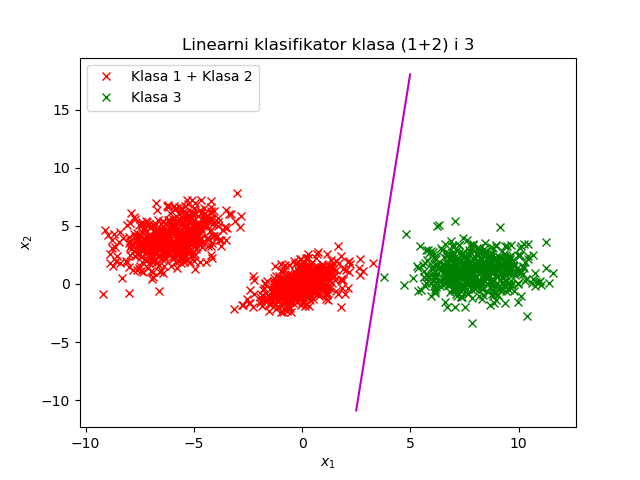

In [204]:
x1 = np.arange(2.5,5,0.01)
x2 = -(v0+V[0]*x1)/V[1]

plt.figure()
plt.plot(X1_new[0,:],X1_new[1,:],'rx')
plt.plot(X2_new[0,:],X2_new[1,:],'gx')
plt.plot(x1,x2,'m')
plt.title('Linearni klasifikator klasa (1+2) i 3')
plt.legend(['Klasa 1 + Klasa 2', 'Klasa 3'])
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.show()

Ukoliko je vrednost $ h(X) = V^TX+v_0 > 0$, zasigurno znamo da odbirak pripada klasi 3, dok ukoliko to ne važi treba da se donese odluka da li pripada klasi 1 ili 2. Takođe ćemo voditi i računa o indeksima odbiraka koji nisu klasifikovani, tj. za koje tek treba da bude doneta odluka. 

In [205]:
Y_pred = (V.T@X+v0)
Y_pred = Y_pred.reshape(Y_pred.shape[1],)
Y_pred[Y_pred>0] = 3
indices = [i for i, x in enumerate(Y_pred) if x < 0]

Projektovanje klasifikatora klasa 1 i 2

In [206]:
X1_new = X1
X2_new = X2
s_opt, v0_opt, Neps_opt, M1_est, M2_est, S1_est, S2_est = druga_num_metoda(X1_new, X2_new)
V = np.linalg.inv(s_opt*S1_est + (1-s_opt)*S2_est)@(M2_est-M1_est)
v0 = v0_opt

<IPython.core.display.Javascript object>


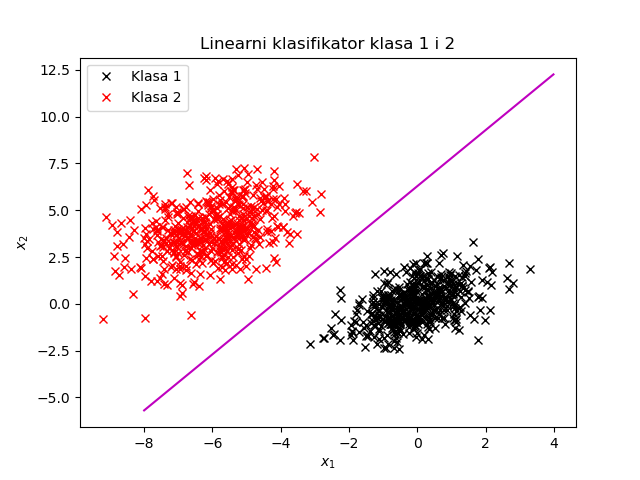

In [207]:
x1 = np.arange(-8,4,0.01)
x2 = -(v0+V[0]*x1)/V[1]

plt.figure()
plt.plot(X1_new[0,:],X1_new[1,:],'kx')
plt.plot(X2_new[0,:],X2_new[1,:],'rx')
plt.plot(x1,x2,'m')
plt.title('Linearni klasifikator klasa 1 i 2')
plt.legend(['Klasa 1', 'Klasa 2'])
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.show()

Sada ćemo vrednost $h(x)$ porediti da li je manja od nule i ako jeste smeštamo odbirak u klasu 1 - to je lakše jer smo već za odbirke 3. klase upisivali vrednost 3, pa je malo nezgodnije proveravati da li je dobijena vrednost veća od nule. Primetimo da $h(x)$ računamo samo za odbirke koji nisu klasifikovani - ne bi imalo smisla raditi ovo i za odbirke treće klase. Ovde koristimo one zapamćene indekse neklasifikovanih odbiraka. Na kraju ako odbirak ne pripada ni klasi 1 ni klasi 3 smeštamo ga u klasu 2.

In [208]:
if(len(indices)!=0):
    Y_pred[indices] = V.T@X[:, indices]+v0
    Y_pred[Y_pred<0]=1
    Y_pred[(Y_pred!=1) & (Y_pred!=3)]=2

<IPython.core.display.Javascript object>


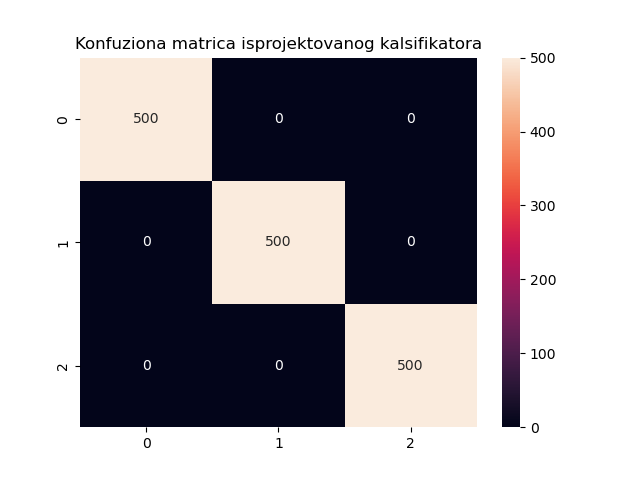

Text(0.5, 1.0, 'Konfuziona matrica isprojektovanog kalsifikatora')

In [209]:
cm = confusion_matrix(Y, Y_pred)
plt.figure()
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Konfuziona matrica isprojektovanog kalsifikatora')

Dobijamo preciznost od 100% - zato što su klase linearno separabilne.

## b) Ponoviti prethodni postupak korišćenjem metode željenog izlaza. Analizirati uticaj elemenata u matrici željenih izlaza na konačnu formu linearnog klasifikatora.
Kako bi efekat promene $\Gamma$ bio vidljiviji, ovde ćemo projektovati po jedan klasifikator za svaki par klasa, za razliku od prošle tačke gde smo spajali dve kalse u jednu.

Opšti oblik linearnog klasifikatora se može svesti na: $$X \in \omega_1 \implies W^{T}Z > 0$$ $$X \in \omega_2 \implies W^{T}Z > 0$$ gde je $$X \in \omega_1 \implies
\mathbf{Z} =
\begin{bmatrix}
-1 \\
-X \\
\end{bmatrix}
$$

$$X \in \omega_1 \implies
\mathbf{Z} =
\begin{bmatrix}
1 \\
X \\
\end{bmatrix}
$$

$$
\mathbf{W} =
\begin{bmatrix}
V_0 & V_1 & ... & V_n \\
\end{bmatrix}
$$

Tada se problem svodi na nalaženje matrice $W$ tako da važi $$W^{T}Z_i > 0$$, za svako $i$.

Ako $U$ definišemo kao $$
\mathbf{U} =
\begin{bmatrix}
Z_1^T \\
Z_2^T \\
.\\
.\\
.\\
Z_n^T \\
\end{bmatrix}
$$
možemo da pišemo $$UW=\Gamma$$ , gde je $\Gamma$ vektor željenih izlaza.

Konačno $W$ dobijamo kao: $$W = \left(U^TU\right)^{-1}U^T\Gamma$$  

U implementaciji funkcije $U$ neće biti definisano kao ovde, već će biti transponat goredefinisanog $U$, ali je proces nalaženja $W$ analogan. 

In [181]:
def metod_zeljenih_izlaza(X1, X2, Gamma):
    N1 = X1.shape[1]
    N2 = X2.shape[1]
    x0 = np.ones((1, N1+N2)) # odgovara slobodnim clanovima koji ce biti +-1
    x0[0,0:N1] = x0[0,0:N1] * -1
    X = np.concatenate((-X1, X2), axis=1)
    U = np.concatenate((x0, X), axis=0)
    
    W = np.linalg.inv(U@U.T)@U@Gamma
    v0 = W[0]
    v1 = W[1]
    v2 = W[2]
    
    return v0, v1, v2

### Klasifikator za klasu 1 i 2
Projektujemo klasifikator za klase 1 i 2. Projektovaćemo ga za 3 vrednosti vektora $\Gamma$. Prvi vektor će imati sve jedinice, drugi će imati vrednost 0.2 na mestima koje odgovaraju prvoj klasi, a 1 na mestima koj odgovaraju drugoj klasi i drugi će imati vrednost 5 na mestima koje odgovaraju prvoj klasi, a 1 na mestima koj odgovaraju drugoj klasi.

In [189]:
N1 = X1.shape[1]
N2 = X2.shape[1]

Gamma1 = np.ones((1, N1+N2)).T

Gamma2 = np.ones((1, N1+N2)).T
Gamma2[0:N1, 0] = Gamma2[0:N1, 0]*0.2

Gamma3 = np.ones((1, N1+N2)).T
Gamma3[0:N1, 0] = Gamma3[0:N1, 0]*5

<IPython.core.display.Javascript object>


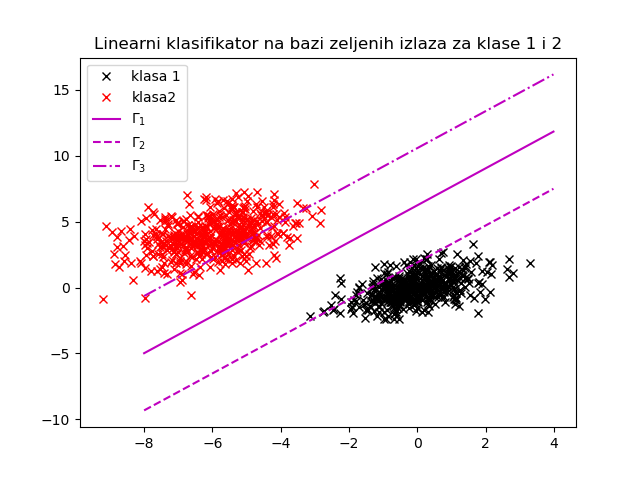

Text(0.5, 1.0, 'Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 2')

In [190]:
v0_1, v1_1, v2_1 = metod_zeljenih_izlaza(X1, X2, Gamma1)
v0_2, v1_2, v2_2 = metod_zeljenih_izlaza(X1, X2, Gamma2)
v0_3, v1_3, v2_3 = metod_zeljenih_izlaza(X1, X2, Gamma3)

x1 = np.arange(-8,4,0.01)
x2_1 = -(v0_1+v1_1*x1)/v2_1
x2_2 = -(v0_2+v1_2*x1)/v2_2
x2_3 = -(v0_3+v1_3*x1)/v2_3

plt.figure()
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.plot(x1, x2_1, 'm')
plt.plot(x1, x2_2, 'm--')
plt.plot(x1, x2_3, 'm-.')
plt.legend(['klasa 1', 'klasa2', '$\Gamma_1$', '$\Gamma_2$', '$\Gamma_3$'])
plt.title("Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 2")

Vidimo da je $\Gamma_1$  onom što mi želimo. $\Gamma_2$ zalazi u klasu 1, što je i za očekivati jer su manje vrednosti očekivanih izlaza pridruženi oblicima iz klase 1. Suprotan slučaj je za $\Gamma_3$. Dakle zaključujemo da nam treba vektor sličan $\Gamma_1$, sa tom izmenom da se odbircima iz klase 1 pridruži malo manja vrednost, kako bi loše klasifikovani odbirci iz klase 2 bili sada na dobroj strani.

<IPython.core.display.Javascript object>


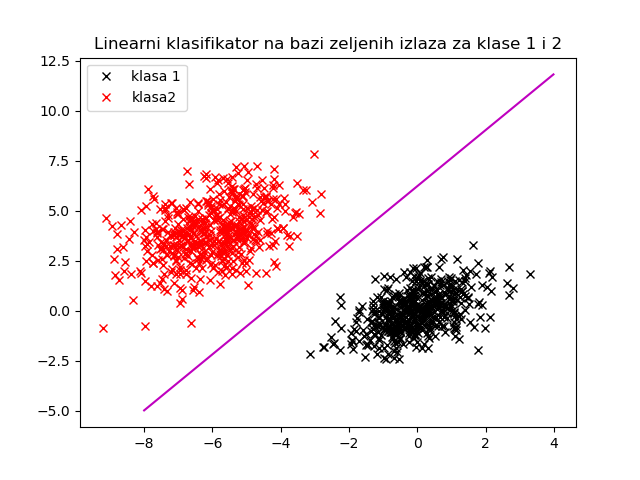

Text(0.5, 1.0, 'Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 2')

In [191]:
Gamma = np.ones((1, N1+N2)).T

v0_12, v1_12, v2_12 = metod_zeljenih_izlaza(X1, X2, Gamma)

x1_12 = np.arange(-8,4,0.01)
x2_12 = -(v0_12+v1_12*x1_12)/v2_12

plt.figure()
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.plot(x1_12, x2_12, 'm')
plt.legend(['klasa 1', 'klasa2'])
plt.title("Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 2")

Ovo će biti naš klasifikator za klase 1 i 2.
Slično proces ponavljamo i za preostala 2 kalisifkatora.

### Klasifikator za klase 1 i 3 
Projektovaćemo ga za 3 vrednosti vektora Γ. Prvi vektor će imati sve jedinice, drugi će imati vrednost 0.3 na mestima koje odgovaraju prvoj klasi, a 1 na mestima koj odgovaraju drugoj klasi i drugi će imati vrednost 3 na mestima koje odgovaraju prvoj klasi, a 1 na mestima koj odgovaraju drugoj klasi.

<IPython.core.display.Javascript object>


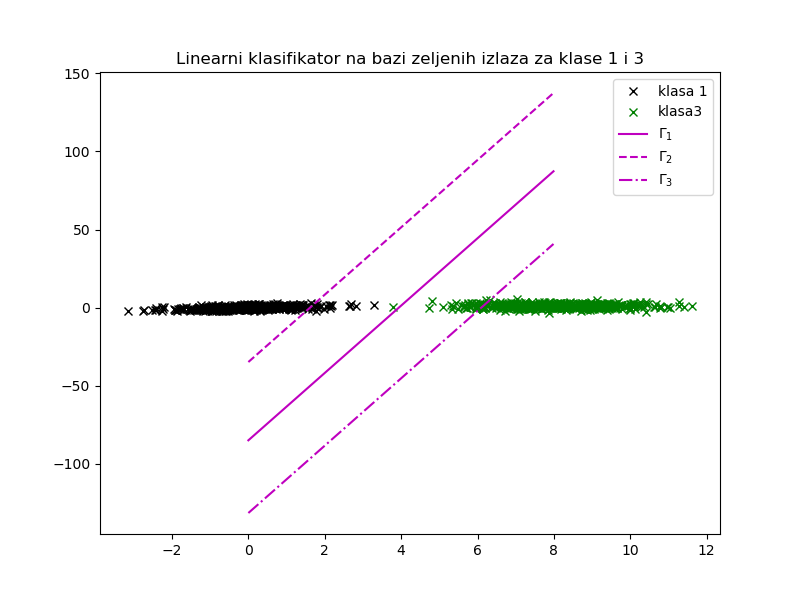

Text(0.5, 1.0, 'Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 3')

In [192]:
N1 = X1.shape[1]
N2 = X3.shape[1]

Gamma1 = np.ones((1, N1+N2)).T

Gamma2 = np.ones((1, N1+N2)).T
Gamma2[0:N1, 0] = Gamma2[0:N1, 0]*0.3

Gamma3 = np.ones((1, N1+N2)).T
Gamma3[0:N1, 0] = Gamma3[0:N1, 0]*3

v0_1, v1_1, v2_1 = metod_zeljenih_izlaza(X1, X3, Gamma1)
v0_2, v1_2, v2_2 = metod_zeljenih_izlaza(X1, X3, Gamma2)
v0_3, v1_3, v2_3 = metod_zeljenih_izlaza(X1, X3, Gamma3)

x1 = np.arange(0,8,0.01)
x2_1 = -(v0_1+v1_1*x1)/v2_1
x2_2 = -(v0_2+v1_2*x1)/v2_2
x2_3 = -(v0_3+v1_3*x1)/v2_3

plt.figure(figsize=(8,6))
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X3[0,:], X3[1,:], 'gx')
plt.plot(x1, x2_1, 'm')
plt.plot(x1, x2_2, 'm--')
plt.plot(x1, x2_3, 'm-.')
plt.legend(['klasa 1', 'klasa3', '$\Gamma_1$', '$\Gamma_2$', '$\Gamma_3$'])
plt.title("Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 3")

Vidimo da nijedan klasifikator nije optimalan. Treban nam sličan $\Gamma_1$, sa tom izmenom da se odbircima iz klase 1 pridruži malo manja vrednost, kako bi loše klasifikovani odbirci iz klase 3 bili sada na dobroj strani.

<IPython.core.display.Javascript object>


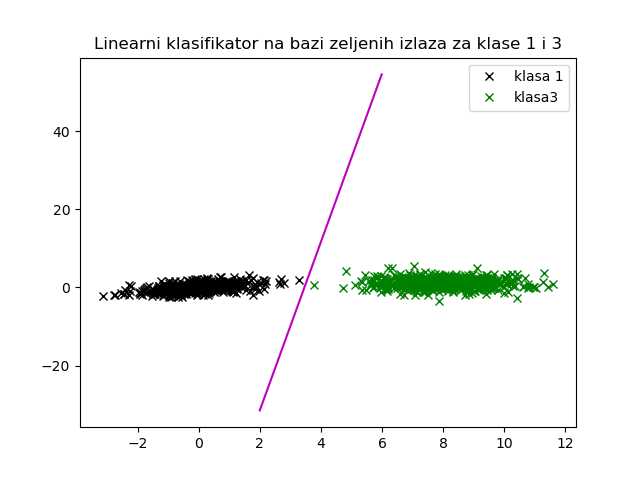

Text(0.5, 1.0, 'Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 3')

In [193]:
Gamma = np.ones((1, N1+N2)).T
Gamma[0:N1, 0] = Gamma[0:N1, 0]*0.8

v0_13, v1_13, v2_13 = metod_zeljenih_izlaza(X1, X3, Gamma)

x1_13 = np.arange(2,6,0.01)
x2_13 = -(v0_13+v1_13*x1_13)/v2_13

plt.figure()
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X3[0,:], X3[1,:], 'gx')
plt.plot(x1_13, x2_13, 'm')
plt.legend(['klasa 1', 'klasa3'])
plt.title("Linearni klasifikator na bazi zeljenih izlaza za klase 1 i 3")

Ovo će biti naš klasifikator za klase 1 i 2.

### Klasifikator za klase 2 i 3 
Projektovaćemo ga za 3 vrednosti vektora Γ. Prvi vektor će imati sve jedinice, drugi će imati vrednost 0.3 na mestima koje odgovaraju prvoj klasi, a 1 na mestima koj odgovaraju drugoj klasi i drugi će imati vrednost 3 na mestima koje odgovaraju prvoj klasi, a 1 na mestima koj odgovaraju drugoj klasi.

<IPython.core.display.Javascript object>


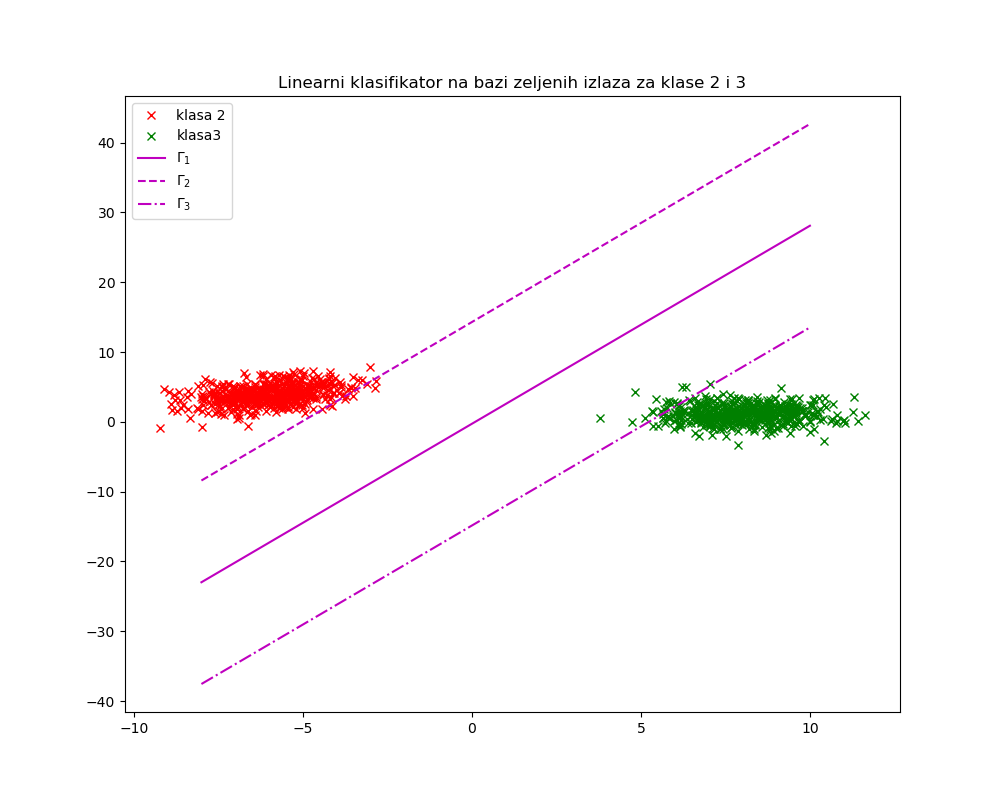

Text(0.5, 1.0, 'Linearni klasifikator na bazi zeljenih izlaza za klase 2 i 3')

In [194]:
N1 = X2.shape[1]
N2 = X3.shape[1]

Gamma1 = np.ones((1, N1+N2)).T

Gamma2 = np.ones((1, N1+N2)).T
Gamma2[0:N1, 0] = Gamma2[0:N1, 0]*0.2

Gamma3 = np.ones((1, N1+N2)).T
Gamma3[0:N1, 0] = Gamma3[0:N1, 0]*5

v0_1, v1_1, v2_1 = metod_zeljenih_izlaza(X2, X3, Gamma1)
v0_2, v1_2, v2_2 = metod_zeljenih_izlaza(X2, X3, Gamma2)
v0_3, v1_3, v2_3 = metod_zeljenih_izlaza(X2, X3, Gamma3)

x1 = np.arange(-8,10,0.01)
x2_1 = -(v0_1+v1_1*x1)/v2_1
x2_2 = -(v0_2+v1_2*x1)/v2_2
x2_3 = -(v0_3+v1_3*x1)/v2_3

plt.figure(figsize=(10,8))
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.plot(X3[0,:], X3[1,:], 'gx')
plt.plot(x1, x2_1, 'm')
plt.plot(x1, x2_2, 'm--')
plt.plot(x1, x2_3, 'm-.')
plt.legend(['klasa 2', 'klasa3', '$\Gamma_1$', '$\Gamma_2$', '$\Gamma_3$'])
plt.title("Linearni klasifikator na bazi zeljenih izlaza za klase 2 i 3")

Ovde klasifikator $\Gamma_1$ ima zadovoljavajuće performanse, tako da ga možemo proglasiti našim klasifikatorom za klase 2 i 3

In [195]:
v0_23 = v0_1
v1_23 = v1_1
v2_23 = v2_1
x1_23 = x1
x2_23 = x2_1

### Ilustracija sva 3 klasifikatora

<IPython.core.display.Javascript object>


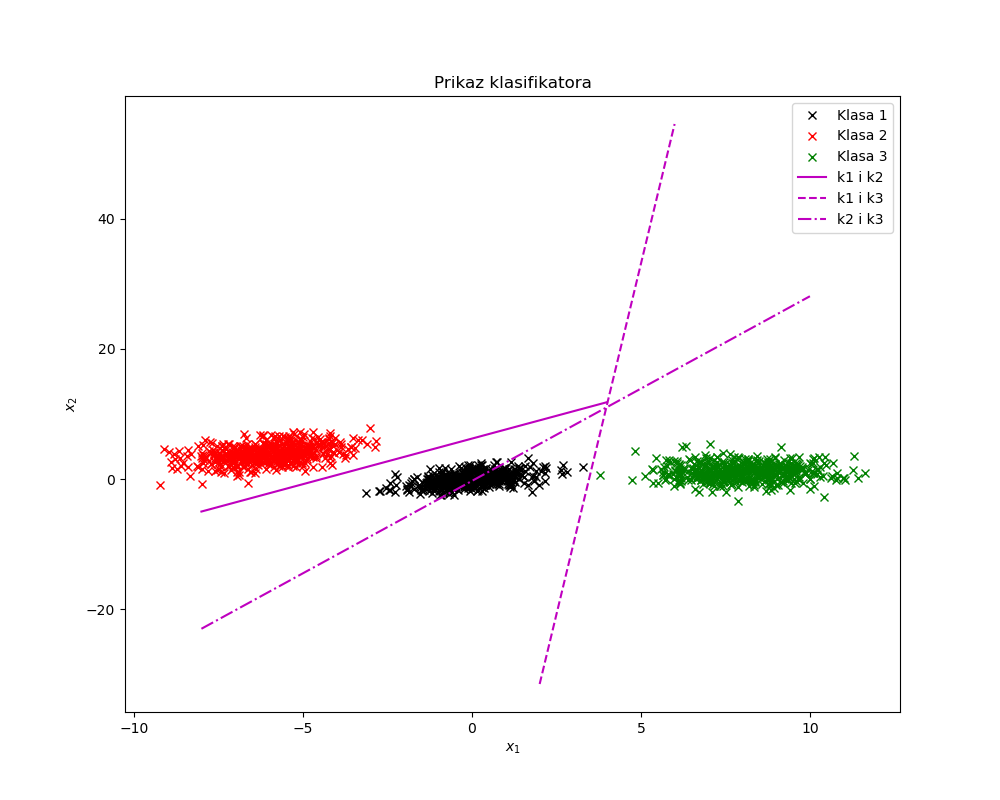

In [196]:
plt.figure(figsize=(10,8))
plt.plot(X1[0,:], X1[1,:], 'kx')
plt.plot(X2[0,:], X2[1,:], 'rx')
plt.plot(X3[0,:], X3[1,:], 'gx')
plt.plot(x1_12, x2_12, 'm')
plt.plot(x1_13, x2_13, 'm--')
plt.plot(x1_23, x2_23, 'm-.')
plt.legend(['Klasa 1', 'Klasa 2', 'Klasa 3', 'k1 i k2', 'k1 i k3', 'k2 i k3'])
plt.title('Prikaz klasifikatora')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.show()

Sada prelazimo na proces klasifikacije. Napravićemo matricu Y_pred koja će u svakoj koloni imati predikciju našeg klasifikatora. U prvoj koloni klasifikator klasa 1 i 2, drugoj 1 i 3 i trećoj 2 i 3.

In [197]:
N1 = X1.shape[1]
N2 = X2.shape[1]
N3 = X3.shape[1]

Y_pred = np.zeros((N1+N2+N3, 3))

i1 = (X[0,:]*v1_12 + X[1,:]*v2_12 + v0_12) <= 0
i2 = (X[0,:]*v1_12 + X[1,:]*v2_12 + v0_12) > 0    
Y_pred[i1,0] = 1
Y_pred[i2,0] = 2

i1 = (X[0,:]*v1_13 + X[1,:]*v2_13 + v0_13) <= 0
i2 = (X[0,:]*v1_13 + X[1,:]*v2_13 + v0_13) > 0    
Y_pred[i1,1] = 1
Y_pred[i2,1] = 3

i1 = (X[0,:]*v1_23 + X[1,:]*v2_23 + v0_23) <= 0
i2 = (X[0,:]*v1_23 + X[1,:]*v2_23 + v0_23) > 0    
Y_pred[i1,2] = 2
Y_pred[i2,2] = 3

Finalni vektor predikcija će sagledati izlaz sva tri klasifikatora i proglasiti finalnom predikcijom onu klasu koja ima najviše glasova. Ovo se svodi na traženje elementa sa najviše ponavljanja - mod.

In [199]:
Y_pred_final = mode(Y_pred, axis=1).mode
Y_pred_final = Y_pred_final.reshape(-1,)

<IPython.core.display.Javascript object>


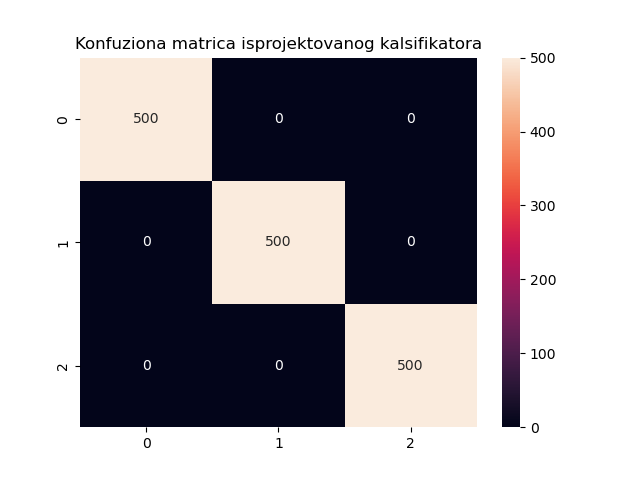

Text(0.5, 1.0, 'Konfuziona matrica isprojektovanog kalsifikatora')

In [200]:
cm = confusion_matrix(Y, Y_pred_final)
plt.figure()
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Konfuziona matrica isprojektovanog kalsifikatora')

Preciznost klasifikatora je 100%.

---
---

# Zadatak 4
Zadatak 4. 

1. Generisati po $𝑁 = 500$ dvodimenzionih odbiraka iz četiri klase koje će biti linearno separabilne. Preporuka je da to 
budu Gausovski raspodeljeni dvodimenzioni oblici. Izabrati jednu od metoda za klasterizaciju (c mean metod, 
metod kvadratne dekompozicije) i primeniti je na formirane uzorke klasa. Izvršiti analizu osetljivosti izabranog 
algoritma na početnu klasterizaciju kao i srednji broj potrebnih iteracija. Takođe izvršiti analize slučaja kada se 
apriorno ne poznaje broj klasa. 

2. Na odbircima iz prethodne tačke izabrati jednu od metoda klasterizacije (metod maksimalne verodostojnosti ili 
metod grana i granica) i primeniti je na formirane uzorke klasa. Izvršiti analizu osetljivosti izabranog algoritma na 
početnu klasterizaciju kao i srednji broj potrebnih iteracija. Takođe izvršiti analize slučaja kada se apriorno ne 
poznaje broj klasa. 

3. Generisati po $N = 500$ dvodimenzionih odbiraka iz dve klase koje su nelinearno separabilne. Izabrati jednu od 
metoda za klasterizaciju koje su primenjive za nelinearno separabilne klase (metod kvadratne dekompozicije ili metod maksimalne verodostojnosti) i ponoviti analizu iz prethodnih tačaka.

## Tačka 1 - C-mean klasterizacija
Prilikom C-mean klasterizacije potrebno je unapred znati broj klasa. Ovaj algoritam deli porostor na podprostore bisektrisama ne vodeći računa o kovarijacionim matricama. Ne zavisi od početne klasterizacije. Ne garantuje globalni minimum i stabilnost konvergencije.

C-mean je iterativni postupak klasterizacije. Kriteriju koji optimizuje je $$J_2 = tr(S_w)$$, što se svodi na $$J_2 = \frac{1}{N} \sum_{i=1}^{L}\sum_{j=1}^{N_i}||X_j^{(i)} - M_i||^2$$
gde je $L$ - broj klasa, a $N_i$ - broj odbiraka u i-tom klasteru.

$$\Delta J(i,j,l) = ||X_i - M_j(l)||^2 - ||X_i - M_{X_i}(l)||^2$$

Algoritam:

1. Korak: Inicijalizacija vrednosti i početna klasterizacija
2. Korak : Procena matetamičkog očekivanja svake klase $M_i(0)$, $i = 1, 2, ... , L$
3. Korak : Svaki odbirak reklasifikujemo u neku drugu klasu i računamo: $$\Delta J(i,j,L), ~~~j = 1, 2, ... , L ~~~~~, i=1, 2, ... , N$$
4. Korak: tražimo $min \Delta J(i,j,l)$, i ukoliko važi: $$min \Delta J(i,j,l) = \Delta J(i,t,l) \implies X_i~~\text{reklasifikovati}~~\text{u}~~\omega_t$$
5. Korak: formiranje klasifikacije $(l+1)$ iteracija
6. Korak: Ako je $\Omega (l+1)$ isto što i $\Omega (l)$ završavamo algoritam, u suprotnom idemo na korak 2

#### Implementacija algoritma
Funkciji prosle]ujemo početnu klasterizaciju - listu clusters, koja za elemente ima nizove koji sadrže elemente koji pripadaju odgovarajućem klasteru. Zadajemo maksimalni broj iteracija lmax, i output koja govori o tome da li želimo prikaz svake iteracije algoritma ili ne.

Za svaki klaster računamo centroid, potom računamo udaljenost svakog odbirka od centroida svakog klastera, i odbirak smeštamo u njemu najbliži. Ukoliko se desi da neki klaster ostane prazan - nijedan element nije ostao u njemu nakon jedne iteracije algoritma, u njega smeštamo jednu nasumičnu tačku kako bismo obezbedili bolju konvergenciju algoritma. Kraci se ponavljaju dok se ne dostigne maksimalni broj iteracija ili ne bude bilo više reklasifikacija odbiraka.

In [2]:
def Cmean(clusters, lmax=100, output=False):

    l = 1
    flag = True  
    centroids = [np.mean(cluster, axis=1).reshape(-1, 1) for cluster in clusters]
    my_data = np.concatenate(clusters, axis=1)
    assigned_class = np.zeros(my_data.shape[1], dtype=int)
    
    while l <= lmax and flag:
        
        new_clusters = [[] for i in range(len(centroids))]
        flag = False
         
        d = np.array([np.sum((my_data - centroid)**2, axis=0) for centroid in centroids])
        nxt_classes = np.argmin(d, axis=0)
        
        for i, c in enumerate(nxt_classes):
            new_clusters[c].append(my_data[:, i])
            if c != assigned_class[i]:
                flag = True           
        assigned_class = nxt_classes.copy()
        
        clusters = []
        random_points = []
        
        
#         for elem in new_clusters:
#             if elem:
#                 clusters.append(np.array(elem).T)
#             else:
#                 clusters.append(np.empty((my_data.shape[0], 0)))
        
        for elem in new_clusters:
            if elem:
                clusters.append(np.array(elem).T)
            else:
                random_point = my_data[:, np.random.randint(my_data.shape[1])].reshape(-1, 1)
                random_points.append(random_point)
                clusters.append(random_point)
                
        for point in random_points:
            next_point = False
            for cluster in clusters:
                if (point in cluster) and (cluster.shape[1]>1):
                    cluster = cluster[cluster != point]
                    break
                
        
        centroids_pom = []
        for cluster, centroid in zip(clusters, centroids):
             if cluster.shape[1] > 0:
                centroids_pom.append(np.mean(cluster, axis=1).reshape(-1, 1))
             else:
                centroids_pom.append(np.zeros_like(centroid))
        centroids = centroids_pom.copy()
        
        if output:
            plot_clusters(clusters, title=f"Iteracija broj: {l}")
            print(f"Pretisni ENTER za narednu iteracije...")
            input()

        l += 1
        
    if output:
        print("Kraj klasterizacije")

    return clusters, l

In [3]:
def plot_clusters(clusters, title=''):
    cnt = 1
    plt.figure(figsize=(8, 6))
    for cluster in clusters:
        if cluster.shape[1] > 0:
            plt.plot(cluster[0, :], cluster[1, :], 'x', label=f"Klasa {cnt}")
            cnt += 1
    plt.title(title)
    plt.legend()
    plt.show()

#### Pomoćna funkcija za početnu klasterizaciju
Prosleđuje se lista odbiraka koja treba biti inicijalno slučajno klasifikovana, kao i broj klasa L koji govori koliko klastera će na kraju postojati. Vraća se lista klastera.

In [6]:
def starting_clust(clusters, L=4):
    my_data = np.concatenate(clusters, axis=1)
    random_class = np.random.randint(0, L, my_data.shape[1])
    
    initial_clusters = [[] for i in range(L)]
    for i, c in enumerate(random_class):
        initial_clusters[c].append(my_data[:, i].reshape(-1,1))
        
    initial_clusters = [np.concatenate(cluster, axis=1) for cluster in initial_clusters]

    return initial_clusters

#### Generisanje odbiraka

<IPython.core.display.Javascript object>


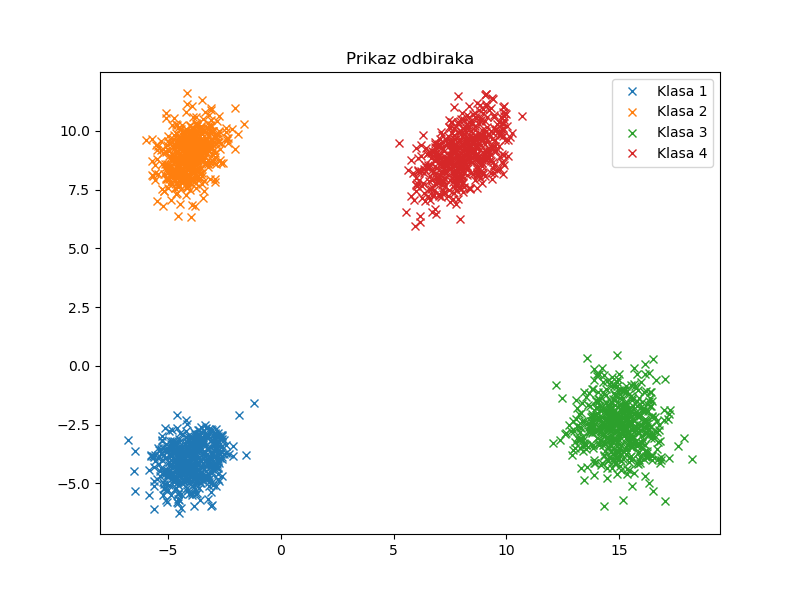

In [7]:
N = 500

M1 = np.array([-4,-4]).reshape(2,1)
M2 = np.array([-4,9]).reshape(2,1)
M3 = np.array([15,-2.5]).reshape(2,1)
M4 = np.array([8,9]).reshape(2,1)

S1 = np.array([[0.6, 0.1],[0.1, 0.6]])
S2 = np.array([[0.5, 0.2],[0.2, 0.8]])
S3 = np.array([[1, 0],[0, 1]])
S4 = np.array([[1, 0.5],[0.5, 1]])

X1 = np.random.multivariate_normal(M1.reshape(-1),S1,N).T
X2 = np.random.multivariate_normal(M2.reshape(-1),S2,N).T
X3 = np.random.multivariate_normal(M3.reshape(-1),S3,N).T
X4 = np.random.multivariate_normal(M4.reshape(-1),S4,N).T

original_clusters = [X1, X2, X3, X4]

plot_clusters(original_clusters, title='Prikaz odbiraka')

### Početna klasterizacija

<IPython.core.display.Javascript object>


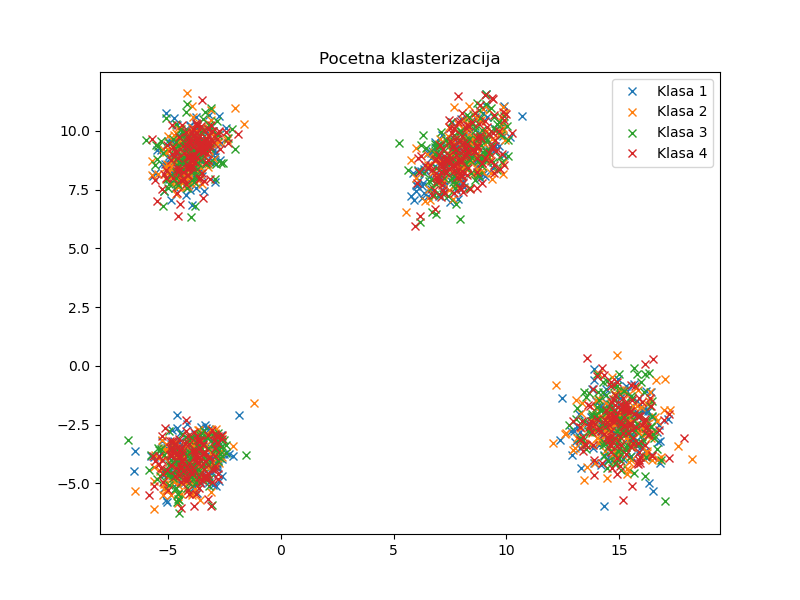

In [8]:
initial_clusters = starting_clust(original_clusters)
plot_clusters(initial_clusters, title='Pocetna klasterizacija')

<IPython.core.display.Javascript object>


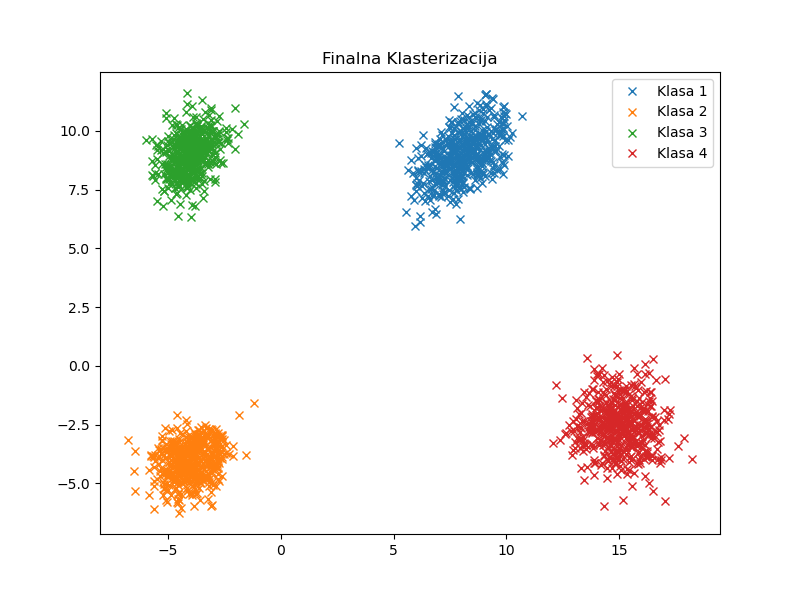

In [9]:
final_clusters, l = Cmean(initial_clusters, lmax=100)
plot_clusters(final_clusters, title="Finalna Klasterizacija")

### Analiza osetljivosti izabranog algoritma na početnu klasterizaciju i srednji broj potrebnih iteracija
Izvšićemo ovaj algoritam 10 puta i prikazati kako izgleda finalna klasterizacija svakog izvršavanja, a potom odrediti srednju vrednost potrebnih iteracija.

<IPython.core.display.Javascript object>


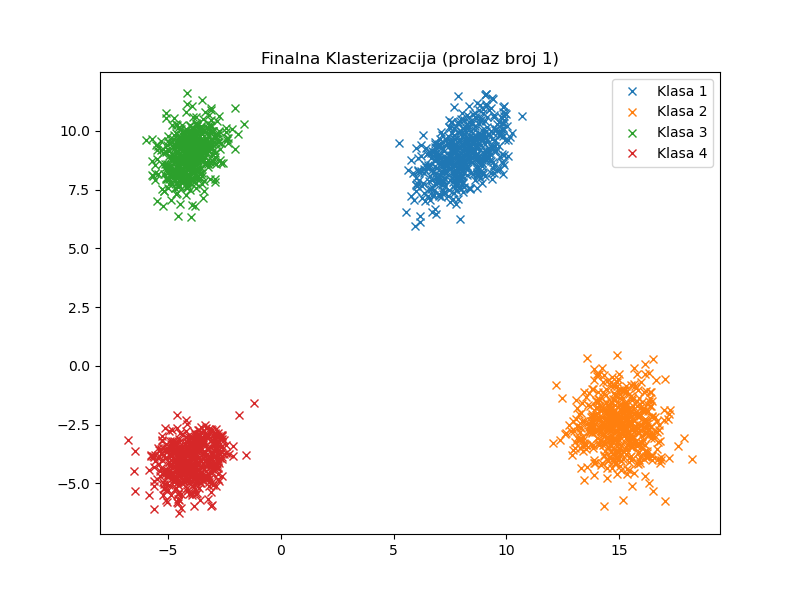

<IPython.core.display.Javascript object>


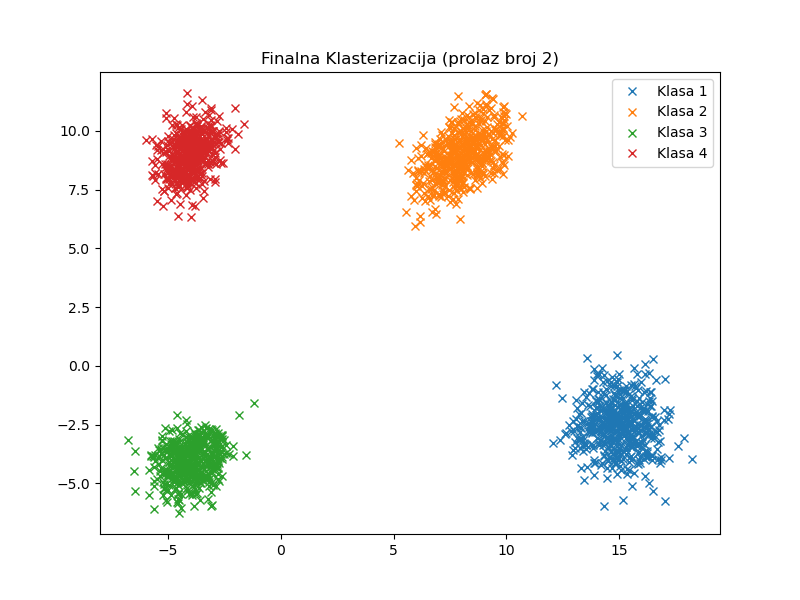

<IPython.core.display.Javascript object>


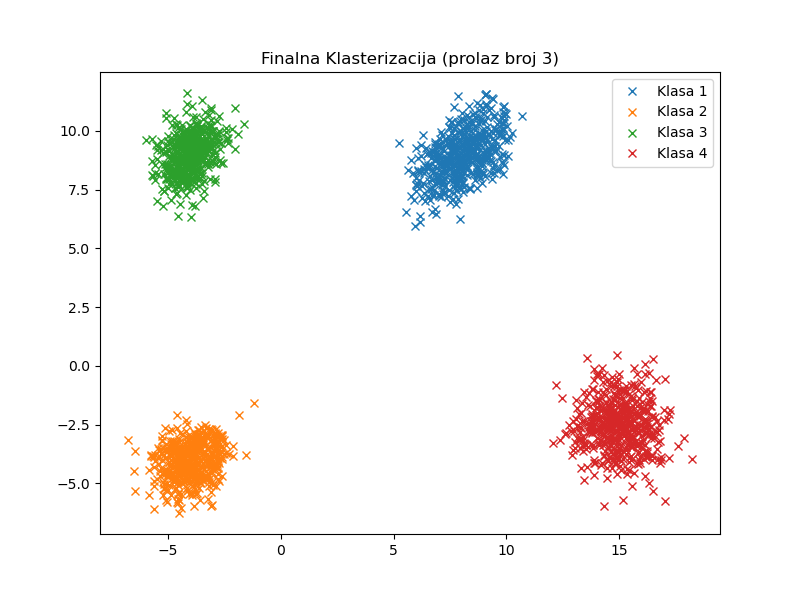

<IPython.core.display.Javascript object>


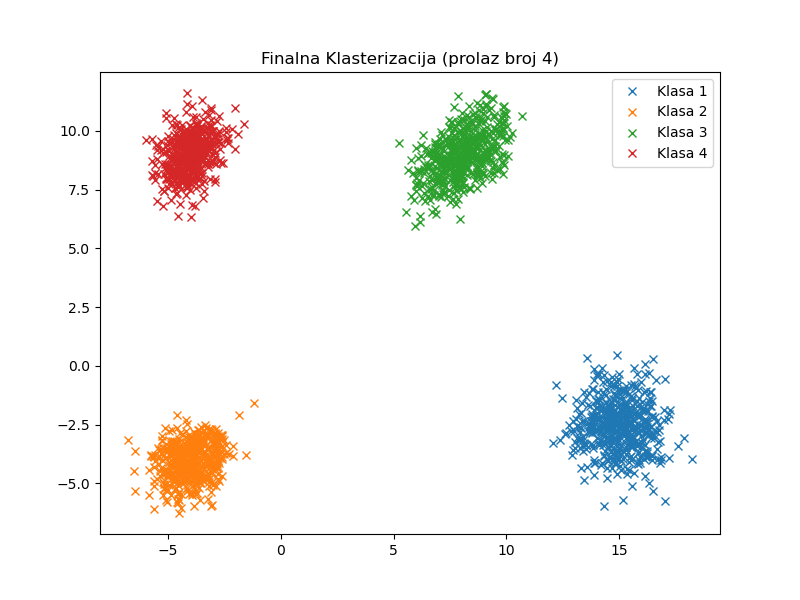

<IPython.core.display.Javascript object>


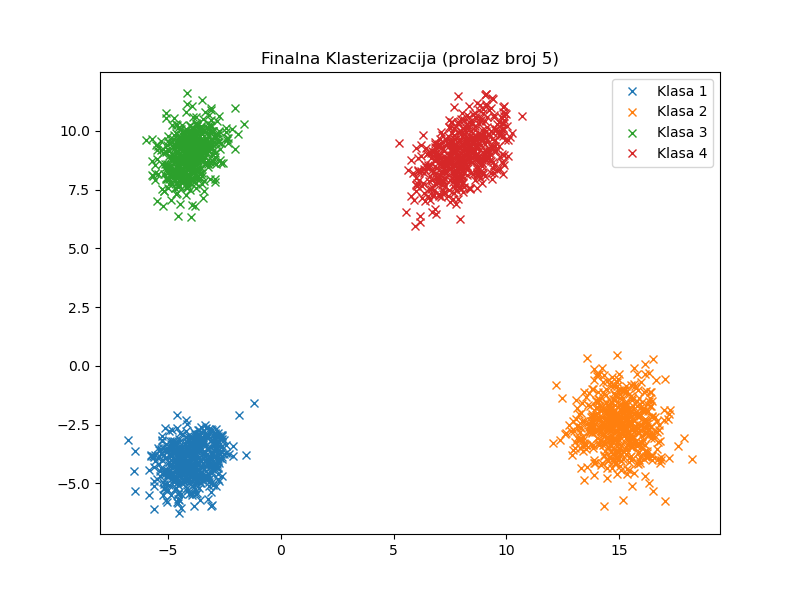

<IPython.core.display.Javascript object>


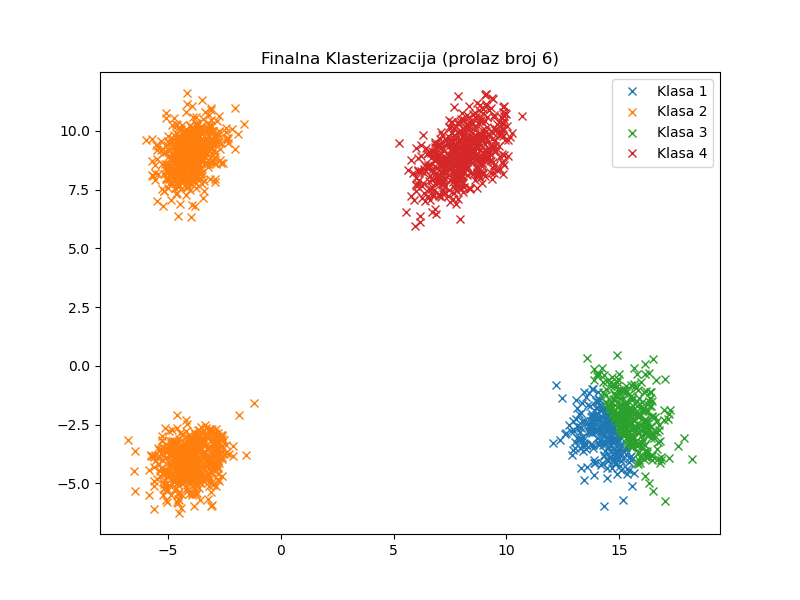

<IPython.core.display.Javascript object>


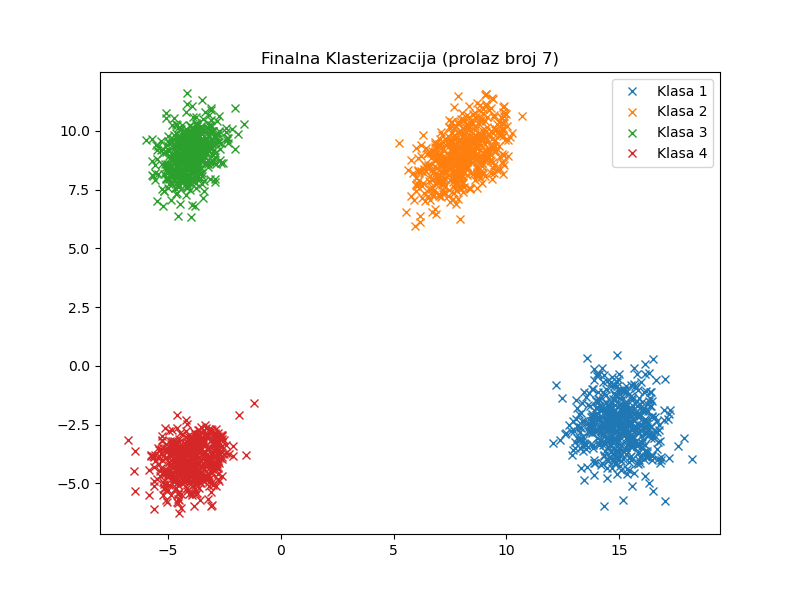

<IPython.core.display.Javascript object>


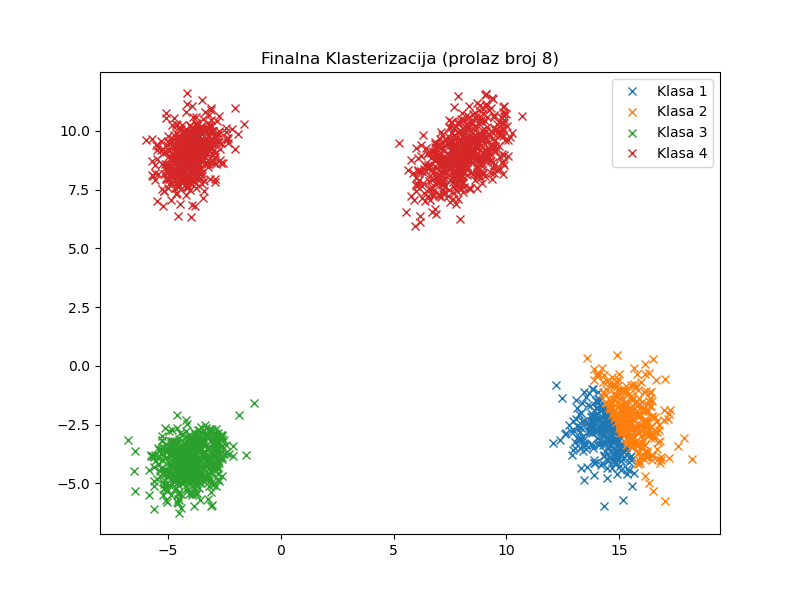

<IPython.core.display.Javascript object>


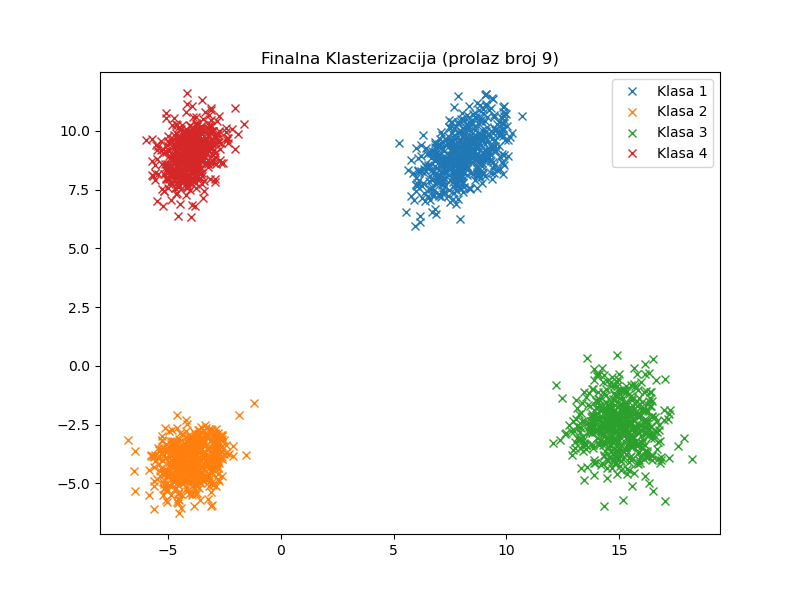

<IPython.core.display.Javascript object>


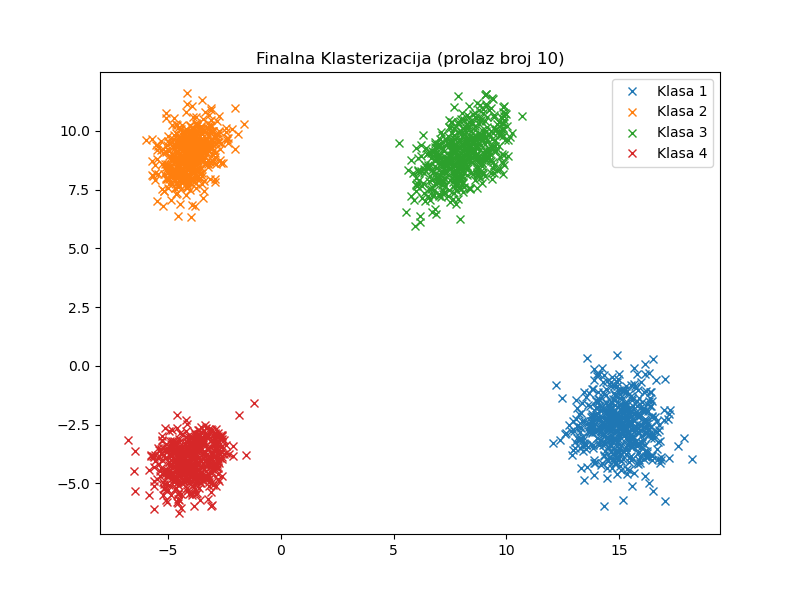

Srednji broj potrebnih iteracija je 5.5


In [11]:
l_sum = 0
m = 10

for i in range(m):
    initial_clusters = starting_clust(original_clusters)
    final_clusters, l = Cmean(initial_clusters, lmax=100)
    plot_clusters(final_clusters, title=f"Finalna Klasterizacija (prolaz broj {i+1})")
    l_sum += l

print(f"Srednji broj potrebnih iteracija je {l_sum/m}")

Uočavamo da u nekim sličajevima ne dobijamo ispravnu klasterizaciju - što potvrđuje tvrdnju da algoritam neće uvek knvergirati ka globalnom optimumu.

In [12]:
l_sum = 0
m = 1000

for i in range(m):
    initial_clusters = starting_clust(original_clusters)
    final_clusters, l = Cmean(initial_clusters, lmax=100)
    l_sum += l

print(f"Srednji broj potrebnih iteracija je {l_sum/m}")

Srednji broj potrebnih iteracija je 7.914


### Analiza slučaja kada se apriorno ne poznaje broj klasa
Testiraćemo kako radi naš algoritam za vrednosti L koje će ići od 2 do 10

<IPython.core.display.Javascript object>


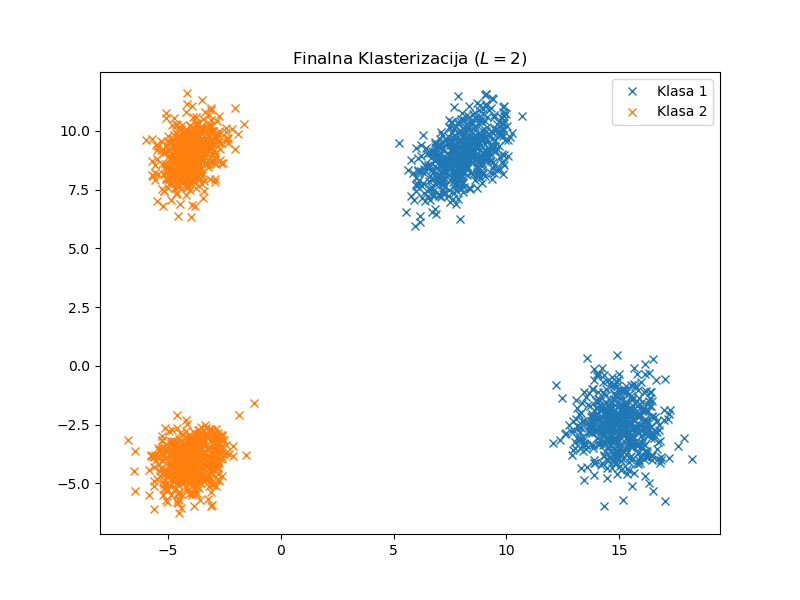

<IPython.core.display.Javascript object>


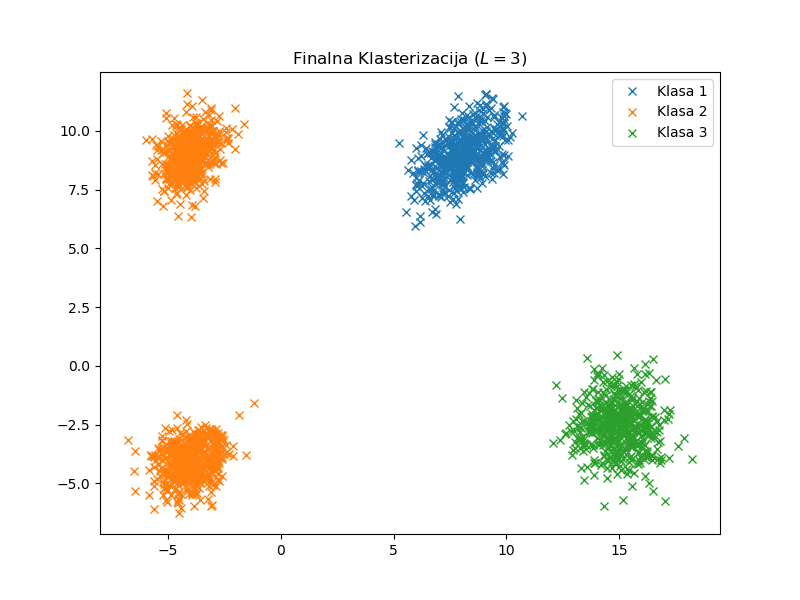

<IPython.core.display.Javascript object>


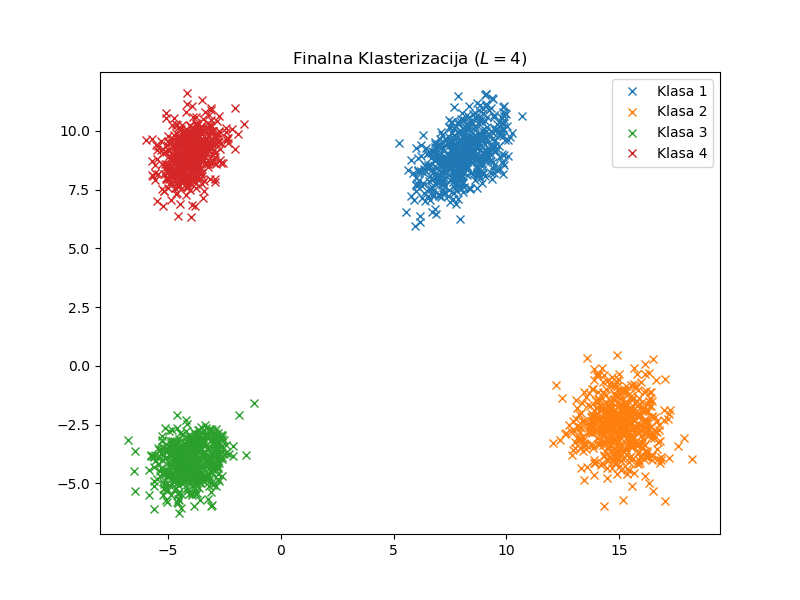

<IPython.core.display.Javascript object>


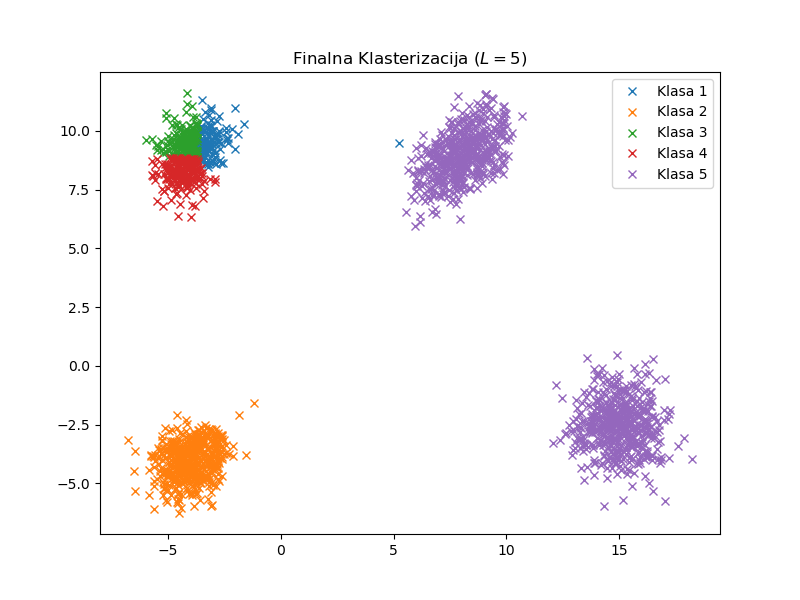

<IPython.core.display.Javascript object>


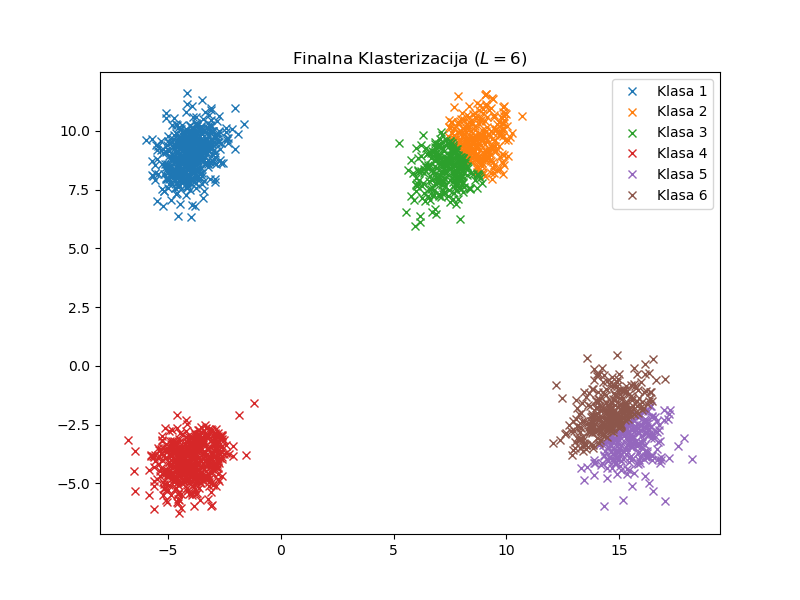

<IPython.core.display.Javascript object>


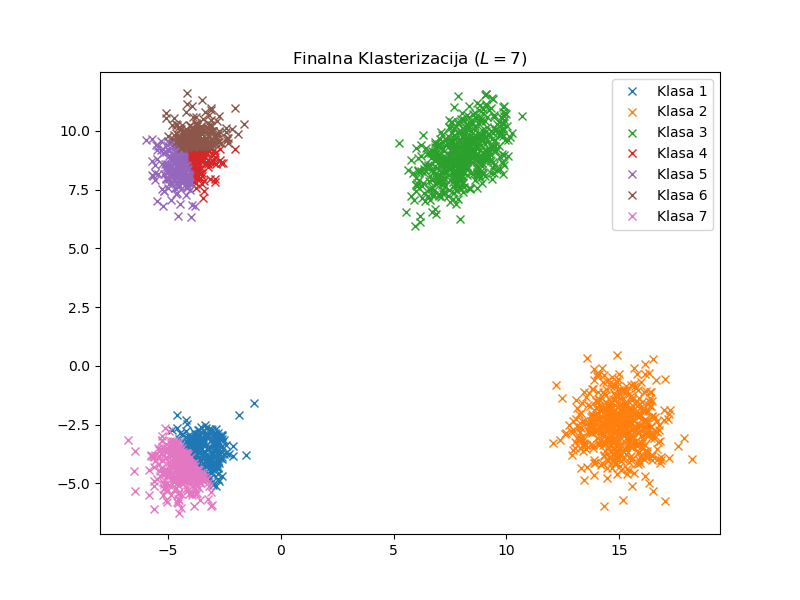

<IPython.core.display.Javascript object>


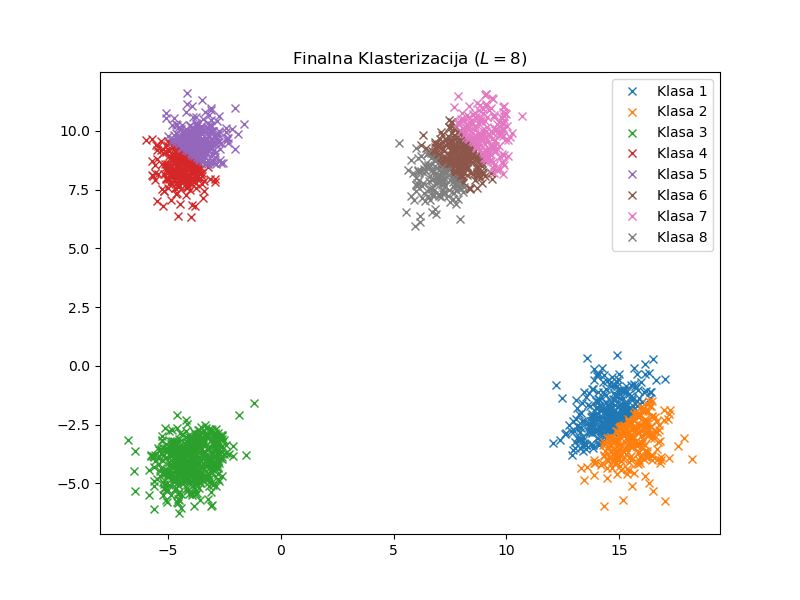

C:\Users\Nikolic\AppData\Local\Temp\ipykernel_428\170665056.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


<IPython.core.display.Javascript object>


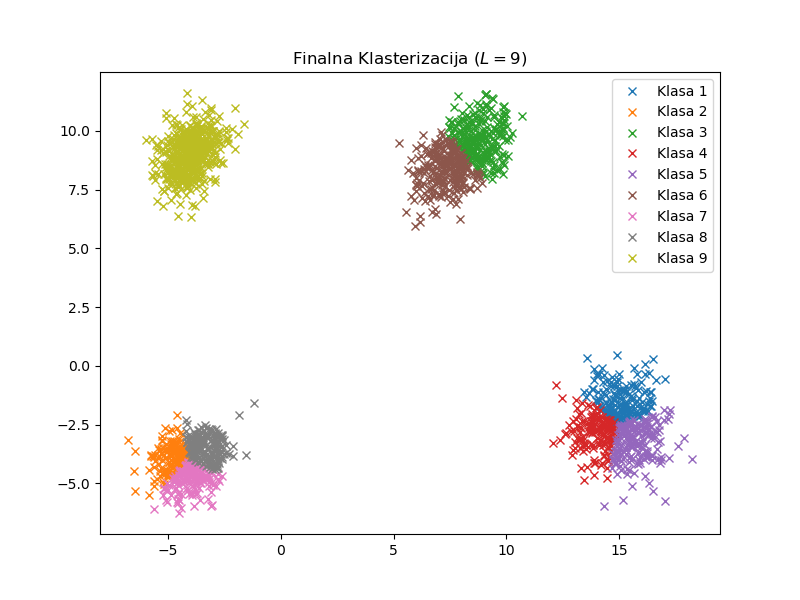

<IPython.core.display.Javascript object>


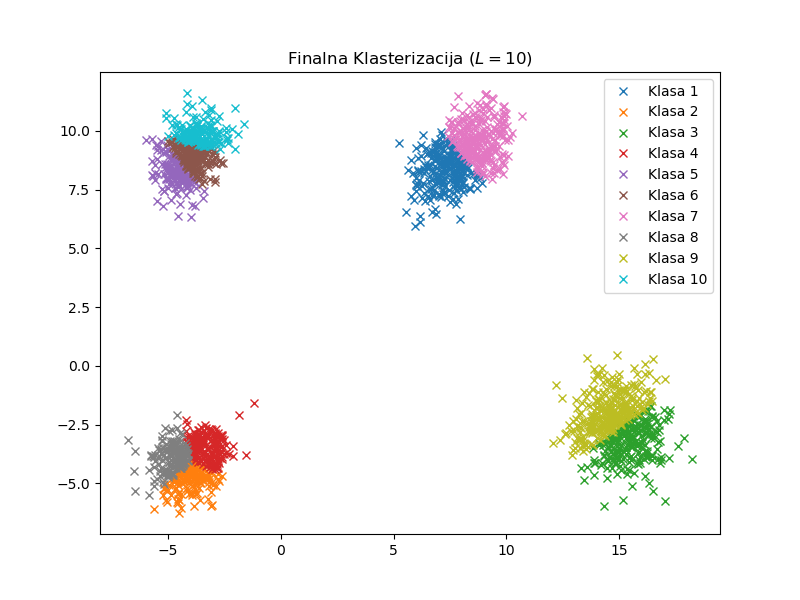

In [14]:
L_array = np.arange(2, 11)

for L in L_array:
    initial_clusters = starting_clust(original_clusters, L)
    final_clusters, l = Cmean(initial_clusters, lmax=1000)
    plot_clusters(final_clusters, title=f"Finalna Klasterizacija ($L = {L}$)")

## Tačka 2 - ML klasterizacija

ML klasterizacija se može opisati pomoću 4 jednaične koje će se rešavati iterativnim putem.
Jednačine:
$$q_i(X_j) = \frac{P_i \cdot f_i(X_j)}{f(X_j)}$$

$$P_i = \frac{1}{N} \sum_{j=1}^Nq_i(X_j)$$

$$M_i = \frac{1}{N_i}\sum_{j=1}^{N_i}q_i(X_j) \cdot X_j$$

$$\Sigma_i = \frac{1}{N_i} \sum_{j=1}^{N_i} q_i(X_j) \cdot (X_j-M_i)(X_j-M_i)^T$$

Algoritam:
1. Korka: Inicijalizacija $l=0$ i zadamo $\Delta$, obično oko 0.01 ili 0.001
2. Korak: Inicijalna klasterizacija $\Omega(0)$ i procena $P_i(0)$, $M_i(0)$, $\Sigma_i(0)$, $i = 1,...,L$
3. Korak: Na osnovu prve jednačine $\implies$ $q_i^{(l)}(X_j)$,$~~ i=1:L~~~j=1:N$
4. Korak: Na osnovu jednačina 2, 3 i 4 računamo $P_i(l)$, $M_i(l)$, $\Sigma_i(l)$, $~~ i=1:L$
5. Korak: $l=l+1$
6. Korka: Na osnovu prve jednačine $\implies$ $q_i^{(l+1)}(X_j)$,$~~ i=1:L~~~j=1:N$
7. Korak: Tražimo $max(|q_i^{(l)}(X_j) - q_i^{(l-1)}(X_j)|)$, ukoliko je veći od $\Delta$ idemo u Korak 4, u suprotnom je kraj algoritma.

Odluka za $X_j$:  $max(q_i(X_j)) = q_t(X_j) \implies X_j \in \omega_t$

#### Pomoćne funckije za računanje unimodalne i polimodalne gausovske raspodele u jednoj tački
Analogne onim u drugom zadatku.

In [15]:
def gaussian_pdf(X, M, S):
    detS = np.linalg.det(S)
    invS = np.linalg.inv(S)
    f = 1/(2*np.pi*detS**0.5)*np.exp(-0.5*(X-M).T@invS@(X-M))
    return f[0,0]

def poly_gaussian_pdf(X, P, M, S):

    f = []
    for p,m,s in zip(P,M,S):
        
        f.append(p*gaussian_pdf(X,m,s))
            
    return sum(f)

#### Implementacija algoritma
Za svaki klaster se sračuna srednja vrednost, kovarijaciona matrica i verovatnoća pojavljivanja. Nakon toga se na osnovu formule računa $q_i$ za svaki odbirka i svaku klasu. Na kraju će qi biti lista koja sadrži onoliko elemenata koliko postoji klastera, a svaki element će biti vektor vrednosti funkcije $q_i$, gde i predstavlja odgovarajući klaster, za svaki odbirak. Potom na osnovu qi preračunavamo srednju vrednost, kovarijacionu matricu i verovatnoću pojavljivanja klastera i na osnovu njih računamo $q_i$ za narednu iteraciju. Ukoliko je maksimum apsolutne razlike elemenata novog i starog $q_i$ iteracije algoritma se završavaju i prelazi se na klasifikaciju, u suprotnom nastavljamo sa iteracijama. Klasterizacija se vrši na način opisan u teorijskom delu.

In [16]:
def MLC(clusters, delta=0.001, lmax=100):
    l = 0
    max_dif = 2*delta
    my_data = np.concatenate(clusters, axis=1)

    P = [cluster.shape[1]/my_data.shape[1] for cluster in clusters]
    M = [np.mean(cluster, axis=1).reshape(-1, 1) for cluster in clusters]
    S = [np.cov(cluster) for cluster in clusters]

    fi = [[] for i in range(len(clusters))]
    for i in range(len(clusters)):
        for j in range(my_data.shape[1]):
            fi[i].append(gaussian_pdf(my_data[:,j].reshape(-1,1), M[i], S[i]))

    f = [poly_gaussian_pdf(my_data[:,i].reshape(-1,1),P,M,S) for i in range(my_data.shape[1])]

    q = [[] for i in range(len(clusters))]    
    for i in range(len(clusters)):
        for j in range(my_data.shape[1]):
            q[i].append(P[i]*fi[i][j]/f[j])

    while(max_dif > delta and l<lmax):
        P = [sum(q[i])/len(q[i]) for i in range(len(clusters))]

        M = []
        for i in range(len(clusters)):
            pom = np.zeros((2,1))
            for j in range(my_data.shape[1]):
                pom += q[i][j]*my_data[:, j].reshape(-1,1)
            pom = pom / (my_data.shape[1] * P[i])
            M.append(pom)

        S = []
        for i in range(len(clusters)):
            pom = np.zeros((2,2))
            for j in range(my_data.shape[1]):
                pom += q[i][j]*(my_data[:, j].reshape(-1,1) - M[i])@(my_data[:, j].reshape(-1,1) - M[i]).T
            pom = pom / (my_data.shape[1] * P[i])
            S.append(pom)

        l += 1

        fi = [[] for i in range(len(clusters))]
        for i in range(len(clusters)):
            for j in range(my_data.shape[1]):
                fi[i].append(gaussian_pdf(my_data[:,j].reshape(-1,1), M[i], S[i]))

        f = [poly_gaussian_pdf(my_data[:,i].reshape(-1,1),P,M,S) for i in range(my_data.shape[1])]

        q_new = [[] for i in range(len(clusters))]    
        for i in range(len(clusters)):
            for j in range(my_data.shape[1]):
                q_new[i].append(P[i]*fi[i][j]/f[j])

        substracted = []
        for i in range(len(q_new)):
            for j in range(len(q_new[i])):
                substracted.append(np.abs(q_new[i][j] - q[i][j]))

        max_dif = max(substracted)
        q = q_new.copy()
        
    result = [max(range(len(q)), key=lambda i: col[i]) for col in zip(*q)]
    final_clust = [[] for i in range(len(clusters))]
    for i, elem in enumerate(result):
        final_clust[elem].append(my_data[:, i])
    for i in range(len(final_clust)):
        final_clust[i] = np.array(final_clust[i]).T
        
    return final_clust, l

<IPython.core.display.Javascript object>


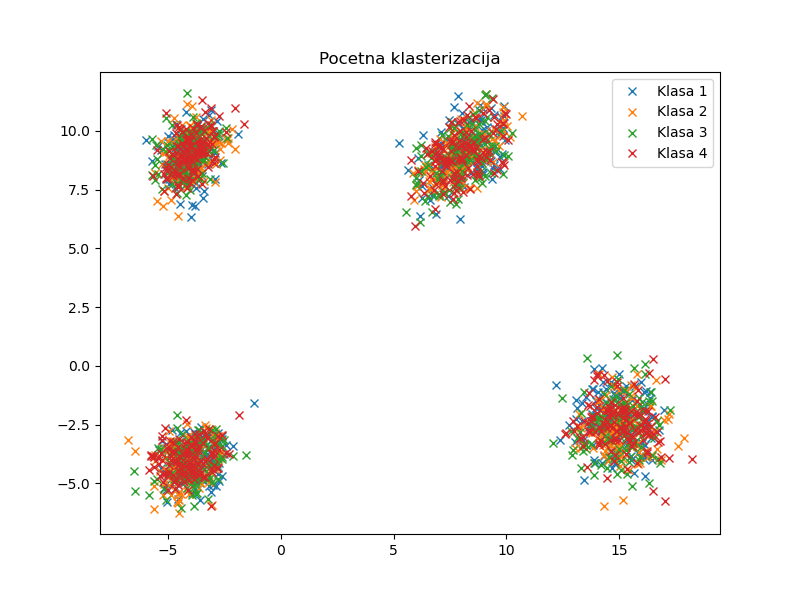

In [17]:
initial_clusters = starting_clust(original_clusters, 4)
plot_clusters(initial_clusters, title='Pocetna klasterizacija')

<IPython.core.display.Javascript object>


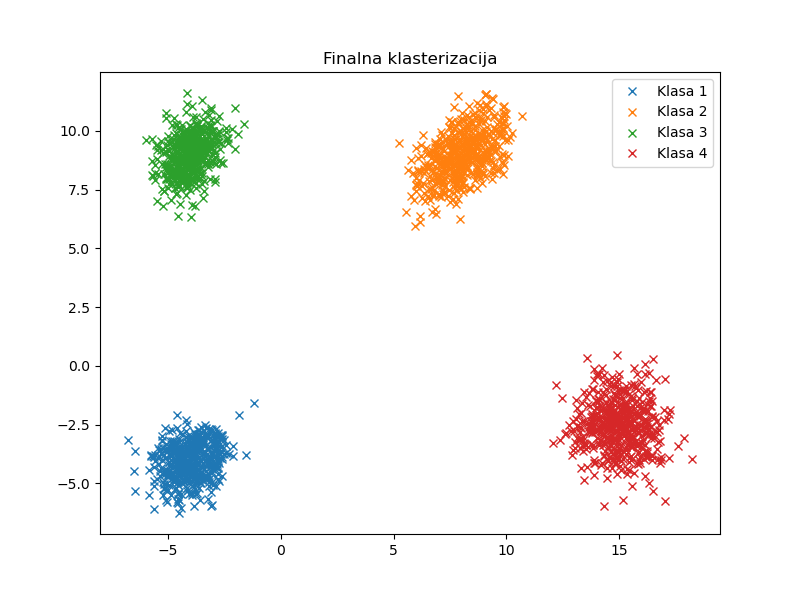

In [18]:
final_clust, l = MLC(initial_clusters, 0.001, 100)
plot_clusters(final_clust, title='Finalna klasterizacija')

### Analiza osetljivosti izabranog algoritma na početnu klasterizaciju i srednji broj potrebnih iteracija
Izvršićemo ovaj algoritam 10 puta i prikazati kako izgleda finalna klasterizacija svakog izvršavanja, a potom odrediti srednju vrednost potrebnih iteracija.

<IPython.core.display.Javascript object>


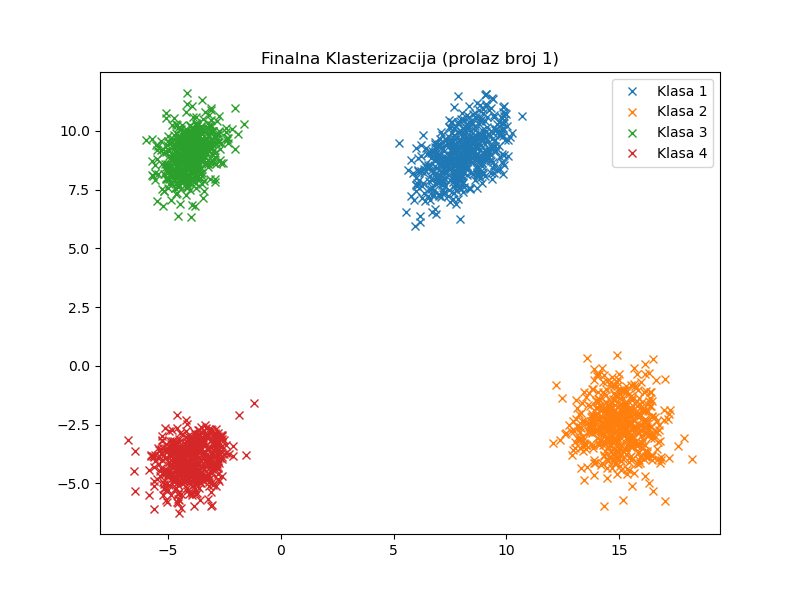

<IPython.core.display.Javascript object>


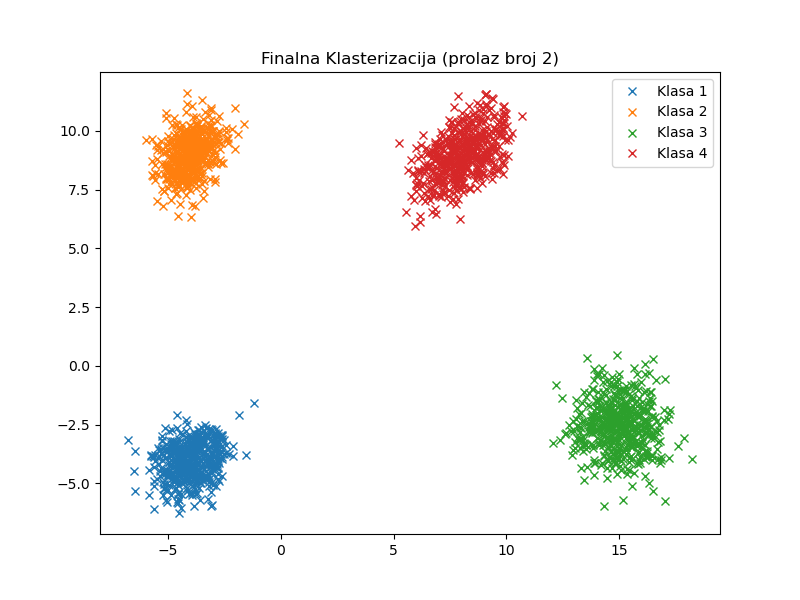

<IPython.core.display.Javascript object>


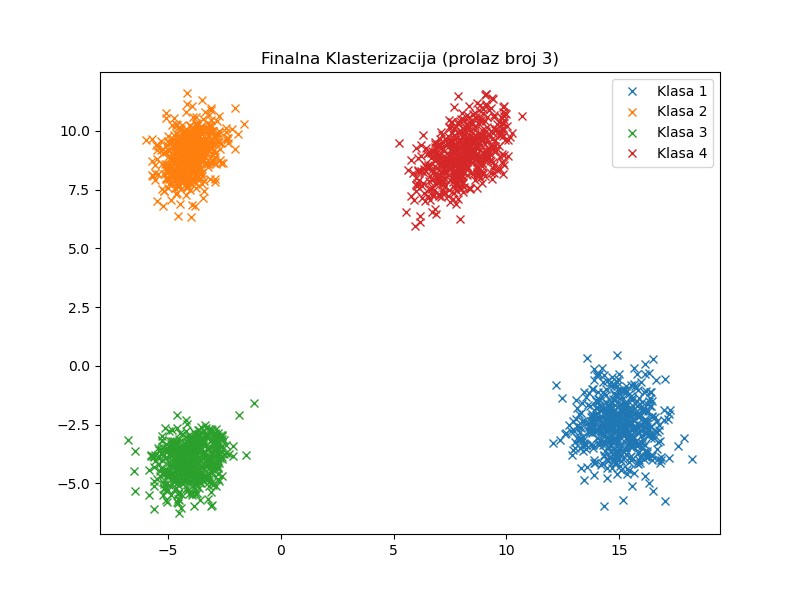

<IPython.core.display.Javascript object>


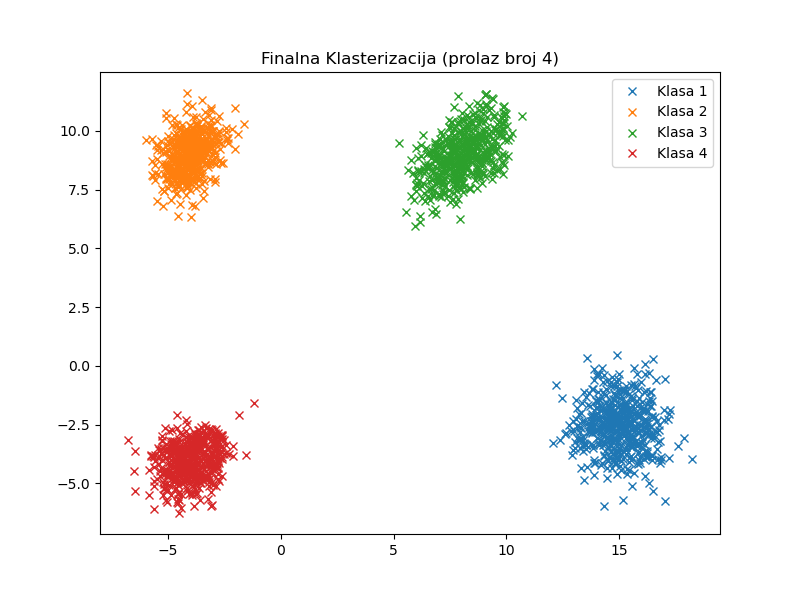

<IPython.core.display.Javascript object>


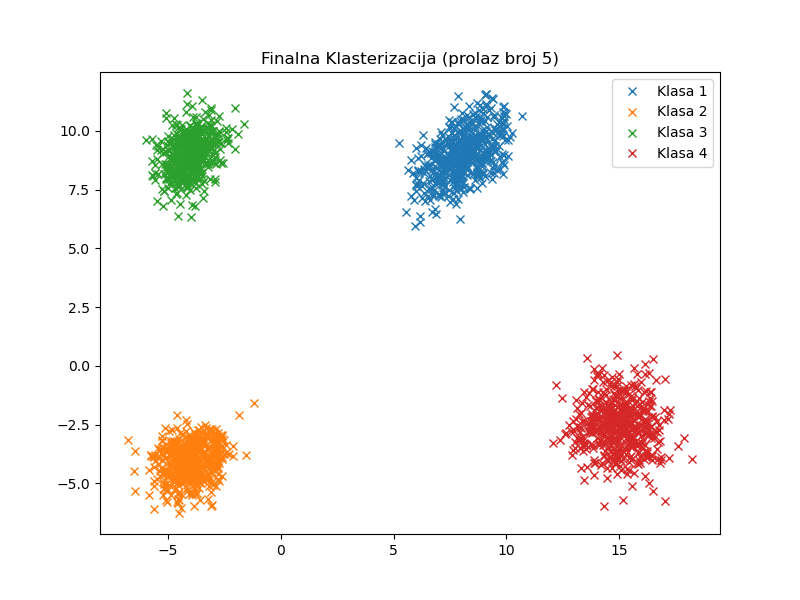

<IPython.core.display.Javascript object>


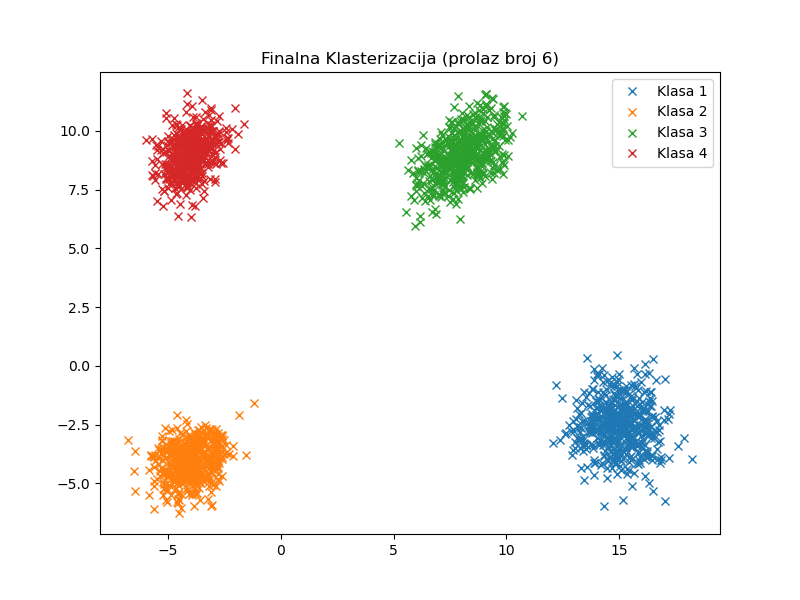

<IPython.core.display.Javascript object>


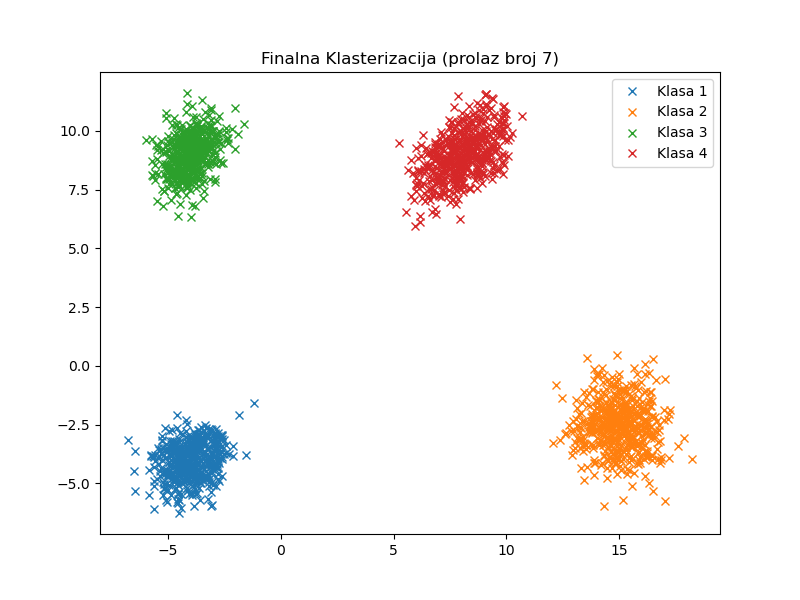

<IPython.core.display.Javascript object>


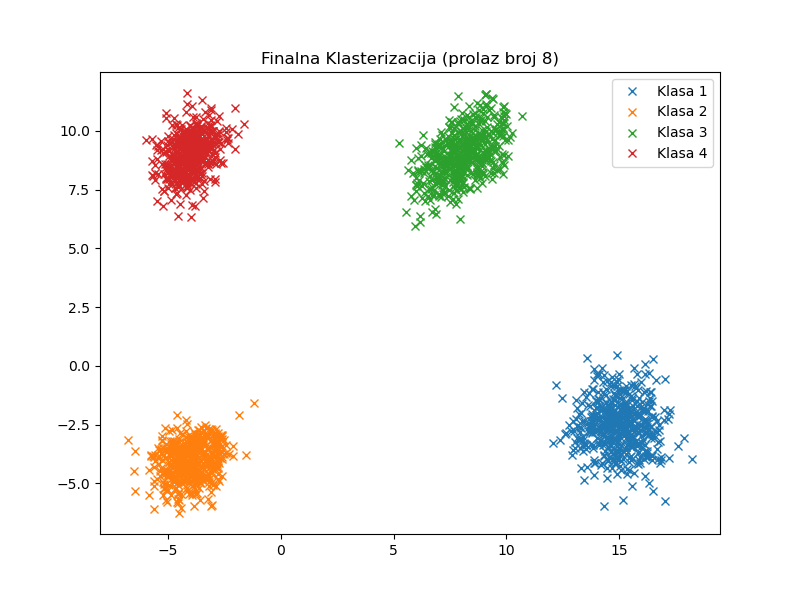

<IPython.core.display.Javascript object>


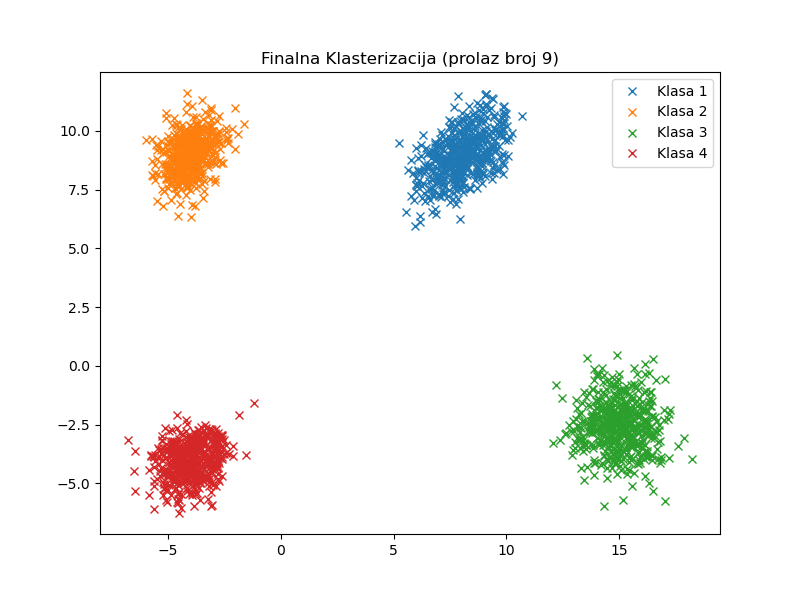

<IPython.core.display.Javascript object>


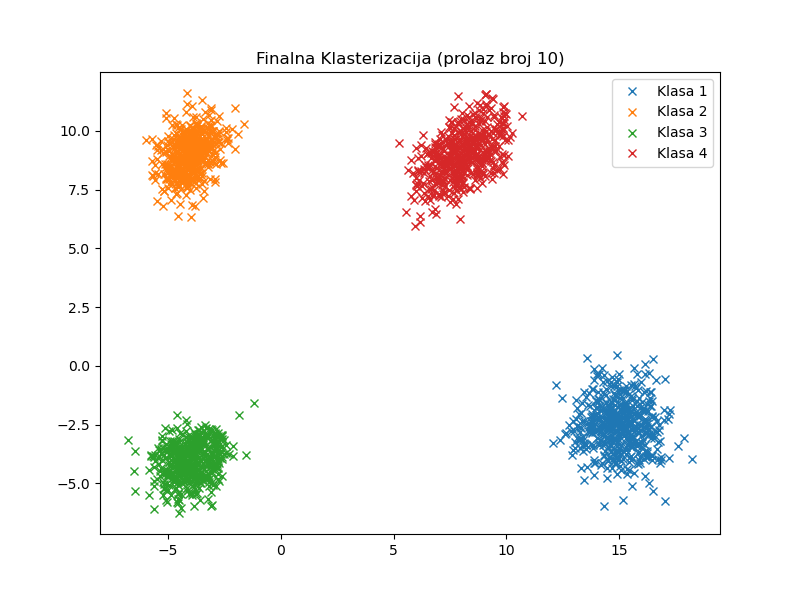

Srednji broj potrebnih iteracija je 42.5


In [19]:
l_sum = 0
m = 10

for i in range(m):
    initial_clusters = starting_clust(original_clusters)
    final_clusters, l = MLC(initial_clusters, delta=0.001, lmax=1000)
    plot_clusters(final_clusters, title=f"Finalna Klasterizacija (prolaz broj {i+1})")
    l_sum += l

print(f"Srednji broj potrebnih iteracija je {l_sum/m}")

Algoritam uvek iskonvergira na način koji smo očekivali, međutim vremenski je zahtevniji od Cmean algoritma.

### Analiza slučaja kada se apriorno ne poznaje broj klasa
Testiraćemo kako radi naš algoritam za vrednosti L koje će ići od 2 do 5

<IPython.core.display.Javascript object>


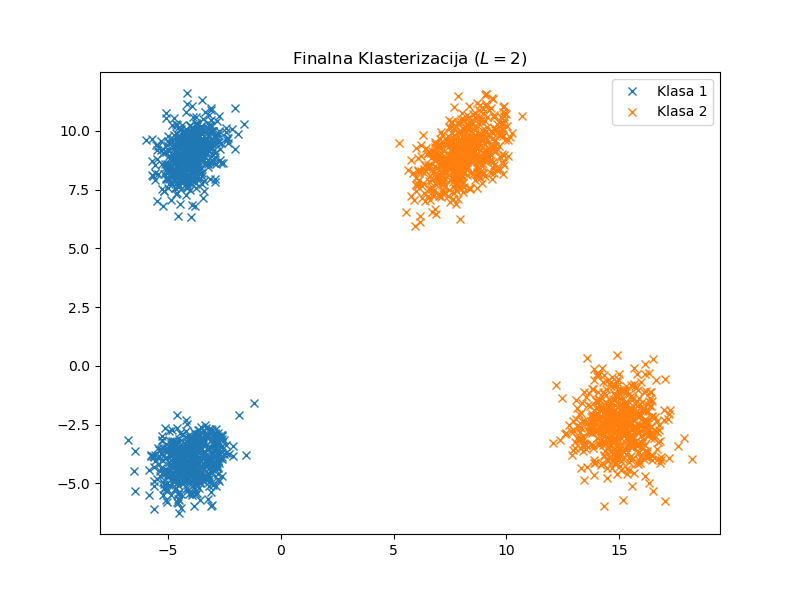

<IPython.core.display.Javascript object>


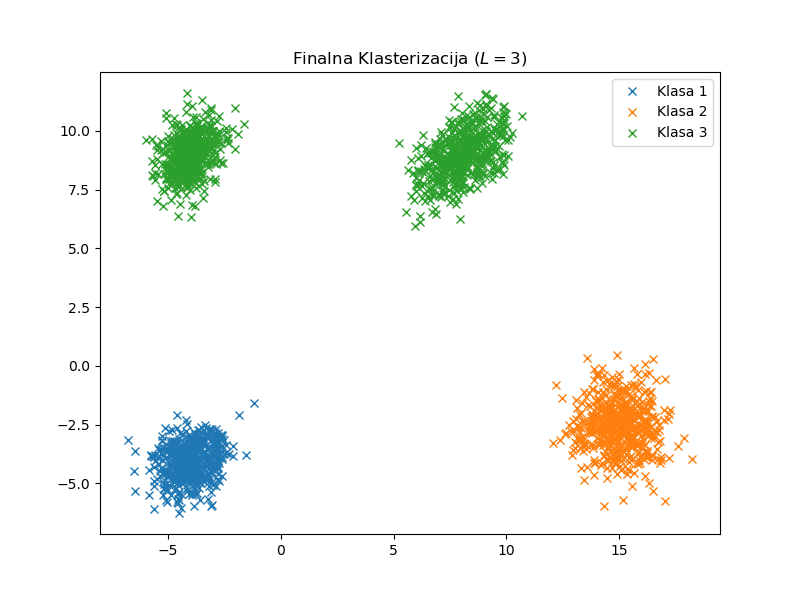

<IPython.core.display.Javascript object>


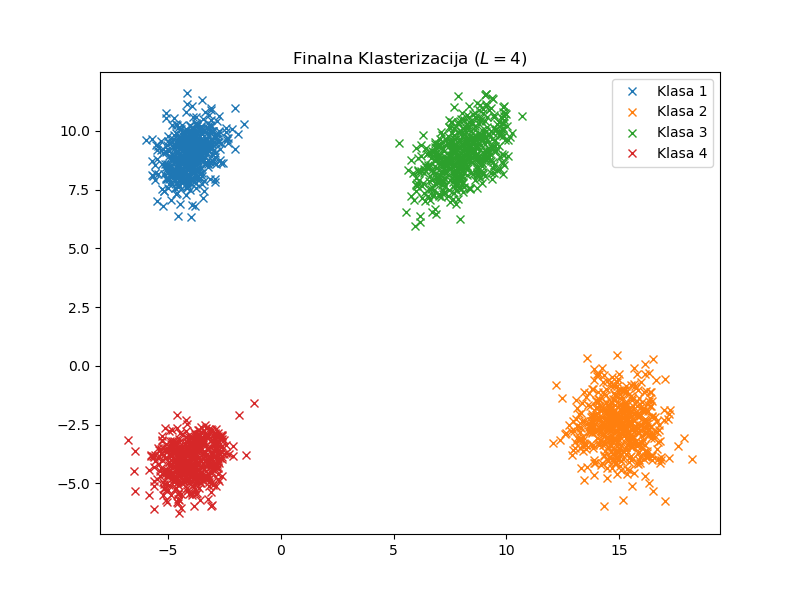

<IPython.core.display.Javascript object>


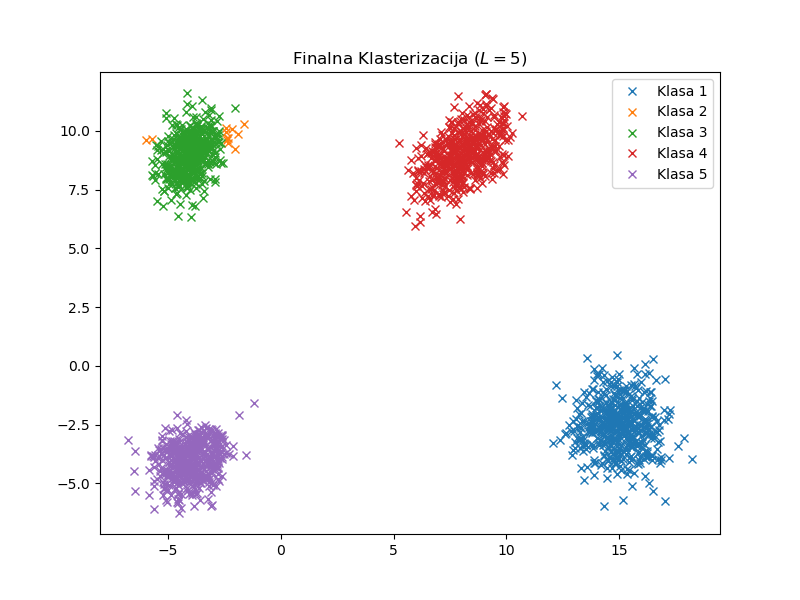

In [22]:
L_array = np.arange(2, 6)

for L in L_array:
    initial_clusters = starting_clust(original_clusters, L)
    final_clusters, l = MLC(initial_clusters, delta=0.001, lmax=1000)
    plot_clusters(final_clusters, title=f"Finalna Klasterizacija ($L = {L}$)")

## Tačka 3 - Klasterizacija nelinearno separabilnih odibraka metodom kvadratne dekompozicije

Algoritam je analogan Cmean algoritmu sa jedinom razlikom što se distanca sada računa kao: $$d = \frac{1}{2} \cdot (X_i - M_j)^T \Sigma_j^{-1} (X_i - M_j) + \frac{1}{2} ln|\Sigma_j| - \frac{1}{2} ln|P_j|$$

In [24]:
def kvadratna_dekompozicija(clusters, lmax=100, output=False):

    l = 1
    flag = True  
    my_data = np.concatenate(clusters, axis=1)
    assigned_class = np.zeros(my_data.shape[1], dtype=int)
    centroids = [np.mean(cluster, axis=1).reshape(-1, 1) for cluster in clusters]
    S = [np.cov(cluster) for cluster in clusters]
    P = [cluster.shape[1]/my_data.shape[1] for cluster in clusters]
    

    
    while l <= lmax and flag:
        
        new_clusters = [[] for i in range(len(centroids))]
        flag = False
        
        d = np.zeros((len(centroids), my_data.shape[1]))
        
        for i in range(len(centroids)):
            for j in range(my_data.shape[1]):
                dist = 0.5*(my_data[:,j].reshape(-1,1)-centroids[i]).T @ np.linalg.inv(S[i]) @ (my_data[:,j].reshape(-1,1)-centroids[i]) + 0.5*np.log(np.linalg.det(S[i])) - 0.5*np.log(P[i])
                d[i,j] = dist[0,0]
                
        nxt_classes = np.argmin(d, axis=0)
        
        for i, c in enumerate(nxt_classes):
            new_clusters[c].append(my_data[:, i])
            if c != assigned_class[i]:
                flag = True           
        assigned_class = nxt_classes.copy()
        
        clusters = []
        random_points = []
        
        for elem in new_clusters:
            if elem:
                clusters.append(np.array(elem).T)
            else:
                random_point = my_data[:, np.random.randint(my_data.shape[1])].reshape(-1, 1)
                random_points.append(random_point)
                clusters.append(random_point)
                
        for point in random_points:
            next_point = False
            for cluster in clusters:
                if (point in cluster) and (cluster.shape[1]>1):
                    cluster = cluster[cluster != point]
                    break
                
        
        centroids_pom = []
        for cluster, centroid in zip(clusters, centroids):
             if cluster.shape[1] > 0:
                centroids_pom.append(np.mean(cluster, axis=1).reshape(-1, 1))
             else:
                centroids_pom.append(np.zeros_like(centroid))
        centroids = centroids_pom.copy()
        
        S_pom = []
        for cluster, sigma in zip(clusters, S):
             if cluster.shape[1] > 0:
                S_pom.append(np.cov(cluster))
             else:
                S_pom.append(np.zeros_like(sigma))
        S = S_pom.copy()
        
        if output:
            plot_clusters(clusters, title=f"Iteracija broj: {l}")
            print(f"Pretisni ENTER za narednu iteracije...")
            input()

        l += 1
        
    if output:
        print("Kraj klasterizacije")

    return clusters, l
    

#### Generisanje odbiraka

<IPython.core.display.Javascript object>


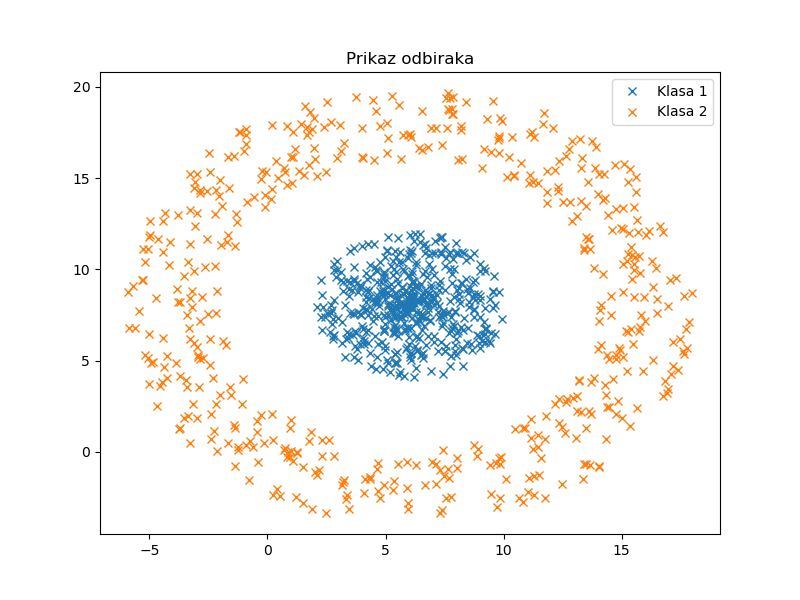

In [54]:
N = 500

C = np.array([6,8]).reshape(2,1)
R = 4*np.random.rand(1,N)
Teta = 2 * np.pi * np.random.rand(1,N)
X1 = R*np.cos(Teta)
X2 = R*np.sin(Teta)
X = np.concatenate((X1,X2), axis=0) + C

C = np.array([6,8]).reshape(2,1)
R = 8 + 4 * np.random.rand(1,N)
Teta = 2*np.pi * np.random.rand(1,N)
X1 = R*np.cos(Teta)
X2 = R*np.sin(Teta)
Y = np.concatenate((X1,X2), axis=0) + C

original_clusters = [X, Y]
plot_clusters(original_clusters, title='Prikaz odbiraka')

<IPython.core.display.Javascript object>


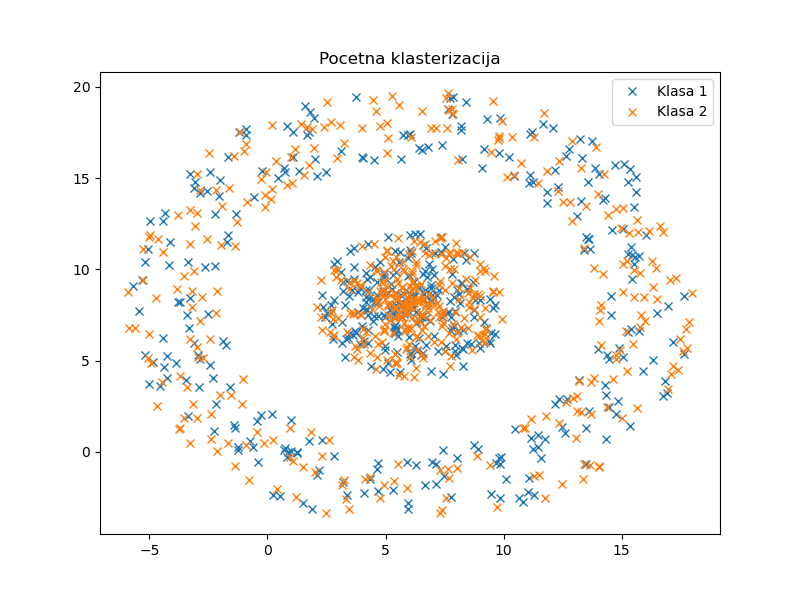

In [55]:
initial_clusters = starting_clust(original_clusters, 2)
plot_clusters(initial_clusters, title='Pocetna klasterizacija')

<IPython.core.display.Javascript object>


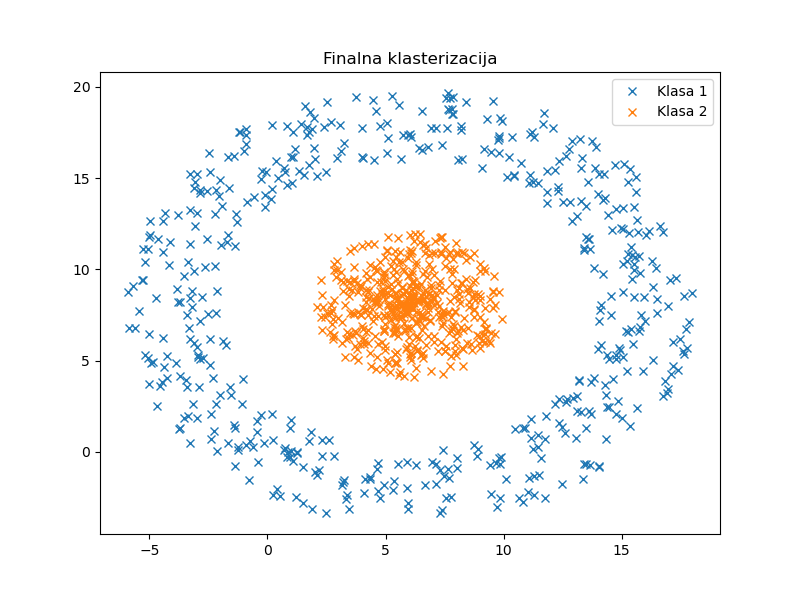

In [56]:
final_clust, l = kvadratna_dekompozicija(initial_clusters)
plot_clusters(final_clust, title='Finalna klasterizacija')

Vidimo da kvadratna dekompozicija ne daje dobar rezultat. To je zato što je ova metoda osetljiva na početnu klasterizaciju. Izvršićemo ovaj algoritam još 10 puta da vidimo da li ćemo dobiti bolje rezultate.

### Analiza osetljivosti izabranog algoritma na početnu klasterizaciju i srednji broj potrebnih iteracija
Izvršićemo ovaj algoritam 10 puta i prikazati kako izgleda finalna klasterizacija svakog izvršavanja, a potom odrediti srednju vrednost potrebnih iteracija.

<IPython.core.display.Javascript object>


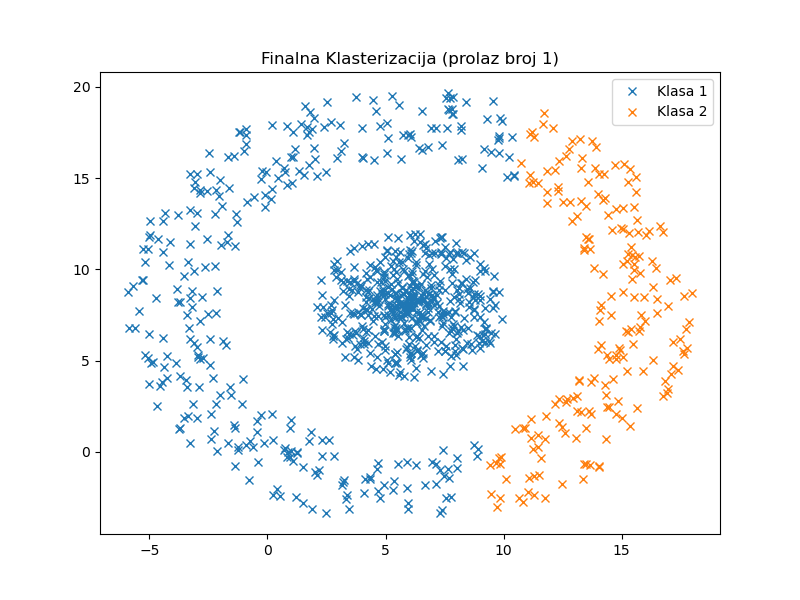

<IPython.core.display.Javascript object>


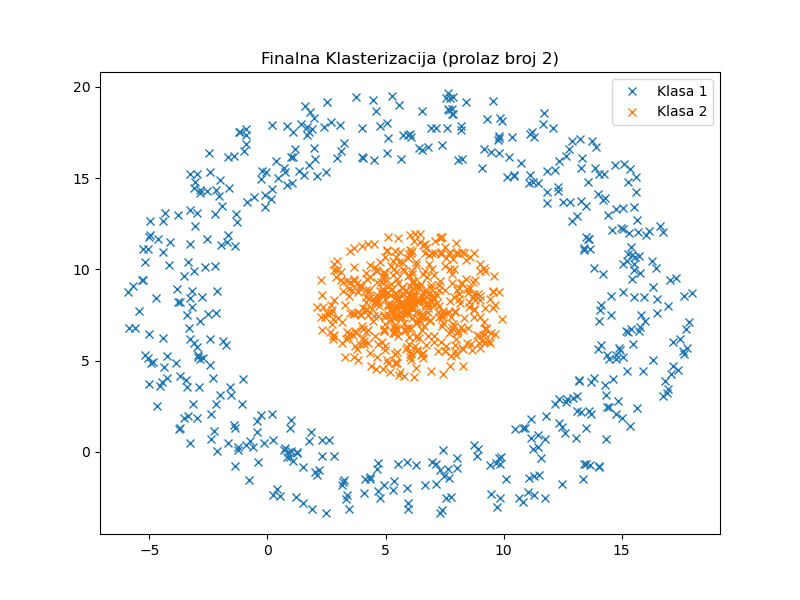

<IPython.core.display.Javascript object>


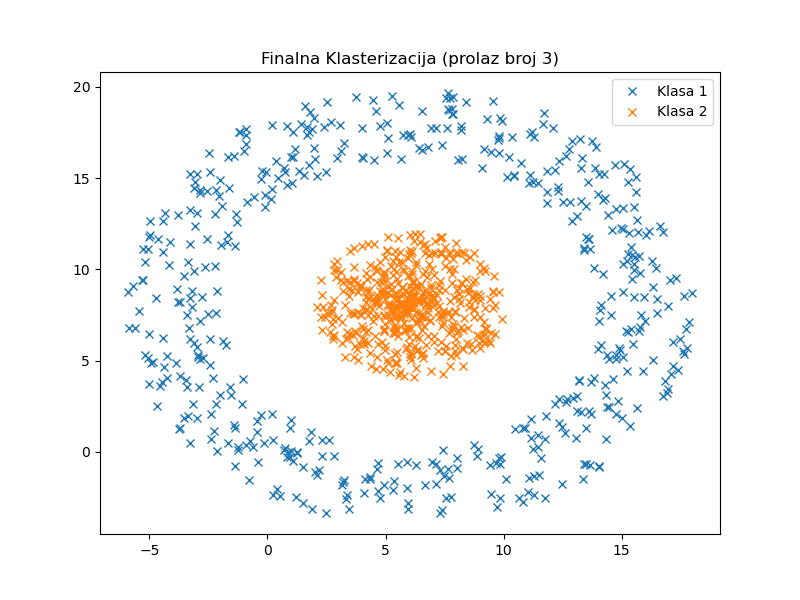

<IPython.core.display.Javascript object>


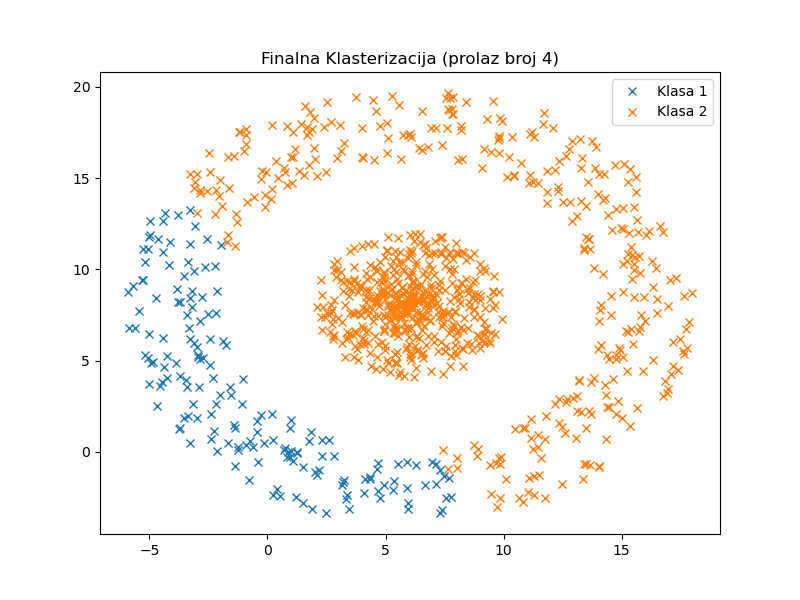

<IPython.core.display.Javascript object>


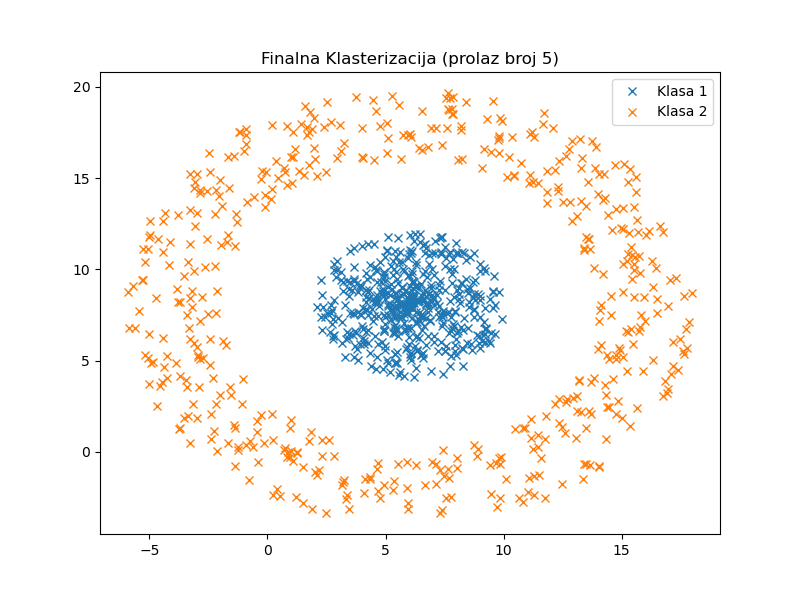

<IPython.core.display.Javascript object>


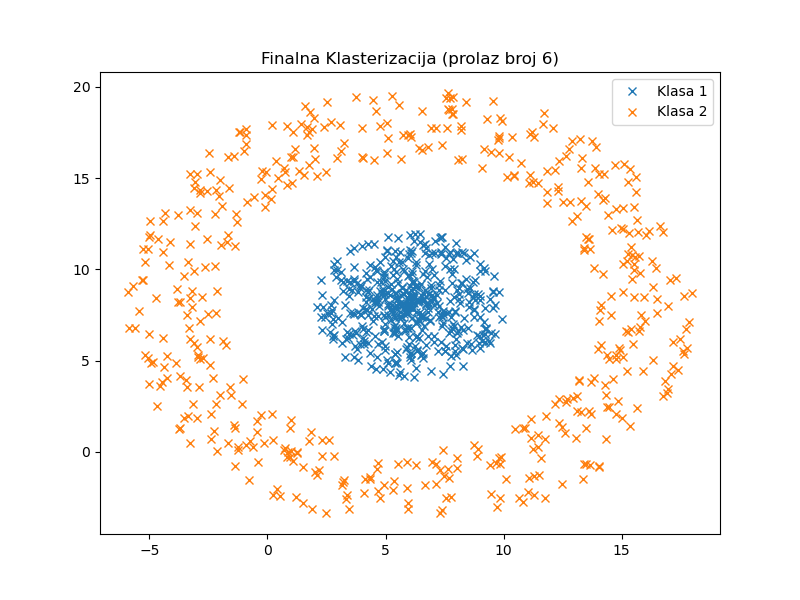

<IPython.core.display.Javascript object>


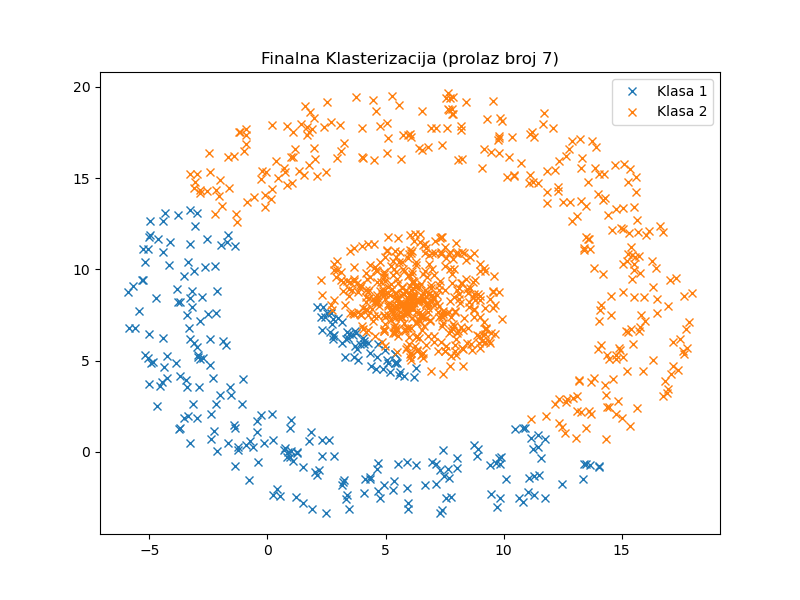

<IPython.core.display.Javascript object>


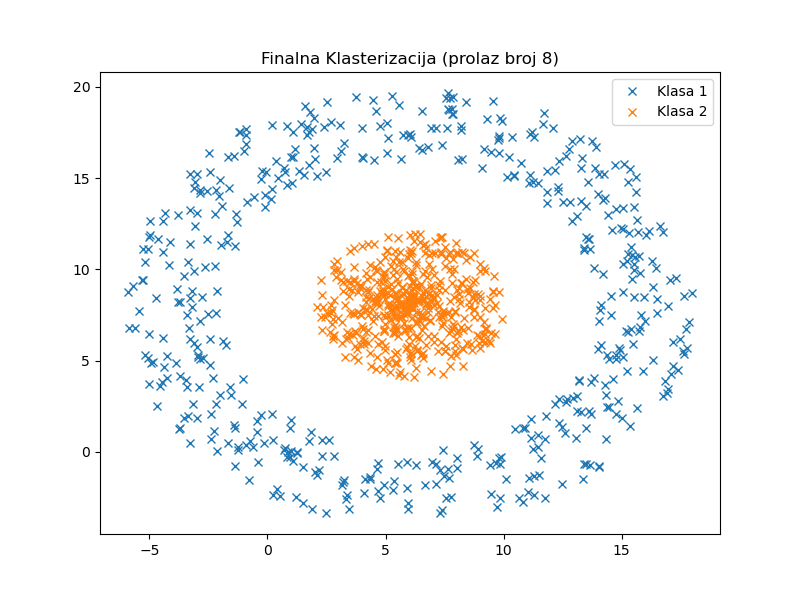

<IPython.core.display.Javascript object>


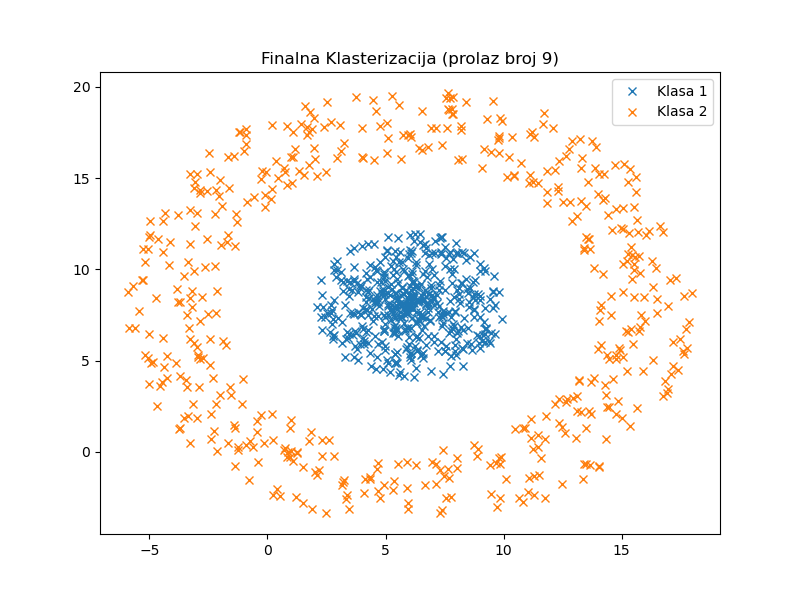

<IPython.core.display.Javascript object>


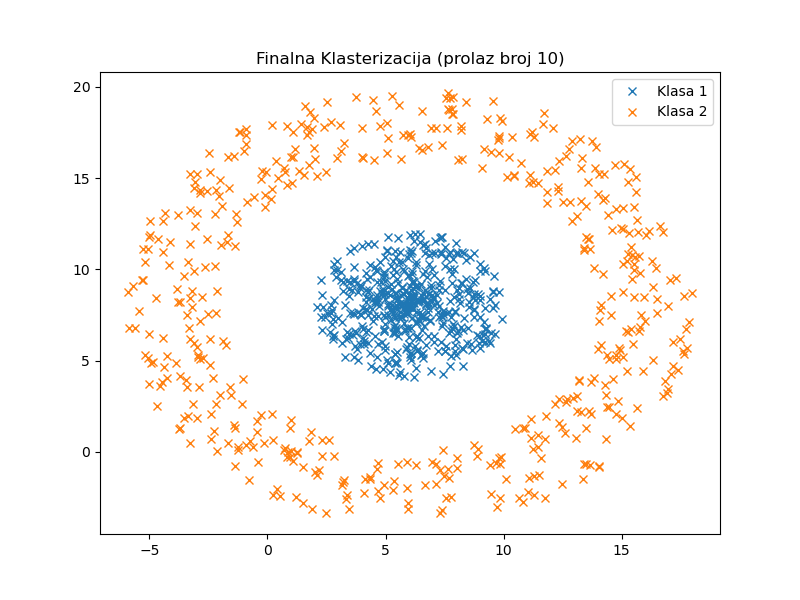

Srednji broj potrebnih iteracija je 10.8


In [57]:
l_sum = 0
m = 10

for i in range(m):
    initial_clusters = starting_clust(original_clusters, 2)
    final_clusters, l = kvadratna_dekompozicija(initial_clusters)
    plot_clusters(final_clusters, title=f"Finalna Klasterizacija (prolaz broj {i+1})")
    l_sum += l

print(f"Srednji broj potrebnih iteracija je {l_sum/m}")

Na osnovu ove analize možemo zaključiti da nasumična počenta klasterizacija ne daje dobar efekat kada koristimo kvadratnu dekompoziciju - nekada dobijamo dobre rezultate, a nekada ne. Zato ćemo sada izvršiti drugačiju početnu klasterizaciju. Po 100 odbiraka ćemo ostaviti u svojim klasama, dok ćemo ostatak nasumično raspodeliti.

<IPython.core.display.Javascript object>


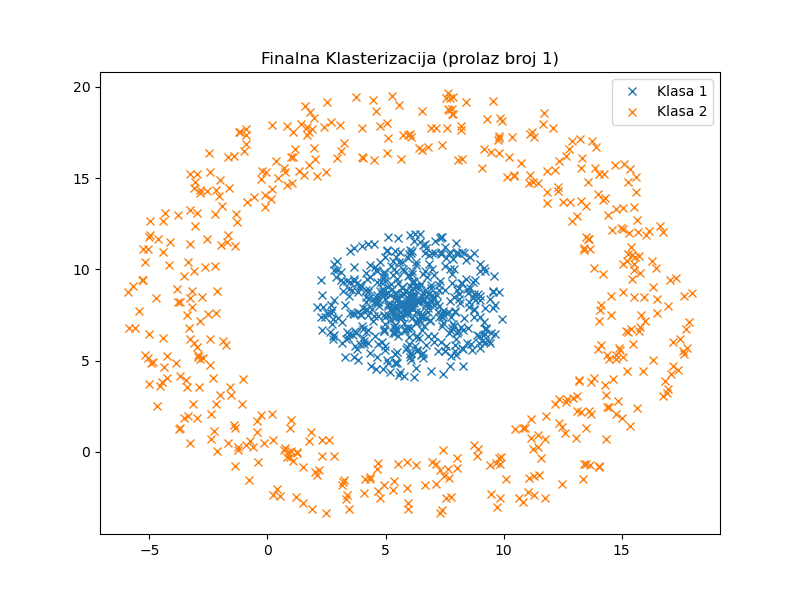

<IPython.core.display.Javascript object>


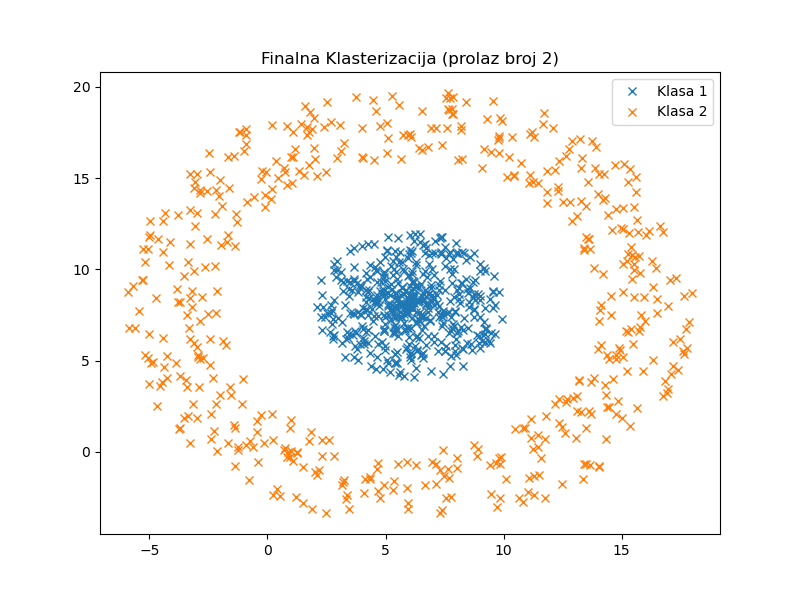

<IPython.core.display.Javascript object>


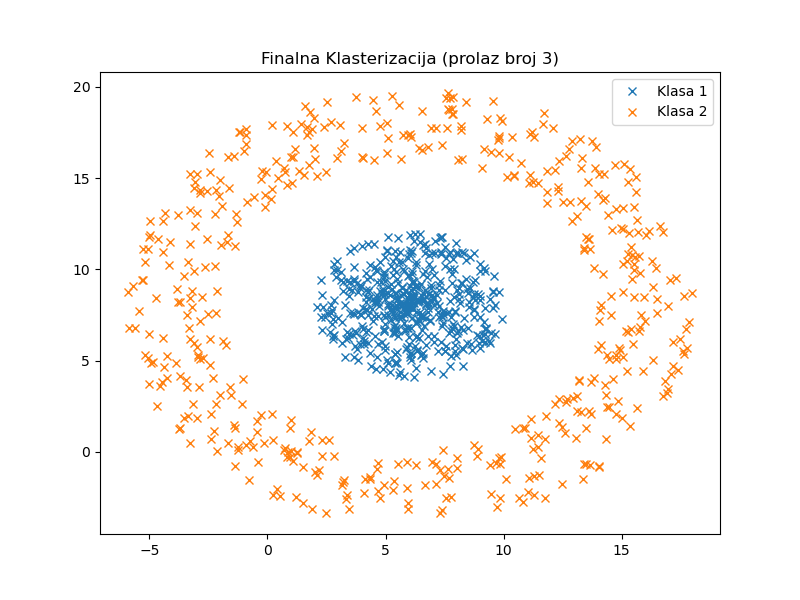

<IPython.core.display.Javascript object>


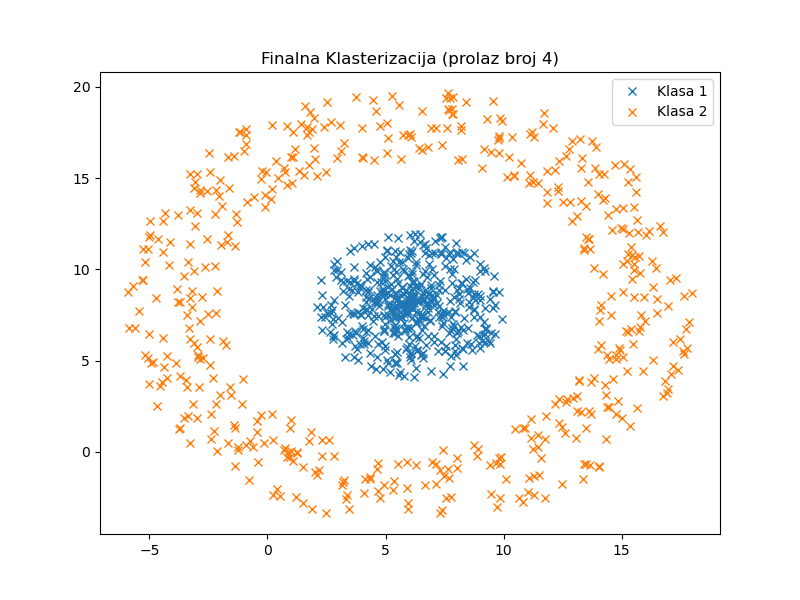

<IPython.core.display.Javascript object>


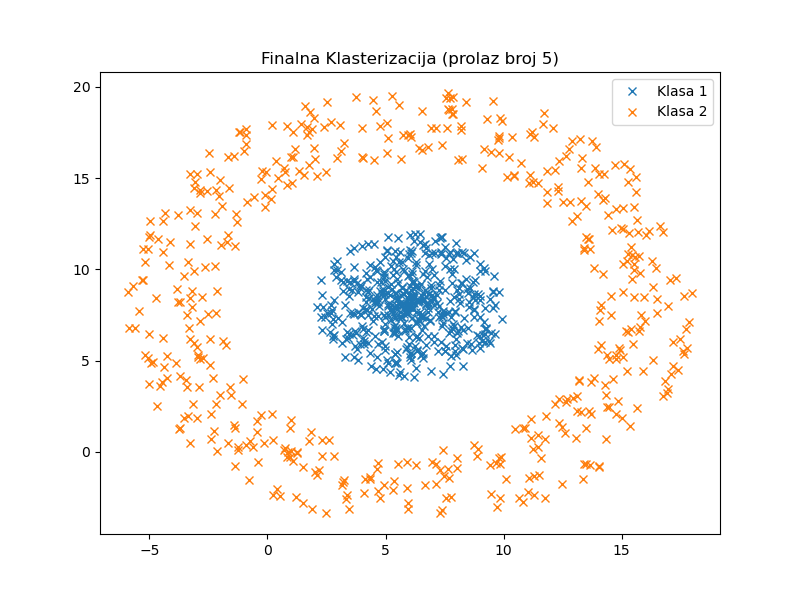

<IPython.core.display.Javascript object>


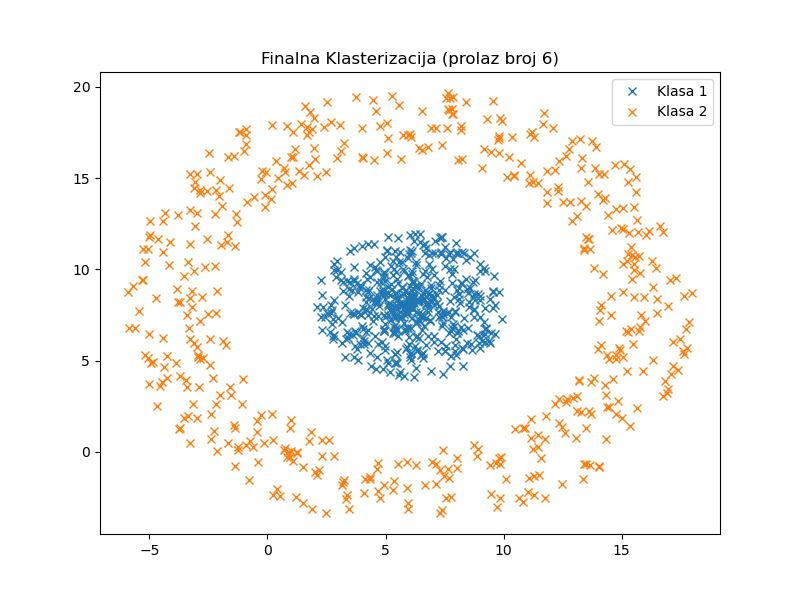

<IPython.core.display.Javascript object>


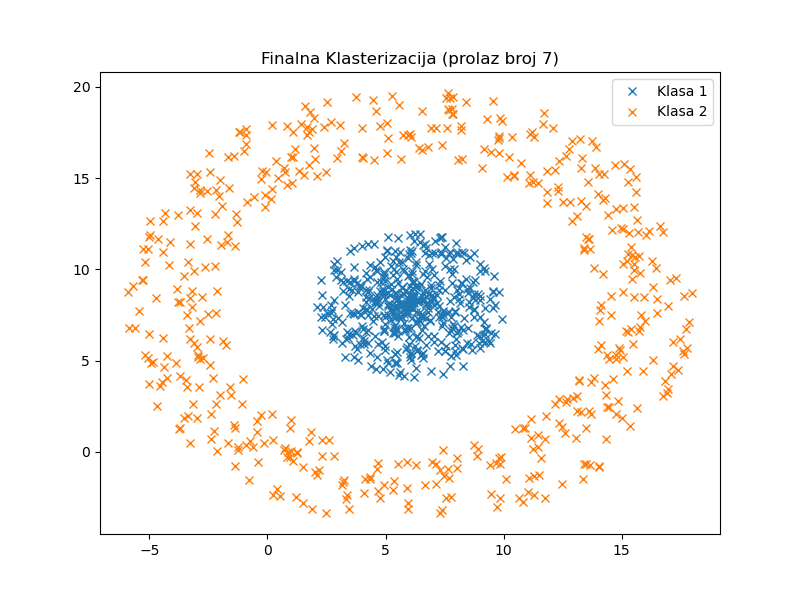

<IPython.core.display.Javascript object>


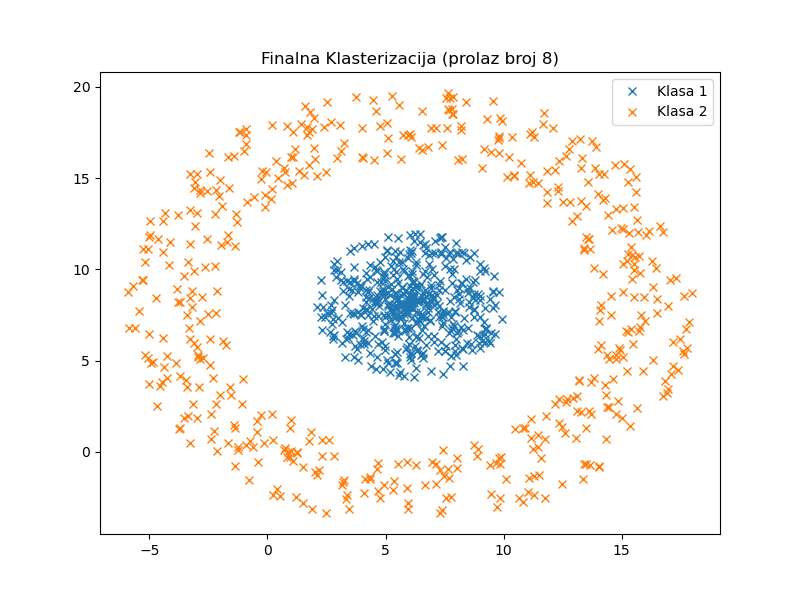

<IPython.core.display.Javascript object>


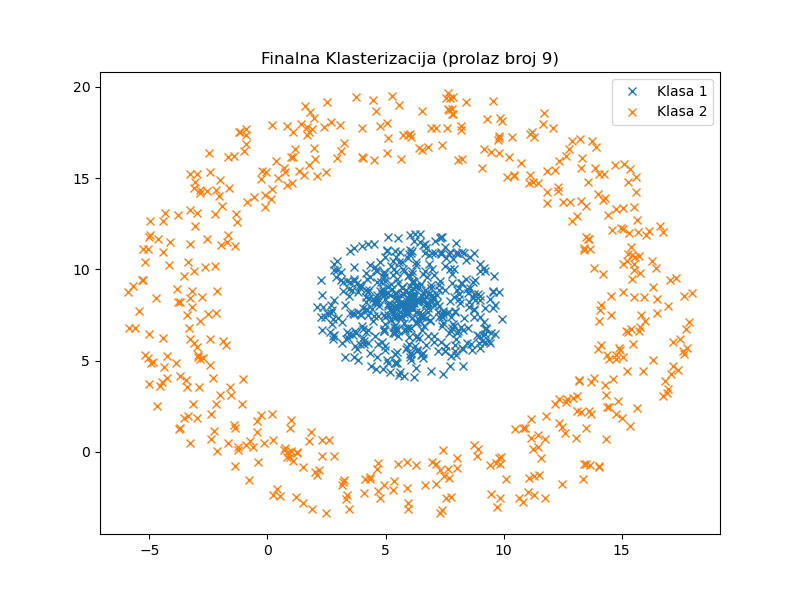

<IPython.core.display.Javascript object>


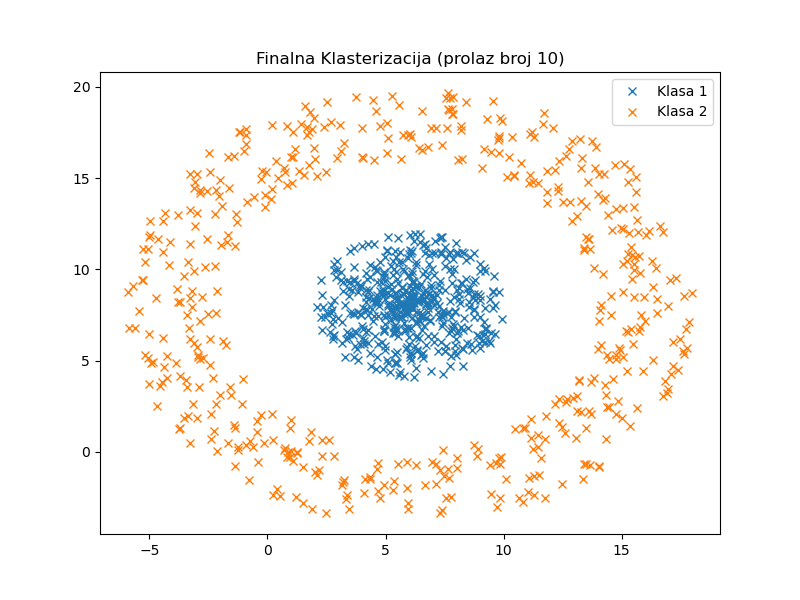

Srednji broj potrebnih iteracija je 3.6


In [58]:
l_sum = 0
m = 10

for i in range(m):
    original_clusters = [X[:,100:], Y[:,100:]]
    initial_clusters = starting_clust(original_clusters, 2)
    initial_clusters[0] = np.concatenate((X[:,0:100], initial_clusters[0]), axis=1)
    initial_clusters[1] = np.concatenate((Y[:,0:100], initial_clusters[1]), axis=1)
    final_clusters, l = kvadratna_dekompozicija(initial_clusters)
    plot_clusters(final_clusters, title=f"Finalna Klasterizacija (prolaz broj {i+1})")
    l_sum += l

print(f"Srednji broj potrebnih iteracija je {l_sum/m}")

Zaključujemo da kvadratna dekompozicija dosta bolje konvergira kada se u početnu klasterizaciju uključi neko apriorno znanje.